# Задача 4. Ансамбли

* **Дедлайн**: 05.04.2024, 23:59
* **Основной полный балл**: 5
* **Максимум баллов**: 10

## Задача

- [x] Найти данные размера хотя бы 10000, на которых можно решить задачу классификации или регрессии.
- [x] Выполнить разведочный анализ (**EDA**). При необходимости выполнить полезные преобразования данных.
- [x] Самостоятельно реализуйте алгоритмы **Bagging** и **AdaBoost**, которые позволят обучить ансамбли каких-то простых моделей, например деревьев принятия решений.
- [x] Обучите ансамбли для каких-то простых моделей, используя свои две реализации, а также реализации из **sklearn** (**Bagging**, **Random Forest**, **AdaBoost**, **Gradient Tree Boosting**, **Histogram-Based Gradient Boosting**).
- [x] При обучении использовать **подбор гиперпараметров**, **кросс-валидацию**.
- [x] Сравнить качество моделей: замерить скорость обучения, вычислить различные метрики качества, построить матрицы ошибок.
- [x] * (**+2 балла**) Также добавить в сравнение модели из библиотек **XGBoost**, **LightGBM** и **CatBoost**.
- [x] * (**+3 балла**) Для подбора гиперпараметров использовать фреймворк **Optuna**.



In [167]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

sns.set_palette('Set2')

# Разведочный анализ (EDA)

## Описание датасета

В качестве данных был взят датасет [predictive_maintenance.csv](https://www.kaggle.com/datasets/shivamb/machine-predictive-maintenance-classification).

Описание датасета: <br>

* UID - уникальный идентификатор от 1 до 10 000 <br>
* Product ID - содержит информацию о виде продукта в формате (LMH)(серийный номер), где L, M, H обозначают качество продукта (low - низкое, * medium - среднее, high - высокое), а серийный номер является уникальным для каждого продукта <br>
* air_temp (air temperature [K]) - температура воздуха в Кельвинах <br>
* process_temp (process temperature [K]) - температура машины во время работы в Кельвинах <br>
* rotational_speed (rotational speed [rpm]) - скорость вращения в оборотах в минуту <br>
* torque (torque [Nm]) - момент силы в Ньютонах на метр <br>
* tool_wear (tool wear [min]) - накопленный износ инструмента в минутах <br>

Целевые признаки:

* target (Target) - сломалась ли машина (1 = да, 0 = нет) <br>
* failure_type (Failure type) - тип поломки (если поломка произошла)

Для удобства признаки были переименованы (в скобочках указаны оригинальные названия).

In [168]:
df = pd.read_csv("data/predictive_maintenance.csv")

In [169]:
df.isnull().sum()


UID                 0
Product ID          0
type                0
air_temp            0
process_temp        0
rotational_speed    0
torque              0
tool_wear           0
target              0
failure_type        0
dtype: int64

In [170]:
df.head()

,UID,Product ID,type,air_temp,process_temp,rotational_speed,torque,tool_wear,target,failure_type
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,No Failure
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,No Failure
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,No Failure
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,No Failure
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,No Failure


In [171]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   UID               10000 non-null  int64  
 1   Product ID        10000 non-null  object 
 2   type              10000 non-null  object 
 3   air_temp          10000 non-null  float64
 4   process_temp      10000 non-null  float64
 5   rotational_speed  10000 non-null  int64  
 6   torque            10000 non-null  float64
 7   tool_wear         10000 non-null  int64  
 8   target            10000 non-null  int64  
 9   failure_type      10000 non-null  object 
dtypes: float64(3), int64(4), object(3)
memory usage: 781.4+ KB


## Первичный анализ целевых признаков

Рассмотрим статистику по целевым признакам.

In [172]:
df['target'].value_counts()

target
0    9661
1     339
Name: count, dtype: int64

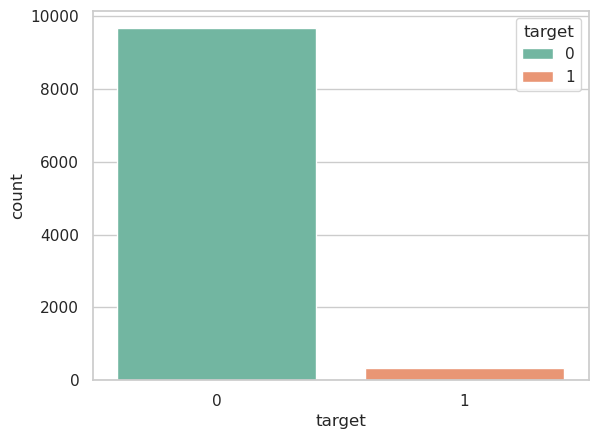

In [173]:
sns.countplot(data=df, x='target', hue='target');

In [174]:
df['target'].mean()

0.0339

Таким образом, около 3% машин из выборки оказались неисправными, что отражает первый целевой признак, указывающий на факт поломки. Теперь рассмотрим второй целевой признак, который описывает тип возникшей поломки.

In [175]:
df['failure_type'].value_counts()

failure_type
No Failure                  9652
Heat Dissipation Failure     112
Power Failure                 95
Overstrain Failure            78
Tool Wear Failure             45
Random Failures               18
Name: count, dtype: int64

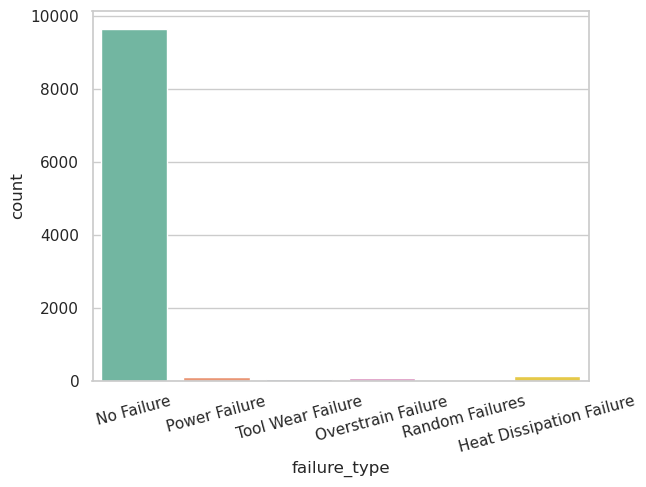

In [176]:
g = sns.countplot(df, x='failure_type', hue='failure_type')
plt.xticks(rotation=15);

Так мало что видно, поэтому нарисуем с логарифмическим масштабом

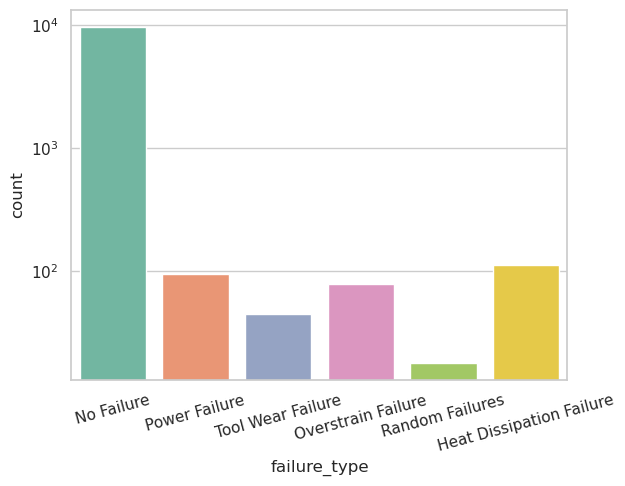

In [177]:
g = sns.countplot(df, x='failure_type', hue='failure_type')
g.set_yscale('log')
plt.xticks(rotation=15);

In [178]:
df[df['failure_type'] != 'No Failure']['failure_type'].value_counts(normalize=True)

failure_type
Heat Dissipation Failure    0.321839
Power Failure               0.272989
Overstrain Failure          0.224138
Tool Wear Failure           0.129310
Random Failures             0.051724
Name: proportion, dtype: float64

Text(0, 0.5, 'Value count')

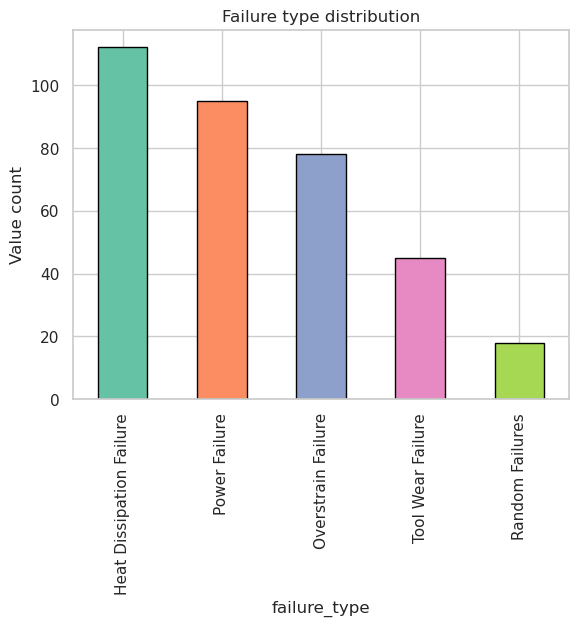

In [179]:
colors = sns.color_palette('Set2')

g = df[df['failure_type'] != 'No Failure']['failure_type'].value_counts().plot(
    kind='bar',
    color=colors,
    edgecolor='black'
)
g.set_title('Failure type distribution')
g.set_xlabel('failure_type')
g.set_ylabel('Value count')

Большая часть сбоев приходится на проблемы с теплоотведением (32%).

Однако, на данном этапе это не даёт достаточной информации для окончательных выводов.

## Анализ нецелевых признаков

### Количественные признаки

In [180]:
cont_df = df[['air_temp', 'process_temp', 'rotational_speed', 'torque', 'tool_wear']]

In [181]:
cont_df.describe()

,air_temp,process_temp,rotational_speed,torque,tool_wear
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,300.004930,310.005560,1538.776100,39.986910,107.951000
std,2.000259,1.483734,179.284096,9.968934,63.654147
min,295.300000,305.700000,1168.000000,3.800000,0.000000
25%,298.300000,308.800000,1423.000000,33.200000,53.000000
50%,300.100000,310.100000,1503.000000,40.100000,108.000000
75%,301.500000,311.100000,1612.000000,46.800000,162.000000
max,304.500000,313.800000,2886.000000,76.600000,253.000000


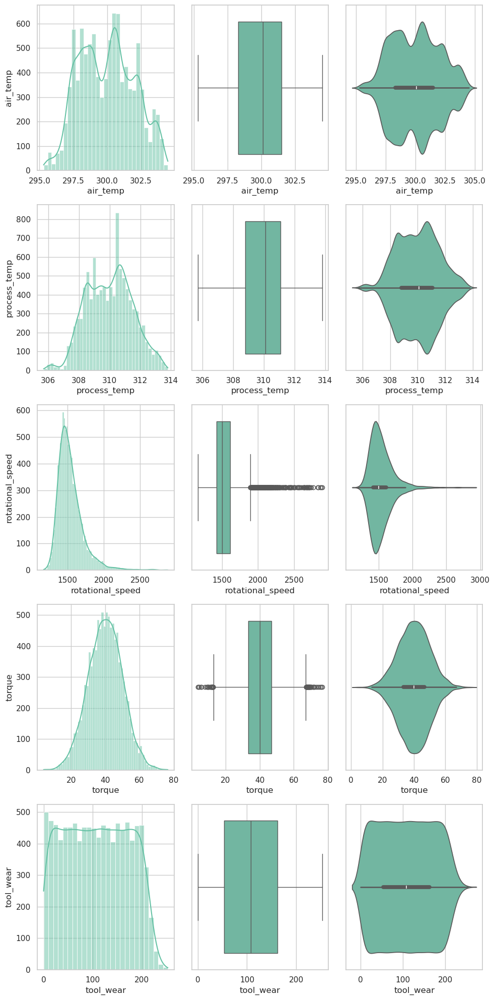

In [182]:
fig, axes = plt.subplots(nrows=cont_df.shape[1], ncols=3, figsize=(10, 20))

for i, col in enumerate(cont_df.columns):
    x = cont_df[col]

    sns.histplot(x=x, kde=True, ax=axes[i, 0])
    sns.boxplot(x=x, ax=axes[i, 1])
    sns.violinplot(x=x, ax=axes[i, 2])

    axes[i, 0].set_ylabel(col)

plt.tight_layout()
plt.show()

Можно отметить следующие наблюдения:

- В распределении переменной `air_temp` видны два отчетливых пика.
- Распределение переменной `rotational_speed` является асимметричным и узким.
- Распределение переменной `torque` симметрично, но также выглядит "острым".

Далее рассмотрим третий и четвертый моменты для переменных `rotational_speed` и `torque` (коэффициенты асимметрии и эксцесса соответственно).

In [183]:
metrics = ['rotational_speed', 'torque']

print(pd.DataFrame({
    'Metric': [f'{metric} skew' for metric in metrics] + [f'{metric} kurtosis' for metric in metrics],
    'Value': [cont_df[metric].skew() for metric in metrics] + [cont_df[metric].kurtosis() for metric in metrics]
}))

                      Metric     Value
0      rotational_speed skew  1.993171
1                torque skew -0.009517
2  rotational_speed kurtosis  7.392945
3            torque kurtosis -0.013241


Действительно, `rotational_speed` демонстрирует 1) значительное смещение и 2) "острую" форму. Это указывает на наличие большого количества выбросов в выборке, что хорошо видно на boxplot для `rotational_speed`. В то же время, `torque` показал совершенно неострую форму.

In [184]:
df.head()

,UID,Product ID,type,air_temp,process_temp,rotational_speed,torque,tool_wear,target,failure_type
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,No Failure
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,No Failure
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,No Failure
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,No Failure
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,No Failure


### Категориальные признаки

В датасете представленно два категориальных признака: `Product ID` и `Type`, причем `Type` служит идентификатором качества продукта и используется в `Product ID`. Кроме того, серийный номер не имеет практической ценности, так как у нас уже есть уникальные идентификаторы (`UID`). Следовательно, необходимость в `Product ID` отпадает.

In [185]:
df.drop(columns='Product ID', inplace=True)

Рассмотрим статистики для признака `Type`:

In [186]:
df['type'].value_counts()

type
L    6000
M    2997
H    1003
Name: count, dtype: int64

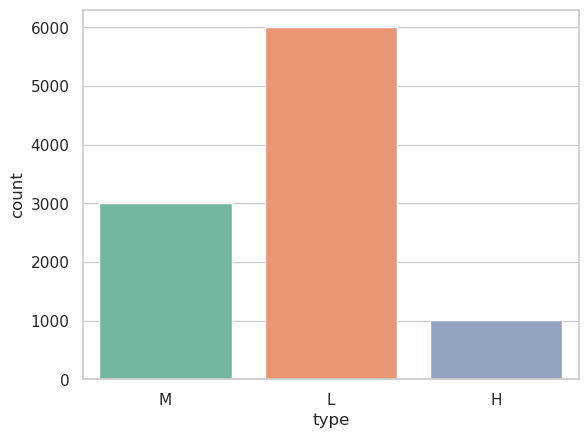

In [187]:
sns.countplot(df, x='type', hue='type');

## Нецелевые признаки против целевых

### Количественные признаки

In [188]:
cont_cols = ['air_temp', 'process_temp', 'rotational_speed', 'torque', 'tool_wear']
cont_df = df[cont_cols + ['target', 'failure_type']]

#### Против признака `target`

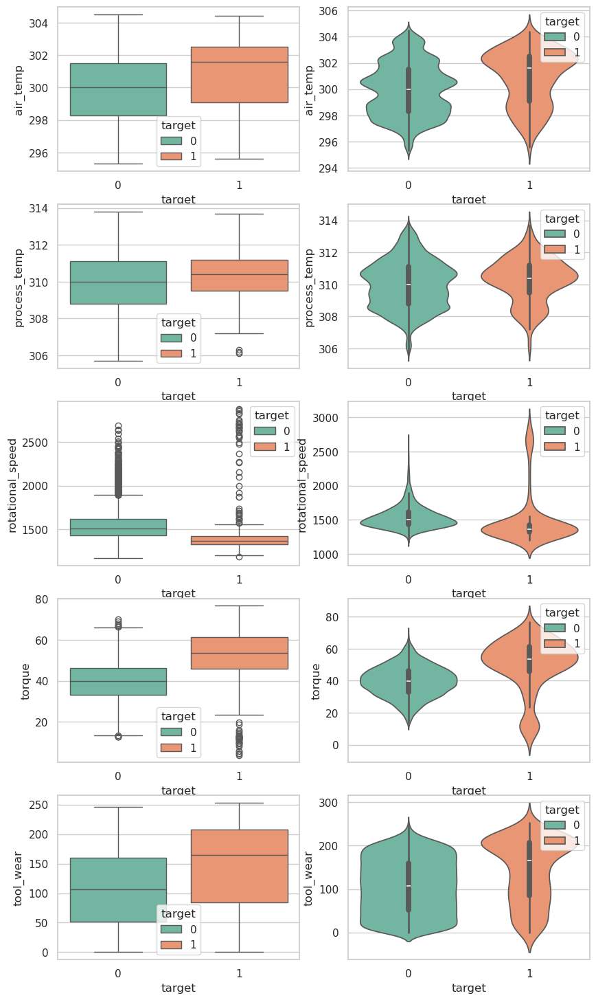

In [189]:
_, axes = plt.subplots(len(cont_cols), 2, figsize=(10, 18))
for i, col in enumerate(cont_cols):
    sns.boxplot(x='target', y=col, data=cont_df, hue='target', ax=axes[i, 0])
    sns.violinplot(x='target', y=col, data=cont_df, hue='target', ax=axes[i, 1])
    axes[i, 0].set_ylabel(col)

Выводы:
- При повышении температуры воздуха увеличивается доля поломок.
- Сбои не зависят от `process_temp` и `Rotation speed`.
- Доля поломок выше при высоких значениях `torque`.
- С увеличением износа возрастает количество поломок.

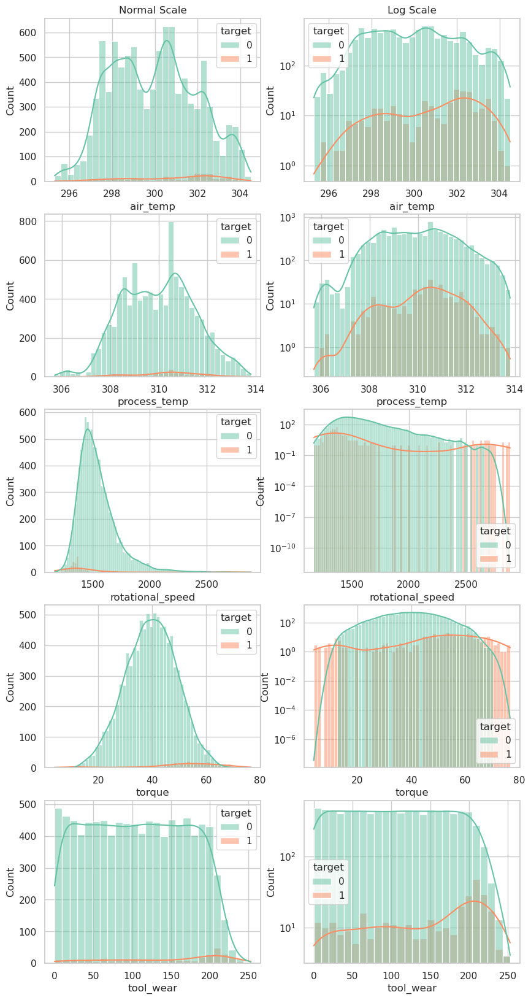

In [190]:
_, axes = plt.subplots(len(cont_cols), 2, figsize=(10, 20))
for i, feat in enumerate(cont_cols):
    nscale_g = sns.histplot(x=feat, data=cont_df, hue='target', kde=True, ax=axes[i, 0])
    logscale_g = sns.histplot(x=feat, data=cont_df, hue='target', kde=True, ax=axes[i, 1])
    if i == 0:
        nscale_g.set_title('Normal Scale')
        logscale_g.set_title("Log Scale")
    logscale_g.set_yscale("log")

#### Против признака `failure_type`

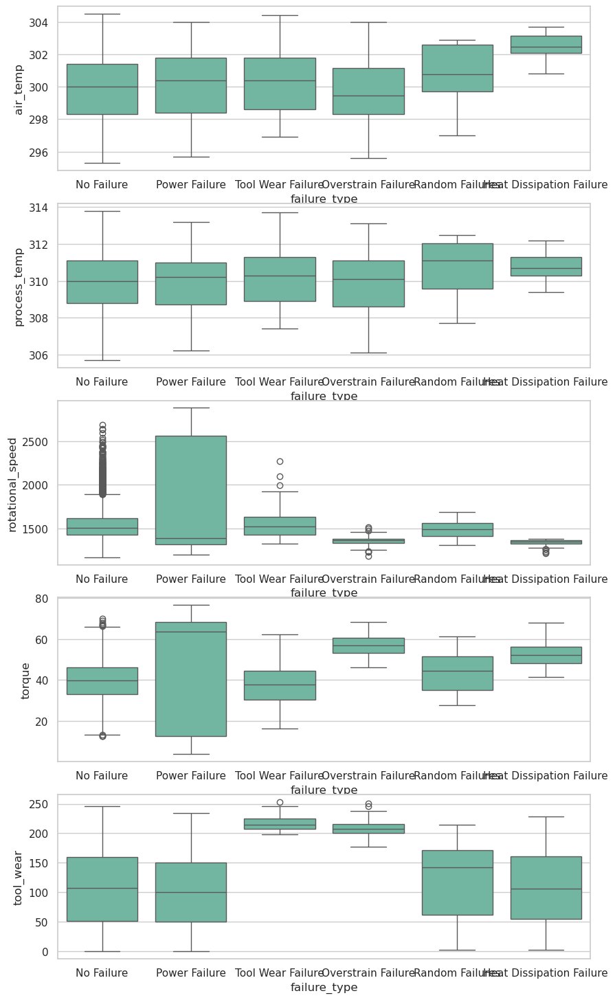

In [191]:
_, axes = plt.subplots(len(cont_cols), figsize=(10, 18))
for i, feat in enumerate(cont_cols):
    sns.boxplot(x='failure_type', y=feat, data=cont_df, ax=axes[i])
    axes[i].set_ylabel(feat)

Выводы:
- В машинах, которые сломались из-за проблем с теплоотведением, температурные значения были немного выше (что, в общем-то, логично), хотя влияние `process_temp` менее выражено.
- Перегрузочные сбои и сбои из-за теплоотведения коррелируют с более высокими значениями `torque` и более низким `rotational_speed`.
- Износ очевидно наблюдается в поломках, связанных с износом, но также (что менее очевидно) влияет на перегрузочные сбои.
- На данный момент может показаться, что предсказать перебои питания будет сложно, поскольку в одном случае они происходят независимо от нецелевых значений (например, `torque`), а в другом — неотделимы от других типов сбоев.

### Категориальный признак Type

#### Против признака `target`

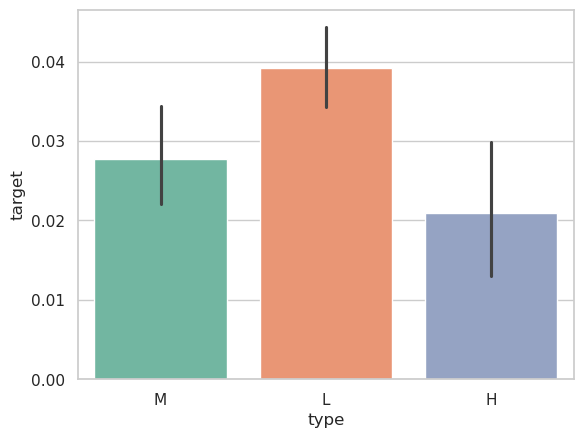

In [192]:
sns.barplot(x='type', y='target', hue='type', data=df);

Как видно, наибольшее количество поломок наблюдается у машин категории `Low quality`, в то время как у машин категории `High quality` их меньше всего. Это может быть связано с тем, что более высокие категории представляют собой более "качественные" машины. Однако, вероятнее всего, такая картина объясняется тем, что машин низких категорий просто больше, что подтверждается следующей диаграммой.

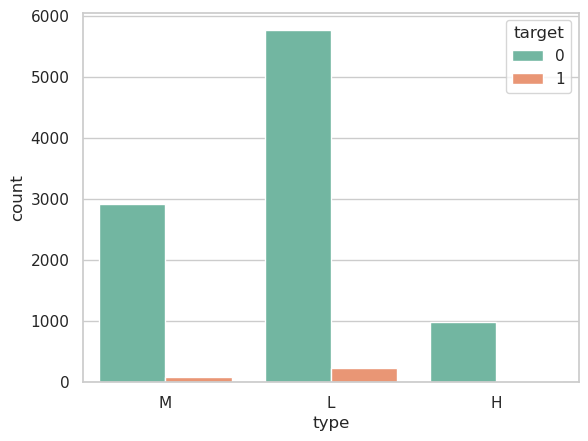

In [193]:
sns.countplot(x='type', hue='target', data=df);

#### Против признака `failure_type`

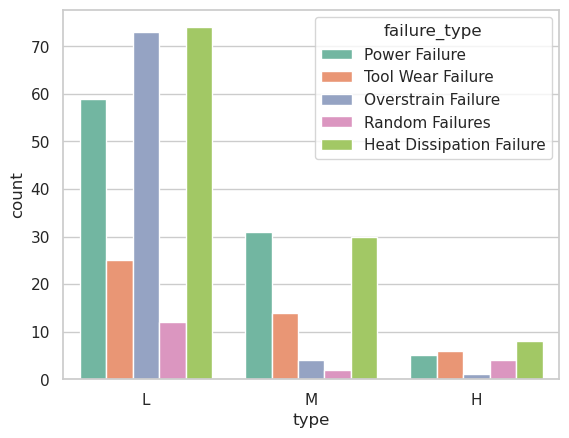

In [194]:
sns.countplot(x='type', hue='failure_type', data=df[df['failure_type'] != 'No Failure']);

Выводы:
- Значительная доля машин низкого качества испытывает перегрузки.
- Проблемы с теплоотведением являются одной из основных причин поломок в каждой из категорий.
- В большинстве случаев наблюдается схожий тренд: чем выше качество, тем меньше поломок, и причины поломок упорядочены в следующем порядке: теплоотведение >= сбой питания >= износ инструмента >= перегрузка >= случайные сбои, за исключением, возможно, небольшого увеличения случайных сбоев в высшей категории.

## Взаимодействие нецелевых с нецелевыми

### Количественные с количественными

In [195]:
cont_df = df[cont_cols]

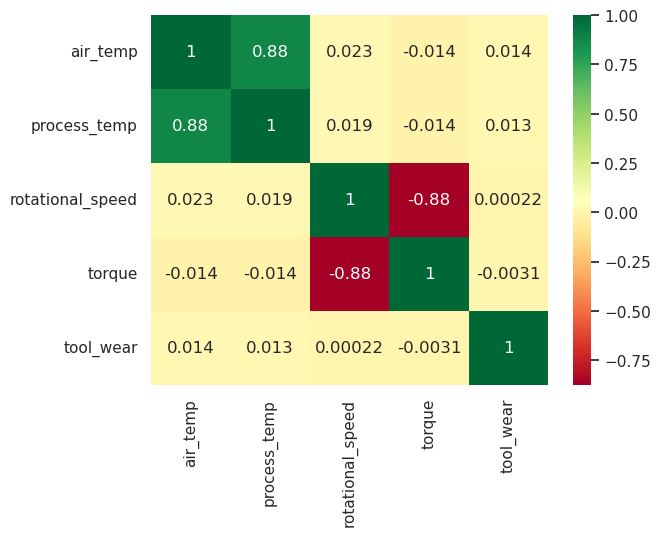

In [196]:
sns.heatmap(cont_df.corr(), annot=True, cmap='RdYlGn');

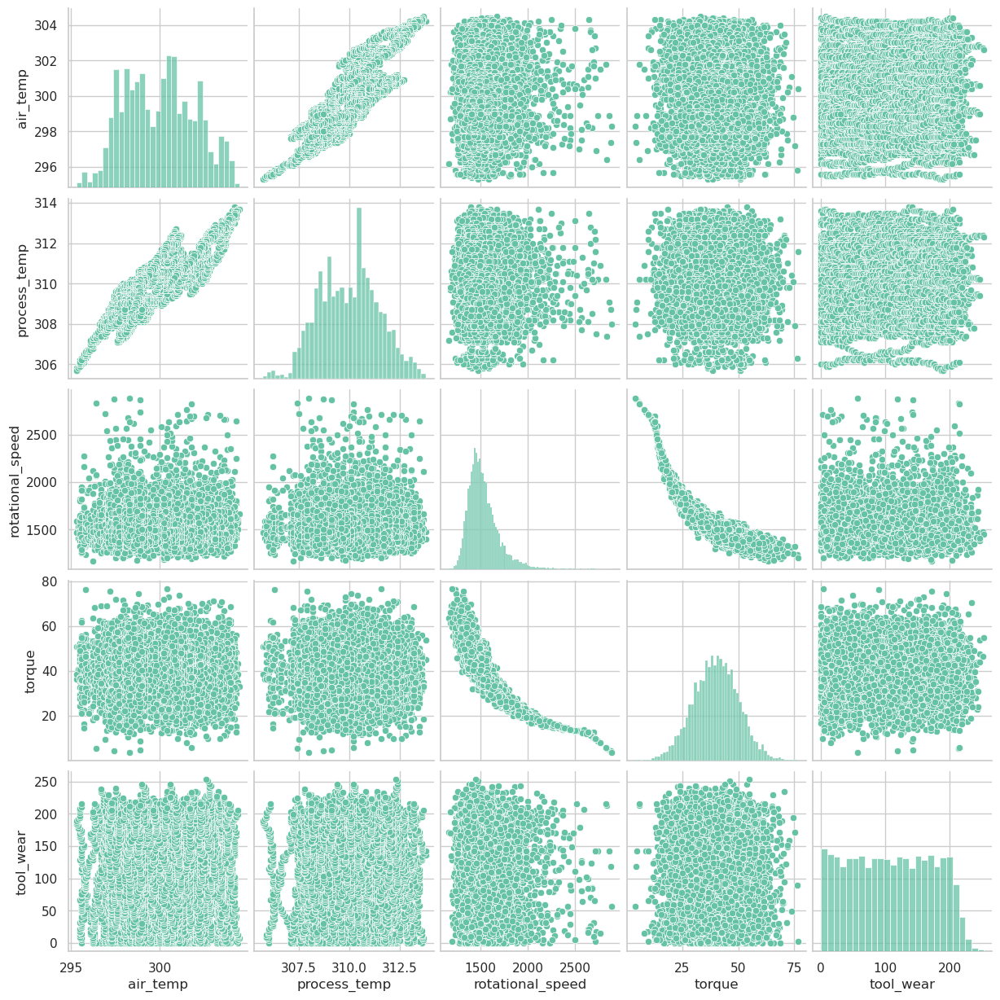

In [197]:
sns.pairplot(cont_df);

- Существует высокая корреляция (0.88) между `air_temp` и `process_temp`.
- Также наблюдается значительная отрицательная корреляция (-0.88) между `rotational_speed` и `torque`.

В каждом из этих случаев можно исключить один из признаков.

### Количественные с категориальным `Type`

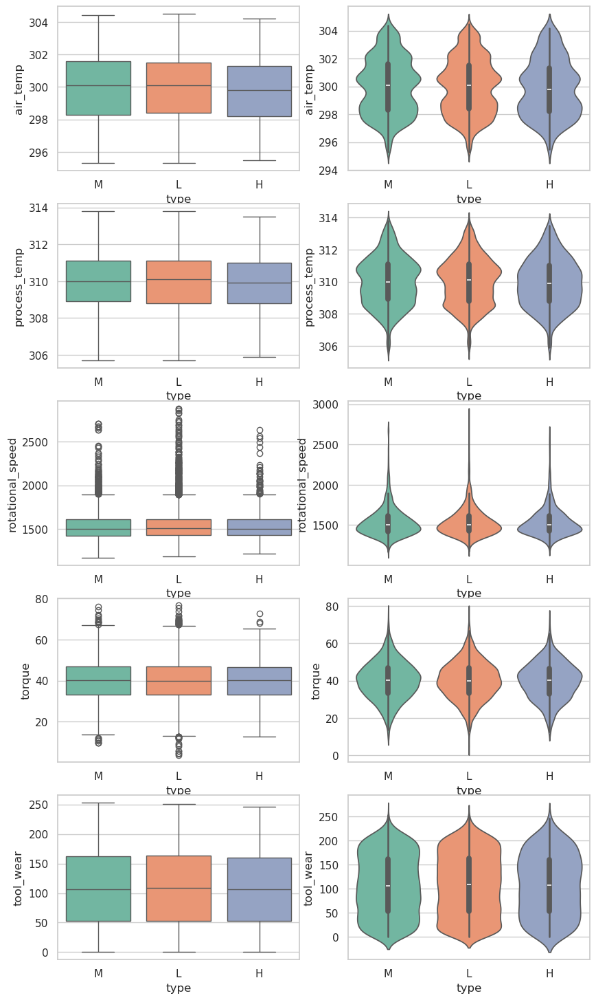

In [198]:
_, axes = plt.subplots(len(cont_cols), 2, figsize=(10, 18))
for i, feat in enumerate(cont_cols):
    sns.boxplot(x='type', y=feat, data=df, hue='type', ax=axes[i, 0])
    sns.violinplot(x='type', y=feat, data=df, hue='type', ax=axes[i, 1])
    axes[i, 0].set_ylabel(feat)

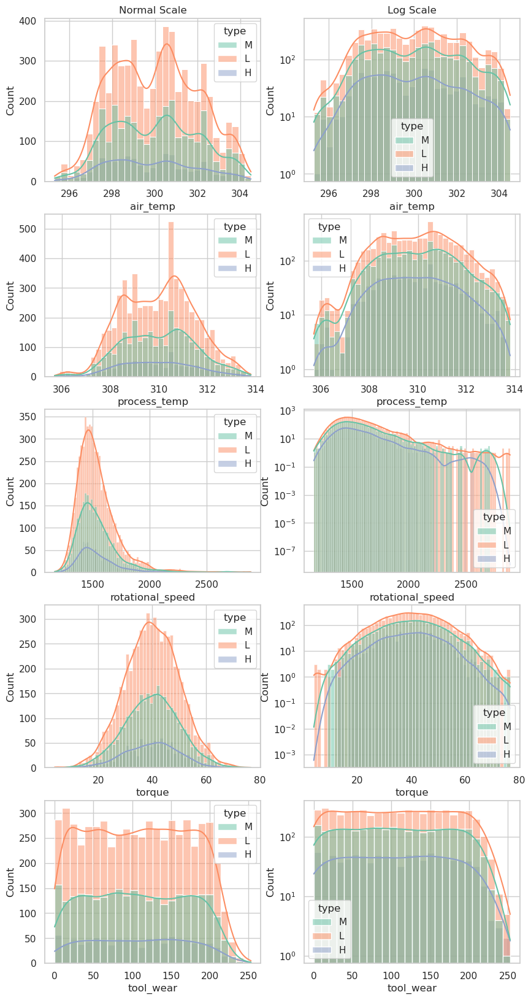

In [199]:
_, axes = plt.subplots(len(cont_cols), 2, figsize=(10, 20))
for i, feat in enumerate(cont_cols):
    nscale_g = sns.histplot(x=feat, data=df, hue='type', kde=True, ax=axes[i, 0])
    logscale_g = sns.histplot(x=feat, data=df, hue='type', kde=True, ax=axes[i, 1])
    if i == 0:
        nscale_g.set_title('Normal Scale')
        logscale_g.set_title("Log Scale")
    logscale_g.set_yscale("log")

Можно заметить, что машины с более низкой категорией не показывают более низких показателей.

## Нецелевые признаки против целевых

### Признак `target`

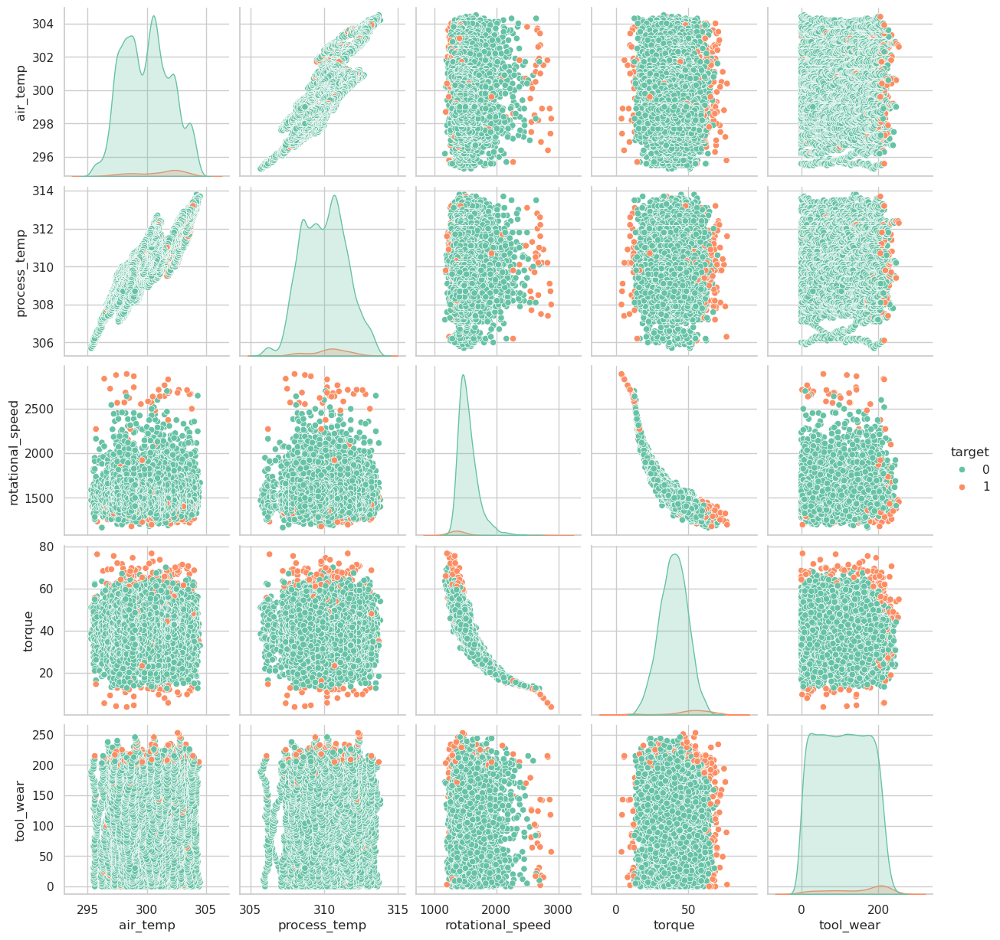

In [200]:
sns.pairplot(df[cont_cols + ['target']], hue='target');

В основном оранжевые точки, представляющие сломавшиеся машины, располагаются вдоль одной из осей, что указывает на отсутствие явной зависимости целевой переменной от двух количественных нецелевых переменных.

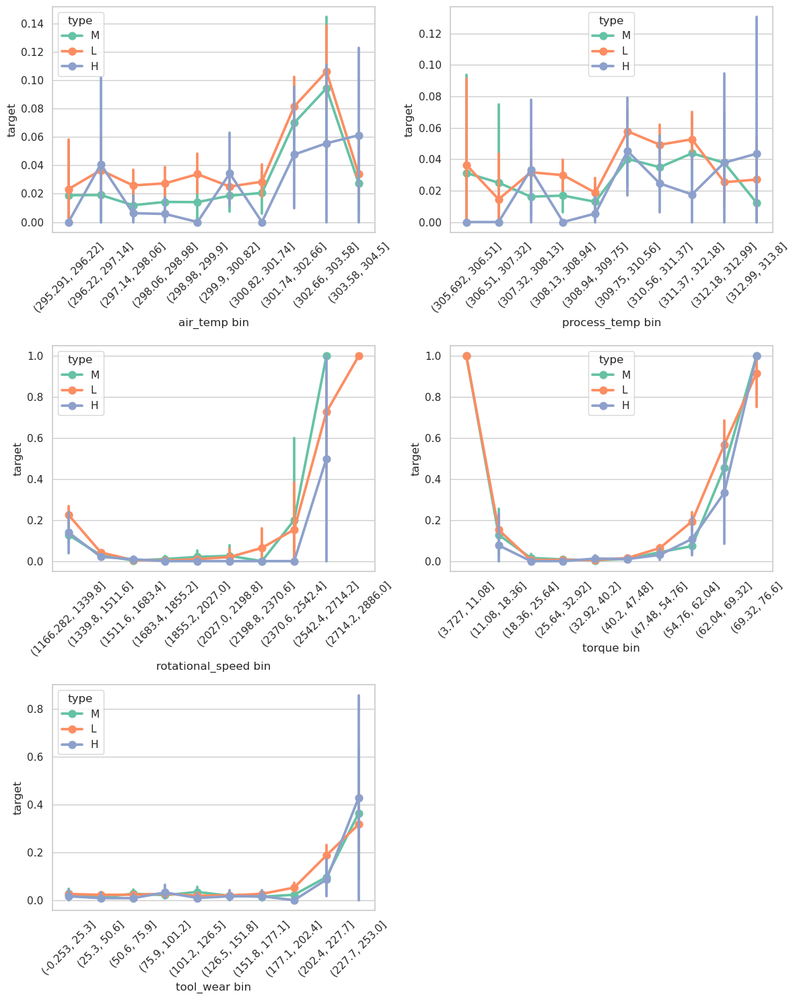

In [201]:
num_plots = len(cont_cols)
num_cols = 2
num_rows = (num_plots + num_cols - 1) // num_cols

_, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 5 * num_rows))
axes = axes.flatten()

for i, feat in enumerate(cont_cols):
    df[f'{feat} bin'] = pd.cut(df[feat], 10)
    sns.pointplot(x=f'{feat} bin', y='target', hue='type', data=df, ax=axes[i])
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45)

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

Во всех случаях наблюдается схожий тренд, независимо от категории качества.

### Признак `failure_type`

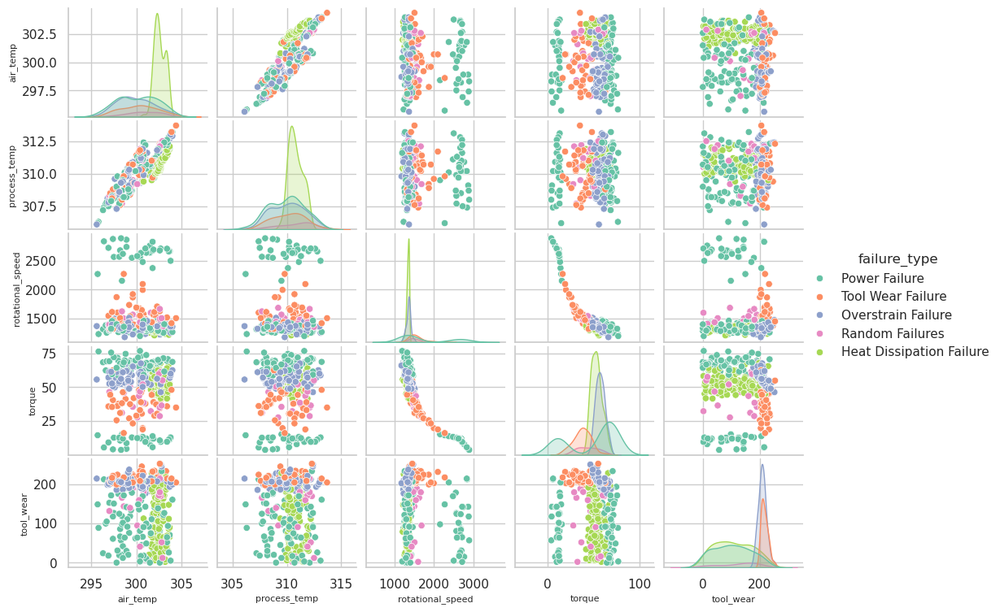

In [202]:
cont_with_ftypes = cont_cols + ['failure_type']
g = sns.pairplot(df[df['failure_type'] != 'No Failure'][cont_with_ftypes],
                 hue='failure_type',
                 height=4)

g.fig.set_size_inches(12, 8)

for ax in g.axes.flatten():
    ax.set_xlabel(ax.get_xlabel(), fontsize=8)
    ax.set_ylabel(ax.get_ylabel(), fontsize=8)

plt.subplots_adjust(top=0.9, right=0.8)

plt.show()

Выводы:
- Высокий износ в сочетании с низкой скоростью вращения (или износ и высокий `torque`) способствуют перегрузочным сбоям.
- Значительный износ вместе со средней или высокой скоростью вращения (или износ и низким или средним `torque`) влияют на сбои, связанные с износом.

# Preprocessing

In [203]:
df['type'].replace({
    'L': 0,
    'M': 1,
    'H': 2
}, inplace=True)

df['failure_type'].replace({
    'No Failure': 0,
    'Power Failure': 1,
    'Tool Wear Failure': 2,
    'Overstrain Failure': 3,
    'Random Failures': 4,
    'Heat Dissipation Failure': 5
}, inplace=True)

In [204]:
y_target = df['target']
y_ftype = df['failure_type']
df = df[['type', 'air_temp', 'torque', 'tool_wear']].rename(
    columns={'type': 'type', 'air_temp': 'air_temp', 'torque': 'torque', 'tool_wear': 'tool_wear'}
)

# Подбор параметров и тренировка моделей

## Алгоритм `Bagging`

In [205]:
from sklearn.utils import resample
from sklearn.tree import DecisionTreeClassifier
from sklearn.base import BaseEstimator

In [206]:
class CustomBaggingClassifier(BaseEstimator):
    def __init__(self, n_estimators=10, max_depth=5, random_state=None):
        self.n_estimators = n_estimators
        self.max_depth = max_depth
        self.random_state = random_state

    def fit(self, X, y):
        self._models = []
        for _ in range(self.n_estimators):
            X_loc, y_loc = resample(X, y, random_state=self.random_state)
            model = DecisionTreeClassifier(max_depth=self.max_depth, random_state=self.random_state)
            model.fit(X_loc, y_loc)
            self._models.append(model)

    def predict(self, X):
        predictions = []
        for model in self._models:
            model_prediction = model.predict(X)
            predictions.append(model_prediction)

        predictions = np.array(predictions)
        majority_vote = np.apply_along_axis(lambda x: np.argmax(np.bincount(x)), axis=0, arr=predictions)
        return majority_vote

## Алгоритм `AdaBoosting`

In [207]:
class CustomAdaBoosting(BaseEstimator):
    def __init__(self, n_estimators=10, max_depth=5, random_state=None):
        self.n_estimators = n_estimators
        self.max_depth = max_depth
        self.random_state = random_state

    def fit(self, X, y):
        self._models = []
        self._alphas = []
        weights = np.full(len(X), 1 / len(X))

        for i in range(self.n_estimators):
            model = DecisionTreeClassifier(max_depth=self.max_depth, random_state=self.random_state)
            model.fit(X, y, weights)
            e = 1 - model.score(X, y, weights)
            self._alphas.append(np.log((1 - e) / e) / 2)
            weights = weights * np.exp(self._alphas[i] * (y != model.predict(X)))
            weights = weights / np.sum(weights)
            self._models.append(model)
        self._alphas = self._alphas / np.sum(self._alphas)

    def predict(self, X):
        return np.around(np.sum([alpha * model.predict(X) for alpha, model in zip(self._alphas, self._models)], axis=0))

## Выделяем данные для обучения и тестирования

In [208]:
import optuna
from sklearn.model_selection import cross_validate, train_test_split, StratifiedKFold
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

In [209]:
X_train_target, X_test_target, y_train_target, y_test_target = train_test_split(df, y_target, test_size=0.2, random_state=42)
X_train_type, X_test_type, y_train_type, y_test_type = train_test_split(df, y_ftype, test_size=0.2, random_state=42)

## Подбор параметров

In [210]:
def tune(estimator, params, X_train, y_train):
    study = optuna.create_study(direction='maximize')
    model = optuna.integration.OptunaSearchCV(
        estimator=estimator,
        param_distributions=params,
        scoring='accuracy',
        study=study,
        random_state=42,
    )

    results = cross_validate(
        estimator=model,
        X=X_train,
        y=y_train,
        cv=StratifiedKFold(shuffle=True, random_state=42),
        scoring='accuracy',
        return_estimator=True
    )

    df = pd.DataFrame(results)
    df['best_params'] = df['estimator'].apply(lambda x : x.best_params_)
    df.drop(columns='estimator', inplace=True)

    return pd.concat([df.drop(columns='best_params'), df['best_params'].apply(pd.Series)], axis=1)

In [211]:
def run_tune(ensembles, X, y):
    tune_result_list = []
    for ensemble in ensembles:
        df = tune(**ensemble, X_train=X, y_train=y)
        df['name'] = type(ensemble['estimator']).__name__
        tune_result_list.append(df)

    return pd.concat(tune_result_list)

In [212]:
ensembles = [
    {
        'estimator': BaggingClassifier(random_state=42),
        'params': {
            'n_estimators': optuna.distributions.CategoricalDistribution([5, 10, 15, 20, 35, 50, 100]),
            'max_samples': optuna.distributions.CategoricalDistribution([1 / 3, 2 / 3, 1]),
            'max_features': optuna.distributions.CategoricalDistribution([1 / 3, 2 / 3, 1])
        }
    },
    {
        'estimator': RandomForestClassifier(random_state=42),
        'params': {
            'n_estimators': optuna.distributions.CategoricalDistribution([5, 10, 15, 20, 35, 50, 100]),
            'max_depth': optuna.distributions.CategoricalDistribution([1, 2, 3, 5, 7, 10]),
            'min_samples_split': optuna.distributions.CategoricalDistribution([2, 3, 4, 5]),
            'min_samples_leaf': optuna.distributions.CategoricalDistribution([1, 2, 3, 4, 5]),
        }
    },
    {
        'estimator': AdaBoostClassifier(random_state=42),
        'params': {
            'n_estimators': optuna.distributions.CategoricalDistribution([5, 10, 15, 20, 35, 50, 100]),
        }
    },
    {
        'estimator': GradientBoostingClassifier(random_state=42),
        'params': {
            'n_estimators': optuna.distributions.CategoricalDistribution([5, 10, 15, 20, 35, 50, 100]),
            'max_depth': optuna.distributions.CategoricalDistribution([1, 2, 3, 5, 7]),
            'max_features': optuna.distributions.CategoricalDistribution([1 / 3, 2 / 3, 1])
        }
    },
    {
        'estimator': HistGradientBoostingClassifier(random_state=42),
        'params': {
            'max_iter': optuna.distributions.CategoricalDistribution([5, 10, 15, 20]),
            'max_depth': optuna.distributions.CategoricalDistribution([1, 2, 3, 5, 7]),
            'max_features': optuna.distributions.CategoricalDistribution([1 / 3, 2 / 3, 1])
        }
    },
    {
        'estimator': XGBClassifier(random_state=42),
        'params': {
            'n_estimators': optuna.distributions.CategoricalDistribution([5, 10, 15, 20, 35, 50, 100]),
            'max_depth': optuna.distributions.CategoricalDistribution([1, 2, 3, 5, 7]),
        }
    },
    {
        'estimator': LGBMClassifier(random_state=42),
        'params': {
            'n_estimators': optuna.distributions.CategoricalDistribution([5, 10, 15, 20, 35, 50, 100]),
            'max_depth': optuna.distributions.CategoricalDistribution([1, 2, 3, 5, 7]),
            'num_leaves': optuna.distributions.CategoricalDistribution([10, 20, 30, 40, 50]),
        }
    },
    {
        'estimator': CatBoostClassifier(random_state=42),
        'params': {
            'n_estimators': optuna.distributions.CategoricalDistribution([5, 10, 15, 20, 35, 50, 100]),
            'depth': optuna.distributions.CategoricalDistribution([1, 2, 3, 5, 7]),
        }
    },
    {
        'estimator': CustomBaggingClassifier(random_state=42),
        'params': {
            'n_estimators': optuna.distributions.CategoricalDistribution([5, 10, 15, 20, 35, 50, 100]),
            'max_depth': optuna.distributions.CategoricalDistribution([1, 2, 3, 5, 7, 10]),
        }
    },
    {
        'estimator': CustomAdaBoosting(random_state=42),
        'params': {
            'n_estimators': optuna.distributions.CategoricalDistribution([5, 10, 15, 20, 35, 50, 100]),
            'max_depth': optuna.distributions.CategoricalDistribution([1, 2, 3, 5, 7, 10]),
        }
    },
]

### Target

In [213]:
target_tune_result = run_tune(ensembles, X_train_target, y_train_target);

[I 2024-09-23 16:03:04,959] A new study created in memory with name: no-name-cf29b790-5c7f-42a7-a728-3ee8fc31886f
[I 2024-09-23 16:03:05,298] Trial 0 finished with value: 0.96515625 and parameters: {'n_estimators': 35, 'max_samples': 1, 'max_features': 0.3333333333333333}. Best is trial 0 with value: 0.96515625.
[I 2024-09-23 16:03:05,569] Trial 1 finished with value: 0.9712500000000001 and parameters: {'n_estimators': 15, 'max_samples': 0.6666666666666666, 'max_features': 0.6666666666666666}. Best is trial 1 with value: 0.9712500000000001.
[I 2024-09-23 16:03:05,653] Trial 2 finished with value: 0.96515625 and parameters: {'n_estimators': 5, 'max_samples': 0.6666666666666666, 'max_features': 1}. Best is trial 1 with value: 0.9712500000000001.
[I 2024-09-23 16:03:06,314] Trial 3 finished with value: 0.96515625 and parameters: {'n_estimators': 100, 'max_samples': 1, 'max_features': 1}. Best is trial 1 with value: 0.9712500000000001.
[I 2024-09-23 16:03:06,509] Trial 4 finished with valu

[LightGBM] [Info] Number of positive: 179, number of negative: 4941
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034961 -> initscore=-3.317937
[LightGBM] [Info] Start training from score -3.317937
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2024-09-23 16:05:18,767] Trial 4 finished with value: 0.96515625 and parameters: {'n_estimators': 5, 'max_depth': 1, 'num_leaves': 10}. Best is trial 1 with value: 0.9696875.
[I 2024-09-23 16:05:18,882] Trial 5 finished with value: 0.97359375 and parameters: {'n_estimators': 50, 'max_depth': 5, 'num_leaves': 40}. Best is trial 5 with value: 0.97359375.
[I 2024-09-23 16:05:18,917] Trial 6 finished with value: 0.96578125 and parameters: {'n_estimators': 10, 'max_depth': 1, 'num_leaves': 40}. Best is trial 5 with value: 0.97359375.


[LightGBM] [Info] Number of positive: 178, number of negative: 4942
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000099 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 583
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034766 -> initscore=-3.323742
[LightGBM] [Info] Start training from score -3.323742
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 179, number of negative: 4941
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhea

[I 2024-09-23 16:05:18,984] Trial 7 finished with value: 0.97390625 and parameters: {'n_estimators': 35, 'max_depth': 5, 'num_leaves': 10}. Best is trial 7 with value: 0.97390625.
[I 2024-09-23 16:05:19,022] Trial 8 finished with value: 0.96515625 and parameters: {'n_estimators': 5, 'max_depth': 1, 'num_leaves': 40}. Best is trial 7 with value: 0.97390625.
[I 2024-09-23 16:05:19,108] Trial 9 finished with value: 0.9735937499999998 and parameters: {'n_estimators': 100, 'max_depth': 2, 'num_leaves': 40}. Best is trial 7 with value: 0.97390625.
[I 2024-09-23 16:05:19,172] Trial 0 finished with value: 0.9668749999999999 and parameters: {'n_estimators': 20, 'max_depth': 1, 'num_leaves': 50}. Best is trial 0 with value: 0.9668749999999999.


[LightGBM] [Info] Number of positive: 178, number of negative: 4942
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 583
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034766 -> initscore=-3.323742
[LightGBM] [Info] Start training from score -3.323742
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 179, number of negative: 4941
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034961 -> initscore=-3.317937
[Li

[I 2024-09-23 16:05:19,218] Trial 1 finished with value: 0.9684375000000001 and parameters: {'n_estimators': 15, 'max_depth': 2, 'num_leaves': 10}. Best is trial 1 with value: 0.9684375000000001.
[I 2024-09-23 16:05:19,288] Trial 2 finished with value: 0.97296875 and parameters: {'n_estimators': 20, 'max_depth': 5, 'num_leaves': 40}. Best is trial 2 with value: 0.97296875.
[I 2024-09-23 16:05:19,379] Trial 3 finished with value: 0.97265625 and parameters: {'n_estimators': 100, 'max_depth': 2, 'num_leaves': 20}. Best is trial 2 with value: 0.97296875.


[LightGBM] [Info] Number of positive: 179, number of negative: 4941
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 585
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034961 -> initscore=-3.317937
[LightGBM] [Info] Start training from score -3.317937
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2024-09-23 16:05:19,472] Trial 4 finished with value: 0.97359375 and parameters: {'n_estimators': 50, 'max_depth': 5, 'num_leaves': 10}. Best is trial 4 with value: 0.97359375.
[I 2024-09-23 16:05:19,519] Trial 5 finished with value: 0.9682812500000001 and parameters: {'n_estimators': 5, 'max_depth': 5, 'num_leaves': 20}. Best is trial 4 with value: 0.97359375.
[I 2024-09-23 16:05:19,571] Trial 6 finished with value: 0.96875 and parameters: {'n_estimators': 20, 'max_depth': 2, 'num_leaves': 50}. Best is trial 4 with value: 0.97359375.


[LightGBM] [Info] Number of positive: 179, number of negative: 4941
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 585
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034961 -> initscore=-3.317937
[LightGBM] [Info] Start training from score -3.317937
[LightGBM] [Info] Number of positive: 179, number of negative: 4941
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 585
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034961 -> initscore=-3.317937
[LightGBM] [Info] Start training from score -3.317937
[LightGBM] [Warning] No 

[I 2024-09-23 16:05:19,617] Trial 7 finished with value: 0.9673437500000001 and parameters: {'n_estimators': 35, 'max_depth': 1, 'num_leaves': 20}. Best is trial 4 with value: 0.97359375.
[I 2024-09-23 16:05:19,650] Trial 8 finished with value: 0.96578125 and parameters: {'n_estimators': 10, 'max_depth': 1, 'num_leaves': 30}. Best is trial 4 with value: 0.97359375.
[I 2024-09-23 16:05:19,683] Trial 9 finished with value: 0.96515625 and parameters: {'n_estimators': 5, 'max_depth': 1, 'num_leaves': 10}. Best is trial 4 with value: 0.97359375.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:05:19,830] Trial 0 finished with value: 0.97328125 and parameters: {'n_estimators': 35, 'max_depth': 7, 'num_leaves': 50}. Best is trial 0 with value: 0.97328125.
[I 2024-09-23 16:05:19,978] Trial 1 finished with value: 0.9739062500000001 and parameters: {'n_estimators': 50, 'max_depth': 5, 'num_leaves': 50}. Best is trial 1 with value: 0.9739062500000001.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 177, number of negative: 4943
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000118 seconds.
You

[I 2024-09-23 16:05:20,027] Trial 2 finished with value: 0.96796875 and parameters: {'n_estimators': 35, 'max_depth': 1, 'num_leaves': 40}. Best is trial 1 with value: 0.9739062500000001.
[I 2024-09-23 16:05:20,067] Trial 3 finished with value: 0.9701562499999999 and parameters: {'n_estimators': 10, 'max_depth': 7, 'num_leaves': 10}. Best is trial 1 with value: 0.9739062500000001.
[I 2024-09-23 16:05:20,108] Trial 4 finished with value: 0.9678125 and parameters: {'n_estimators': 5, 'max_depth': 7, 'num_leaves': 40}. Best is trial 1 with value: 0.9739062500000001.
[I 2024-09-23 16:05:20,151] Trial 5 finished with value: 0.9704687499999999 and parameters: {'n_estimators': 20, 'max_depth': 3, 'num_leaves': 20}. Best is trial 1 with value: 0.9739062500000001.


[LightGBM] [Info] Number of positive: 178, number of negative: 4942
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034766 -> initscore=-3.323742
[LightGBM] [Info] Start training from score -3.323742
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2024-09-23 16:05:20,315] Trial 6 finished with value: 0.97421875 and parameters: {'n_estimators': 100, 'max_depth': 5, 'num_leaves': 20}. Best is trial 6 with value: 0.97421875.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:05:20,437] Trial 7 finished with value: 0.9737499999999999 and parameters: {'n_estimators': 100, 'max_depth': 3, 'num_leaves': 40}. Best is trial 6 with value: 0.97421875.
[I 2024-09-23 16:05:20,481] Trial 8 finished with value: 0.9662499999999999 and parameters: {'n_estimators': 15, 'max_depth': 1, 'num_leaves': 50}. Best is trial 6 with value: 0.97421875.
[I 2024-09-23 16:05:20,535] Trial 9 finished with value: 0.9704687499999999 and parameters: {'n_estimators': 20, 'max_depth': 3, 'num_leaves': 10}. Best is trial 6 with value: 0.97421875.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:05:20,618] Trial 0 finished with value: 0.9676562499999999 and parameters: {'n_estimators': 5, 'max_depth': 3, 'num_leaves': 40}. Best is trial 0 with value: 0.9676562499999999.
[I 2024-09-23 16:05:20,673] Trial 1 finished with value: 0.97203125 and parameters: {'n_estimators': 20, 'max_depth': 3, 'num_leaves': 40}. Best is trial 1 with value: 0.97203125.
[I 2024-09-23 16:05:20,715] Trial 2 finished with value: 0.9689062500000001 and parameters: {'n_estimators': 5, 'max_depth': 7, 'num_leaves': 10}. Best is trial 1 with value: 0.97203125.
[I 2024-09-23 16:05:20,763] Trial 3 finished with value: 0.97109375 and parameters: {'n_estimators': 10, 'max_depth': 5, 'num_leaves': 20}. Best is trial 1 with value: 0.97203125.
[I 2024-09-23 16:05:20,796] Trial 4 finished with value: 0.965625 and parameters: {'n_estimators': 5, 'max_depth': 1, 'num_leaves': 40}. Best is trial 1 with value: 0.97203125.


[LightGBM] [Info] Number of positive: 178, number of negative: 4942
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000099 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 586
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034766 -> initscore=-3.323742
[LightGBM] [Info] Start training from score -3.323742
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 177, number of negative: 4943
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhea

[I 2024-09-23 16:05:20,866] Trial 5 finished with value: 0.9715625000000001 and parameters: {'n_estimators': 100, 'max_depth': 1, 'num_leaves': 30}. Best is trial 1 with value: 0.97203125.
[I 2024-09-23 16:05:20,900] Trial 6 finished with value: 0.9676562499999999 and parameters: {'n_estimators': 5, 'max_depth': 3, 'num_leaves': 20}. Best is trial 1 with value: 0.97203125.
[I 2024-09-23 16:05:20,932] Trial 7 finished with value: 0.9674999999999999 and parameters: {'n_estimators': 5, 'max_depth': 2, 'num_leaves': 10}. Best is trial 1 with value: 0.97203125.


[LightGBM] [Info] Number of positive: 178, number of negative: 4942
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 586
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034766 -> initscore=-3.323742
[LightGBM] [Info] Start training from score -3.323742
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2024-09-23 16:05:21,016] Trial 8 finished with value: 0.9734375 and parameters: {'n_estimators': 100, 'max_depth': 2, 'num_leaves': 30}. Best is trial 8 with value: 0.9734375.
[I 2024-09-23 16:05:21,147] Trial 9 finished with value: 0.9737500000000001 and parameters: {'n_estimators': 100, 'max_depth': 7, 'num_leaves': 10}. Best is trial 9 with value: 0.9737500000000001.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:05:21,241] Trial 0 finished with value: 0.975 and parameters: {'n_estimators': 35, 'max_depth': 5, 'num_leaves': 10}. Best is trial 0 with value: 0.975.
[I 2024-09-23 16:05:21,323] Trial 1 finished with value: 0.9734375 and parameters: {'n_estimators': 35, 'max_depth': 5, 'num_leaves': 50}. Best is trial 0 with value: 0.975.


[LightGBM] [Info] Number of positive: 178, number of negative: 4942
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 585
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034766 -> initscore=-3.323742
[LightGBM] [Info] Start training from score -3.323742
[LightGBM] [Info] Number of positive: 177, number of negative: 4943
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 585
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034570 -> initscore=-3.329578
[LightGBM] [Info] Start training from score -3.329578
[LightGBM] [Info] Number

[I 2024-09-23 16:05:21,429] Trial 2 finished with value: 0.97359375 and parameters: {'n_estimators': 100, 'max_depth': 3, 'num_leaves': 20}. Best is trial 0 with value: 0.975.
[I 2024-09-23 16:05:21,531] Trial 3 finished with value: 0.9731249999999999 and parameters: {'n_estimators': 50, 'max_depth': 5, 'num_leaves': 20}. Best is trial 0 with value: 0.975.
[I 2024-09-23 16:05:21,566] Trial 4 finished with value: 0.9662499999999999 and parameters: {'n_estimators': 10, 'max_depth': 1, 'num_leaves': 20}. Best is trial 0 with value: 0.975.


[LightGBM] [Info] Number of positive: 177, number of negative: 4943
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000098 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034570 -> initscore=-3.329578
[LightGBM] [Info] Start training from score -3.329578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2024-09-23 16:05:21,627] Trial 5 finished with value: 0.97484375 and parameters: {'n_estimators': 20, 'max_depth': 5, 'num_leaves': 40}. Best is trial 0 with value: 0.975.
[I 2024-09-23 16:05:21,764] Trial 6 finished with value: 0.97265625 and parameters: {'n_estimators': 50, 'max_depth': 7, 'num_leaves': 30}. Best is trial 0 with value: 0.975.
[I 2024-09-23 16:05:21,815] Trial 7 finished with value: 0.97171875 and parameters: {'n_estimators': 10, 'max_depth': 7, 'num_leaves': 30}. Best is trial 0 with value: 0.975.


[LightGBM] [Info] Number of positive: 177, number of negative: 4943
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034570 -> initscore=-3.329578
[LightGBM] [Info] Start training from score -3.329578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2024-09-23 16:05:21,871] Trial 8 finished with value: 0.971875 and parameters: {'n_estimators': 10, 'max_depth': 7, 'num_leaves': 40}. Best is trial 0 with value: 0.975.
[I 2024-09-23 16:05:21,918] Trial 9 finished with value: 0.9724999999999999 and parameters: {'n_estimators': 20, 'max_depth': 3, 'num_leaves': 20}. Best is trial 0 with value: 0.975.
[I 2024-09-23 16:05:21,935] A new study created in memory with name: no-name-7ca2b048-8628-432d-99e8-49320edd2b59


[LightGBM] [Info] Number of positive: 178, number of negative: 4942
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034766 -> initscore=-3.323742
[LightGBM] [Info] Start training from score -3.323742
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 178, number of negative: 4942
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000099 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number

[I 2024-09-23 16:05:22,106] Trial 0 finished with value: 0.9724999999999999 and parameters: {'n_estimators': 50, 'depth': 2}. Best is trial 0 with value: 0.9724999999999999.
[I 2024-09-23 16:05:22,190] Trial 1 finished with value: 0.97109375 and parameters: {'n_estimators': 20, 'depth': 1}. Best is trial 0 with value: 0.9724999999999999.


22:	learn: 0.0835292	total: 9.9ms	remaining: 11.6ms
23:	learn: 0.0815809	total: 10.5ms	remaining: 11.3ms
24:	learn: 0.0805906	total: 10.9ms	remaining: 10.9ms
25:	learn: 0.0798851	total: 11.4ms	remaining: 10.5ms
26:	learn: 0.0783484	total: 11.8ms	remaining: 10.1ms
27:	learn: 0.0780009	total: 12.3ms	remaining: 9.66ms
28:	learn: 0.0776751	total: 12.8ms	remaining: 9.24ms
29:	learn: 0.0768452	total: 13.2ms	remaining: 8.81ms
30:	learn: 0.0765924	total: 13.7ms	remaining: 8.39ms
31:	learn: 0.0765065	total: 14.1ms	remaining: 7.94ms
32:	learn: 0.0764387	total: 14.5ms	remaining: 7.49ms
33:	learn: 0.0751535	total: 14.9ms	remaining: 7.03ms
34:	learn: 0.0748594	total: 15.4ms	remaining: 6.58ms
35:	learn: 0.0747681	total: 15.8ms	remaining: 6.13ms
36:	learn: 0.0746562	total: 16.2ms	remaining: 5.69ms
37:	learn: 0.0745857	total: 16.6ms	remaining: 5.24ms
38:	learn: 0.0740915	total: 17ms	remaining: 4.81ms
39:	learn: 0.0737426	total: 17.5ms	remaining: 4.38ms
40:	learn: 0.0735924	total: 18ms	remaining: 3.95m

[I 2024-09-23 16:05:22,265] Trial 2 finished with value: 0.97046875 and parameters: {'n_estimators': 10, 'depth': 3}. Best is trial 0 with value: 0.9724999999999999.


Learning rate set to 0.5
0:	learn: 0.3651539	total: 485us	remaining: 4.37ms
1:	learn: 0.2397618	total: 955us	remaining: 3.82ms
2:	learn: 0.1737614	total: 1.43ms	remaining: 3.34ms
3:	learn: 0.1399972	total: 1.9ms	remaining: 2.85ms
4:	learn: 0.1169962	total: 2.37ms	remaining: 2.37ms
5:	learn: 0.1017072	total: 2.87ms	remaining: 1.91ms
6:	learn: 0.0960063	total: 3.37ms	remaining: 1.45ms
7:	learn: 0.0885631	total: 3.81ms	remaining: 953us
8:	learn: 0.0844693	total: 4.28ms	remaining: 476us
9:	learn: 0.0817475	total: 4.78ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3648228	total: 482us	remaining: 4.35ms
1:	learn: 0.2397828	total: 969us	remaining: 3.88ms
2:	learn: 0.1712762	total: 1.42ms	remaining: 3.31ms
3:	learn: 0.1372781	total: 1.93ms	remaining: 2.89ms
4:	learn: 0.1170421	total: 2.38ms	remaining: 2.38ms
5:	learn: 0.1033829	total: 2.86ms	remaining: 1.9ms
6:	learn: 0.0909838	total: 3.29ms	remaining: 1.41ms
7:	learn: 0.0850054	total: 3.74ms	remaining: 934us
8:	learn: 0.0815656	total:

[I 2024-09-23 16:05:22,431] Trial 3 finished with value: 0.9751562499999998 and parameters: {'n_estimators': 20, 'depth': 7}. Best is trial 3 with value: 0.9751562499999998.
[I 2024-09-23 16:05:22,547] Trial 4 finished with value: 0.971875 and parameters: {'n_estimators': 35, 'depth': 1}. Best is trial 3 with value: 0.9751562499999998.


Learning rate set to 0.447592
0:	learn: 0.3911458	total: 401us	remaining: 13.6ms
1:	learn: 0.2678708	total: 753us	remaining: 12.4ms
2:	learn: 0.2078966	total: 1.11ms	remaining: 11.8ms
3:	learn: 0.1705276	total: 1.48ms	remaining: 11.5ms
4:	learn: 0.1497570	total: 1.84ms	remaining: 11ms
5:	learn: 0.1385644	total: 2.21ms	remaining: 10.7ms
6:	learn: 0.1298507	total: 2.6ms	remaining: 10.4ms
7:	learn: 0.1257314	total: 2.96ms	remaining: 9.98ms
8:	learn: 0.1145405	total: 3.36ms	remaining: 9.72ms
9:	learn: 0.1091296	total: 3.78ms	remaining: 9.45ms
10:	learn: 0.1075169	total: 4.23ms	remaining: 9.23ms
11:	learn: 0.1068117	total: 4.63ms	remaining: 8.88ms
12:	learn: 0.1053024	total: 5.05ms	remaining: 8.54ms
13:	learn: 0.0998885	total: 5.42ms	remaining: 8.13ms
14:	learn: 0.0966725	total: 5.75ms	remaining: 7.66ms
15:	learn: 0.0960944	total: 6.06ms	remaining: 7.2ms
16:	learn: 0.0952566	total: 6.36ms	remaining: 6.73ms
17:	learn: 0.0937537	total: 6.72ms	remaining: 6.35ms
18:	learn: 0.0912898	total: 7.05

[I 2024-09-23 16:05:22,688] Trial 5 finished with value: 0.975 and parameters: {'n_estimators': 15, 'depth': 7}. Best is trial 3 with value: 0.9751562499999998.
[I 2024-09-23 16:05:22,827] Trial 6 finished with value: 0.975 and parameters: {'n_estimators': 15, 'depth': 7}. Best is trial 3 with value: 0.9751562499999998.


1:	learn: 0.2457433	total: 2.54ms	remaining: 16.5ms
2:	learn: 0.1751282	total: 3.89ms	remaining: 15.6ms
3:	learn: 0.1355318	total: 5.17ms	remaining: 14.2ms
4:	learn: 0.1103812	total: 6.35ms	remaining: 12.7ms
5:	learn: 0.0930426	total: 7.62ms	remaining: 11.4ms
6:	learn: 0.0879517	total: 8.28ms	remaining: 9.46ms
7:	learn: 0.0784011	total: 9.36ms	remaining: 8.19ms
8:	learn: 0.0748082	total: 10.5ms	remaining: 6.99ms
9:	learn: 0.0714998	total: 11.6ms	remaining: 5.78ms
10:	learn: 0.0691949	total: 12.7ms	remaining: 4.63ms
11:	learn: 0.0675011	total: 14ms	remaining: 3.5ms
12:	learn: 0.0658085	total: 15.2ms	remaining: 2.34ms
13:	learn: 0.0648771	total: 16.4ms	remaining: 1.17ms
14:	learn: 0.0631440	total: 17.6ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3736086	total: 1.1ms	remaining: 15.5ms
1:	learn: 0.2432855	total: 2.32ms	remaining: 15.1ms
2:	learn: 0.1734900	total: 3.5ms	remaining: 14ms
3:	learn: 0.1365389	total: 4.6ms	remaining: 12.6ms
4:	learn: 0.1127372	total: 5.69ms	remaining: 

[I 2024-09-23 16:05:22,897] Trial 7 finished with value: 0.9685937500000001 and parameters: {'n_estimators': 10, 'depth': 1}. Best is trial 3 with value: 0.9751562499999998.
[I 2024-09-23 16:05:22,975] Trial 8 finished with value: 0.9692187500000001 and parameters: {'n_estimators': 15, 'depth': 1}. Best is trial 3 with value: 0.9751562499999998.


Learning rate set to 0.5
0:	learn: 0.3659535	total: 322us	remaining: 2.9ms
1:	learn: 0.2458034	total: 676us	remaining: 2.71ms
2:	learn: 0.1882459	total: 1.07ms	remaining: 2.49ms
3:	learn: 0.1524498	total: 1.4ms	remaining: 2.1ms
4:	learn: 0.1348496	total: 1.75ms	remaining: 1.75ms
5:	learn: 0.1207065	total: 2.08ms	remaining: 1.39ms
6:	learn: 0.1160477	total: 2.44ms	remaining: 1.04ms
7:	learn: 0.1091352	total: 2.77ms	remaining: 692us
8:	learn: 0.1046295	total: 3.11ms	remaining: 345us
9:	learn: 0.1032679	total: 3.48ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3657707	total: 267us	remaining: 2.41ms
1:	learn: 0.2457620	total: 558us	remaining: 2.23ms
2:	learn: 0.1826221	total: 910us	remaining: 2.12ms
3:	learn: 0.1523149	total: 1.25ms	remaining: 1.87ms
4:	learn: 0.1349604	total: 1.58ms	remaining: 1.58ms
5:	learn: 0.1232378	total: 1.93ms	remaining: 1.29ms
6:	learn: 0.1186585	total: 2.25ms	remaining: 964us
7:	learn: 0.1165155	total: 2.58ms	remaining: 644us
8:	learn: 0.1073498	total: 2.

[I 2024-09-23 16:05:23,062] Trial 9 finished with value: 0.97109375 and parameters: {'n_estimators': 20, 'depth': 1}. Best is trial 3 with value: 0.9751562499999998.


2:	learn: 0.1865039	total: 888us	remaining: 5.04ms
3:	learn: 0.1508214	total: 1.36ms	remaining: 5.43ms
4:	learn: 0.1332115	total: 1.72ms	remaining: 5.17ms
5:	learn: 0.1246004	total: 2.05ms	remaining: 4.79ms
6:	learn: 0.1193523	total: 2.38ms	remaining: 4.42ms
7:	learn: 0.1171381	total: 2.75ms	remaining: 4.12ms
8:	learn: 0.1088587	total: 3.1ms	remaining: 3.79ms
9:	learn: 0.1037973	total: 3.48ms	remaining: 3.48ms
10:	learn: 0.1023360	total: 3.83ms	remaining: 3.13ms
11:	learn: 0.0969873	total: 4.18ms	remaining: 2.78ms
12:	learn: 0.0957935	total: 4.53ms	remaining: 2.44ms
13:	learn: 0.0940686	total: 4.93ms	remaining: 2.11ms
14:	learn: 0.0935735	total: 5.32ms	remaining: 1.77ms
15:	learn: 0.0918179	total: 5.64ms	remaining: 1.41ms
16:	learn: 0.0912595	total: 6.01ms	remaining: 1.06ms
17:	learn: 0.0887134	total: 6.33ms	remaining: 703us
18:	learn: 0.0882567	total: 6.66ms	remaining: 350us
19:	learn: 0.0879200	total: 7ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3680441	total: 1.32ms	remai

[I 2024-09-23 16:05:23,803] Trial 0 finished with value: 0.9746874999999999 and parameters: {'n_estimators': 100, 'depth': 7}. Best is trial 0 with value: 0.9746874999999999.


95:	learn: 0.0562666	total: 109ms	remaining: 4.53ms
96:	learn: 0.0562255	total: 110ms	remaining: 3.4ms
97:	learn: 0.0561736	total: 111ms	remaining: 2.27ms
98:	learn: 0.0561314	total: 112ms	remaining: 1.13ms
99:	learn: 0.0556658	total: 113ms	remaining: 0us
Learning rate set to 0.17092
0:	learn: 0.5629380	total: 1.08ms	remaining: 107ms
1:	learn: 0.4676764	total: 2.27ms	remaining: 111ms
2:	learn: 0.3928843	total: 3.52ms	remaining: 114ms
3:	learn: 0.3366079	total: 4.65ms	remaining: 112ms
4:	learn: 0.2918696	total: 5.76ms	remaining: 110ms
5:	learn: 0.2558732	total: 6.9ms	remaining: 108ms
6:	learn: 0.2264641	total: 7.97ms	remaining: 106ms
7:	learn: 0.2029422	total: 9.14ms	remaining: 105ms
8:	learn: 0.1814665	total: 10.4ms	remaining: 105ms
9:	learn: 0.1643228	total: 11.5ms	remaining: 103ms
10:	learn: 0.1500772	total: 12.6ms	remaining: 102ms
11:	learn: 0.1388181	total: 13.8ms	remaining: 101ms
12:	learn: 0.1283595	total: 14.9ms	remaining: 99.6ms
13:	learn: 0.1194873	total: 16.1ms	remaining: 98.

[I 2024-09-23 16:05:23,902] Trial 1 finished with value: 0.9731249999999999 and parameters: {'n_estimators': 20, 'depth': 2}. Best is trial 0 with value: 0.9746874999999999.


14:	learn: 0.0813809	total: 6.47ms	remaining: 2.16ms
15:	learn: 0.0809353	total: 7.02ms	remaining: 1.75ms
16:	learn: 0.0802157	total: 7.5ms	remaining: 1.32ms
17:	learn: 0.0798122	total: 8.02ms	remaining: 891us
18:	learn: 0.0794106	total: 8.5ms	remaining: 447us
19:	learn: 0.0788206	total: 8.91ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3640323	total: 470us	remaining: 8.93ms
1:	learn: 0.2377221	total: 960us	remaining: 8.65ms
2:	learn: 0.1750642	total: 1.42ms	remaining: 8.07ms
3:	learn: 0.1387661	total: 1.81ms	remaining: 7.25ms
4:	learn: 0.1215897	total: 2.25ms	remaining: 6.75ms
5:	learn: 0.1076816	total: 2.76ms	remaining: 6.45ms
6:	learn: 0.0967948	total: 3.24ms	remaining: 6.02ms
7:	learn: 0.0933755	total: 3.72ms	remaining: 5.57ms
8:	learn: 0.0908264	total: 4.15ms	remaining: 5.07ms
9:	learn: 0.0860174	total: 4.57ms	remaining: 4.57ms
10:	learn: 0.0833382	total: 5ms	remaining: 4.09ms
11:	learn: 0.0826733	total: 5.4ms	remaining: 3.6ms
12:	learn: 0.0817775	total: 5.81ms	remaining:

[I 2024-09-23 16:05:24,162] Trial 2 finished with value: 0.9734375 and parameters: {'n_estimators': 50, 'depth': 3}. Best is trial 0 with value: 0.9746874999999999.


25:	learn: 0.0762654	total: 15.7ms	remaining: 14.5ms
26:	learn: 0.0758331	total: 16.3ms	remaining: 13.9ms
27:	learn: 0.0757224	total: 16.8ms	remaining: 13.2ms
28:	learn: 0.0755035	total: 17.3ms	remaining: 12.6ms
29:	learn: 0.0746479	total: 17.9ms	remaining: 11.9ms
30:	learn: 0.0743340	total: 18.4ms	remaining: 11.2ms
31:	learn: 0.0740751	total: 18.9ms	remaining: 10.6ms
32:	learn: 0.0739393	total: 19.4ms	remaining: 9.98ms
33:	learn: 0.0733268	total: 19.9ms	remaining: 9.36ms
34:	learn: 0.0731801	total: 20.4ms	remaining: 8.73ms
35:	learn: 0.0729082	total: 20.9ms	remaining: 8.12ms
36:	learn: 0.0726849	total: 21.5ms	remaining: 7.54ms
37:	learn: 0.0723035	total: 22ms	remaining: 6.93ms
38:	learn: 0.0721751	total: 22.5ms	remaining: 6.33ms
39:	learn: 0.0720416	total: 23ms	remaining: 5.75ms
40:	learn: 0.0718263	total: 23.5ms	remaining: 5.17ms
41:	learn: 0.0717117	total: 24ms	remaining: 4.58ms
42:	learn: 0.0714308	total: 24.6ms	remaining: 4ms
43:	learn: 0.0710266	total: 25.1ms	remaining: 3.42ms
44

[I 2024-09-23 16:05:24,351] Trial 3 finished with value: 0.97390625 and parameters: {'n_estimators': 35, 'depth': 5}. Best is trial 0 with value: 0.9746874999999999.


18:	learn: 0.0704485	total: 13.5ms	remaining: 11.4ms
19:	learn: 0.0702347	total: 14.3ms	remaining: 10.8ms
20:	learn: 0.0690653	total: 15.1ms	remaining: 10.1ms
21:	learn: 0.0681004	total: 15.8ms	remaining: 9.36ms
22:	learn: 0.0676031	total: 16.6ms	remaining: 8.65ms
23:	learn: 0.0665688	total: 17.3ms	remaining: 7.93ms
24:	learn: 0.0664409	total: 18ms	remaining: 7.21ms
25:	learn: 0.0663700	total: 18.7ms	remaining: 6.49ms
26:	learn: 0.0662259	total: 19.4ms	remaining: 5.75ms
27:	learn: 0.0660383	total: 20.1ms	remaining: 5.02ms
28:	learn: 0.0656835	total: 20.8ms	remaining: 4.3ms
29:	learn: 0.0653336	total: 21.5ms	remaining: 3.58ms
30:	learn: 0.0650696	total: 22.2ms	remaining: 2.86ms
31:	learn: 0.0644317	total: 22.9ms	remaining: 2.14ms
32:	learn: 0.0641948	total: 23.5ms	remaining: 1.43ms
33:	learn: 0.0638634	total: 24.2ms	remaining: 713us
34:	learn: 0.0638386	total: 25ms	remaining: 0us
Learning rate set to 0.447592
0:	learn: 0.3922452	total: 1.39ms	remaining: 47.3ms
1:	learn: 0.2659754	total:

[I 2024-09-23 16:05:24,590] Trial 4 finished with value: 0.97140625 and parameters: {'n_estimators': 100, 'depth': 1}. Best is trial 0 with value: 0.9746874999999999.
[I 2024-09-23 16:05:24,644] Trial 5 finished with value: 0.96546875 and parameters: {'n_estimators': 5, 'depth': 1}. Best is trial 0 with value: 0.9746874999999999.


22:	learn: 0.1161744	total: 8.05ms	remaining: 27ms
23:	learn: 0.1137531	total: 8.49ms	remaining: 26.9ms
24:	learn: 0.1116611	total: 8.84ms	remaining: 26.5ms
25:	learn: 0.1109524	total: 9.18ms	remaining: 26.1ms
26:	learn: 0.1103046	total: 9.51ms	remaining: 25.7ms
27:	learn: 0.1084628	total: 9.84ms	remaining: 25.3ms
28:	learn: 0.1079587	total: 10.2ms	remaining: 24.9ms
29:	learn: 0.1071487	total: 10.5ms	remaining: 24.4ms
30:	learn: 0.1068614	total: 10.8ms	remaining: 24ms
31:	learn: 0.1052873	total: 11.1ms	remaining: 23.6ms
32:	learn: 0.1049213	total: 11.4ms	remaining: 23.2ms
33:	learn: 0.1045120	total: 11.7ms	remaining: 22.8ms
34:	learn: 0.1036238	total: 12.1ms	remaining: 22.4ms
35:	learn: 0.1033363	total: 12.4ms	remaining: 22ms
36:	learn: 0.1025811	total: 12.7ms	remaining: 21.6ms
37:	learn: 0.1005290	total: 13ms	remaining: 21.2ms
38:	learn: 0.1002155	total: 13.3ms	remaining: 20.8ms
39:	learn: 0.0999779	total: 13.7ms	remaining: 20.5ms
40:	learn: 0.0985359	total: 14ms	remaining: 20.1ms
41:

[I 2024-09-23 16:05:24,699] Trial 6 finished with value: 0.96546875 and parameters: {'n_estimators': 5, 'depth': 1}. Best is trial 0 with value: 0.9746874999999999.
[I 2024-09-23 16:05:24,857] Trial 7 finished with value: 0.97265625 and parameters: {'n_estimators': 50, 'depth': 2}. Best is trial 0 with value: 0.9746874999999999.


1:	learn: 0.2457228	total: 912us	remaining: 1.37ms
2:	learn: 0.1834383	total: 1.33ms	remaining: 887us
3:	learn: 0.1534346	total: 1.67ms	remaining: 417us
4:	learn: 0.1374817	total: 2.02ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3657125	total: 335us	remaining: 1.34ms
1:	learn: 0.2455858	total: 630us	remaining: 945us
2:	learn: 0.1819282	total: 946us	remaining: 630us
3:	learn: 0.1515100	total: 1.26ms	remaining: 315us
4:	learn: 0.1336236	total: 1.59ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3657181	total: 305us	remaining: 1.22ms
1:	learn: 0.2455487	total: 612us	remaining: 918us
2:	learn: 0.1827318	total: 943us	remaining: 629us
3:	learn: 0.1514636	total: 1.27ms	remaining: 318us
4:	learn: 0.1347493	total: 1.57ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3657236	total: 335us	remaining: 1.34ms
1:	learn: 0.2456991	total: 634us	remaining: 951us
2:	learn: 0.1832960	total: 1.01ms	remaining: 671us
3:	learn: 0.1534786	total: 1.31ms	remaining: 326us
4:	learn: 0.136939

[I 2024-09-23 16:05:24,944] Trial 8 finished with value: 0.97109375 and parameters: {'n_estimators': 15, 'depth': 3}. Best is trial 0 with value: 0.9746874999999999.
[I 2024-09-23 16:05:25,043] Trial 9 finished with value: 0.97234375 and parameters: {'n_estimators': 20, 'depth': 3}. Best is trial 0 with value: 0.9746874999999999.


Learning rate set to 0.5
0:	learn: 0.3656632	total: 1.08ms	remaining: 15.2ms
1:	learn: 0.2391486	total: 1.55ms	remaining: 10.1ms
2:	learn: 0.1733036	total: 2.01ms	remaining: 8.04ms
3:	learn: 0.1401907	total: 2.59ms	remaining: 7.13ms
4:	learn: 0.1170762	total: 3.11ms	remaining: 6.21ms
5:	learn: 0.1025782	total: 3.64ms	remaining: 5.46ms
6:	learn: 0.0952814	total: 4.14ms	remaining: 4.73ms
7:	learn: 0.0913513	total: 4.59ms	remaining: 4.02ms
8:	learn: 0.0874939	total: 5.05ms	remaining: 3.37ms
9:	learn: 0.0859688	total: 5.51ms	remaining: 2.75ms
10:	learn: 0.0849867	total: 5.96ms	remaining: 2.17ms
11:	learn: 0.0834160	total: 6.42ms	remaining: 1.6ms
12:	learn: 0.0821765	total: 6.89ms	remaining: 1.06ms
13:	learn: 0.0812831	total: 7.35ms	remaining: 524us
14:	learn: 0.0801822	total: 7.78ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3650141	total: 486us	remaining: 6.81ms
1:	learn: 0.2378923	total: 930us	remaining: 6.05ms
2:	learn: 0.1759499	total: 1.39ms	remaining: 5.56ms
3:	learn: 0.1452

[I 2024-09-23 16:05:25,238] Trial 0 finished with value: 0.965625 and parameters: {'n_estimators': 5, 'depth': 1}. Best is trial 0 with value: 0.965625.


12:	learn: 0.1171654	total: 15.6ms	remaining: 105ms
13:	learn: 0.1097083	total: 17.1ms	remaining: 105ms
14:	learn: 0.1035539	total: 18.4ms	remaining: 104ms
15:	learn: 0.1000052	total: 19.5ms	remaining: 103ms
16:	learn: 0.0963516	total: 20.7ms	remaining: 101ms
17:	learn: 0.0917399	total: 21.8ms	remaining: 99.2ms
18:	learn: 0.0883607	total: 22.9ms	remaining: 97.8ms
19:	learn: 0.0851097	total: 24.2ms	remaining: 96.7ms
20:	learn: 0.0822266	total: 25.3ms	remaining: 95.3ms
21:	learn: 0.0807252	total: 26.5ms	remaining: 94.1ms
22:	learn: 0.0793239	total: 27.7ms	remaining: 92.7ms
23:	learn: 0.0775412	total: 28.9ms	remaining: 91.6ms
24:	learn: 0.0760008	total: 30.2ms	remaining: 90.7ms
25:	learn: 0.0746503	total: 31.5ms	remaining: 89.7ms
26:	learn: 0.0736207	total: 32.7ms	remaining: 88.4ms
27:	learn: 0.0730143	total: 34ms	remaining: 87.3ms
28:	learn: 0.0719520	total: 35.2ms	remaining: 86.1ms
29:	learn: 0.0712072	total: 36.3ms	remaining: 84.7ms
30:	learn: 0.0706441	total: 37.4ms	remaining: 83.3ms


[I 2024-09-23 16:05:25,665] Trial 1 finished with value: 0.97359375 and parameters: {'n_estimators': 100, 'depth': 5}. Best is trial 1 with value: 0.97359375.


67:	learn: 0.0615175	total: 47.7ms	remaining: 22.5ms
68:	learn: 0.0614448	total: 48.6ms	remaining: 21.8ms
69:	learn: 0.0613752	total: 49.3ms	remaining: 21.1ms
70:	learn: 0.0612642	total: 50.1ms	remaining: 20.5ms
71:	learn: 0.0611619	total: 50.9ms	remaining: 19.8ms
72:	learn: 0.0610382	total: 51.5ms	remaining: 19.1ms
73:	learn: 0.0609338	total: 52.2ms	remaining: 18.3ms
74:	learn: 0.0606477	total: 52.9ms	remaining: 17.6ms
75:	learn: 0.0606149	total: 53.5ms	remaining: 16.9ms
76:	learn: 0.0605184	total: 54.2ms	remaining: 16.2ms
77:	learn: 0.0604358	total: 54.8ms	remaining: 15.5ms
78:	learn: 0.0604170	total: 55.5ms	remaining: 14.8ms
79:	learn: 0.0603867	total: 56.2ms	remaining: 14ms
80:	learn: 0.0603127	total: 56.9ms	remaining: 13.3ms
81:	learn: 0.0602892	total: 57.5ms	remaining: 12.6ms
82:	learn: 0.0601939	total: 58.3ms	remaining: 11.9ms
83:	learn: 0.0599174	total: 59ms	remaining: 11.2ms
84:	learn: 0.0598879	total: 59.6ms	remaining: 10.5ms
85:	learn: 0.0598124	total: 60.3ms	remaining: 9.82

[I 2024-09-23 16:05:25,918] Trial 2 finished with value: 0.974375 and parameters: {'n_estimators': 35, 'depth': 7}. Best is trial 2 with value: 0.974375.
[I 2024-09-23 16:05:25,986] Trial 3 finished with value: 0.9698437500000001 and parameters: {'n_estimators': 10, 'depth': 2}. Best is trial 2 with value: 0.974375.
[I 2024-09-23 16:05:26,058] Trial 4 finished with value: 0.9698437499999999 and parameters: {'n_estimators': 15, 'depth': 1}. Best is trial 2 with value: 0.974375.


Learning rate set to 0.447592
0:	learn: 0.3981769	total: 1.2ms	remaining: 40.9ms
1:	learn: 0.2707037	total: 2.34ms	remaining: 38.5ms
2:	learn: 0.1932590	total: 3.34ms	remaining: 35.7ms
3:	learn: 0.1540054	total: 4.42ms	remaining: 34.3ms
4:	learn: 0.1245392	total: 5.44ms	remaining: 32.7ms
5:	learn: 0.1066335	total: 6.57ms	remaining: 31.8ms
6:	learn: 0.0972831	total: 7.26ms	remaining: 29.1ms
7:	learn: 0.0867010	total: 8.33ms	remaining: 28.1ms
8:	learn: 0.0813967	total: 9.38ms	remaining: 27.1ms
9:	learn: 0.0775155	total: 10.4ms	remaining: 26ms
10:	learn: 0.0749293	total: 11.5ms	remaining: 25.2ms
11:	learn: 0.0721973	total: 12.7ms	remaining: 24.4ms
12:	learn: 0.0702621	total: 13.8ms	remaining: 23.4ms
13:	learn: 0.0681834	total: 14.9ms	remaining: 22.3ms
14:	learn: 0.0669680	total: 16ms	remaining: 21.3ms
15:	learn: 0.0664124	total: 17.1ms	remaining: 20.3ms
16:	learn: 0.0658636	total: 18.1ms	remaining: 19.2ms
17:	learn: 0.0648569	total: 19.1ms	remaining: 18.1ms
18:	learn: 0.0642000	total: 20.

[I 2024-09-23 16:05:26,306] Trial 5 finished with value: 0.9737500000000001 and parameters: {'n_estimators': 50, 'depth': 5}. Best is trial 2 with value: 0.974375.
[I 2024-09-23 16:05:26,393] Trial 6 finished with value: 0.9721875000000001 and parameters: {'n_estimators': 15, 'depth': 3}. Best is trial 2 with value: 0.974375.


16:	learn: 0.0732481	total: 11.4ms	remaining: 22.1ms
17:	learn: 0.0721692	total: 12.2ms	remaining: 21.7ms
18:	learn: 0.0715750	total: 12.9ms	remaining: 21.1ms
19:	learn: 0.0707650	total: 13.6ms	remaining: 20.5ms
20:	learn: 0.0698458	total: 14.4ms	remaining: 19.9ms
21:	learn: 0.0690988	total: 15.2ms	remaining: 19.3ms
22:	learn: 0.0685994	total: 15.9ms	remaining: 18.6ms
23:	learn: 0.0676937	total: 16.6ms	remaining: 18ms
24:	learn: 0.0673086	total: 17.3ms	remaining: 17.3ms
25:	learn: 0.0670385	total: 17.9ms	remaining: 16.6ms
26:	learn: 0.0666420	total: 18.6ms	remaining: 15.8ms
27:	learn: 0.0657831	total: 19.3ms	remaining: 15.1ms
28:	learn: 0.0655352	total: 20ms	remaining: 14.5ms
29:	learn: 0.0651444	total: 20.7ms	remaining: 13.8ms
30:	learn: 0.0645406	total: 21.4ms	remaining: 13.1ms
31:	learn: 0.0642986	total: 22.1ms	remaining: 12.4ms
32:	learn: 0.0639174	total: 22.8ms	remaining: 11.8ms
33:	learn: 0.0638702	total: 23.5ms	remaining: 11.1ms
34:	learn: 0.0634396	total: 24.2ms	remaining: 10.4

[I 2024-09-23 16:05:26,751] Trial 7 finished with value: 0.975 and parameters: {'n_estimators': 50, 'depth': 7}. Best is trial 7 with value: 0.975.


49:	learn: 0.0540128	total: 55.5ms	remaining: 0us
Learning rate set to 0.322728
0:	learn: 0.4655437	total: 1.13ms	remaining: 55.1ms
1:	learn: 0.3400980	total: 2.23ms	remaining: 53.5ms
2:	learn: 0.2583484	total: 3.45ms	remaining: 54ms
3:	learn: 0.2079681	total: 4.53ms	remaining: 52.1ms
4:	learn: 0.1690814	total: 5.61ms	remaining: 50.5ms
5:	learn: 0.1437152	total: 6.78ms	remaining: 49.8ms
6:	learn: 0.1257639	total: 7.48ms	remaining: 45.9ms
7:	learn: 0.1099060	total: 8.59ms	remaining: 45.1ms
8:	learn: 0.1005214	total: 9.71ms	remaining: 44.2ms
9:	learn: 0.0928955	total: 10.8ms	remaining: 43.1ms
10:	learn: 0.0872547	total: 11.8ms	remaining: 41.9ms
11:	learn: 0.0825983	total: 13ms	remaining: 41.1ms
12:	learn: 0.0800438	total: 14.1ms	remaining: 40.1ms
13:	learn: 0.0773611	total: 15.2ms	remaining: 39ms
14:	learn: 0.0743487	total: 16.2ms	remaining: 37.8ms
15:	learn: 0.0730656	total: 17.3ms	remaining: 36.7ms
16:	learn: 0.0725065	total: 17.7ms	remaining: 34.4ms
17:	learn: 0.0713359	total: 18.8ms	

[I 2024-09-23 16:05:27,180] Trial 8 finished with value: 0.97359375 and parameters: {'n_estimators': 100, 'depth': 5}. Best is trial 7 with value: 0.975.


94:	learn: 0.0596843	total: 63.9ms	remaining: 3.36ms
95:	learn: 0.0596465	total: 64.8ms	remaining: 2.7ms
96:	learn: 0.0596204	total: 65.6ms	remaining: 2.03ms
97:	learn: 0.0594134	total: 66.4ms	remaining: 1.35ms
98:	learn: 0.0593923	total: 67.2ms	remaining: 678us
99:	learn: 0.0593388	total: 68ms	remaining: 0us
Learning rate set to 0.17092
0:	learn: 0.5595050	total: 779us	remaining: 77.2ms
1:	learn: 0.4626535	total: 1.17ms	remaining: 57.3ms
2:	learn: 0.3896273	total: 1.87ms	remaining: 60.6ms
3:	learn: 0.3330891	total: 2.54ms	remaining: 61ms
4:	learn: 0.2886808	total: 3.22ms	remaining: 61.2ms
5:	learn: 0.2504809	total: 3.88ms	remaining: 60.8ms
6:	learn: 0.2228242	total: 4.56ms	remaining: 60.6ms
7:	learn: 0.2000225	total: 5.22ms	remaining: 60ms
8:	learn: 0.1795562	total: 5.86ms	remaining: 59.2ms
9:	learn: 0.1641145	total: 6.58ms	remaining: 59.3ms
10:	learn: 0.1513573	total: 7.23ms	remaining: 58.5ms
11:	learn: 0.1387236	total: 7.86ms	remaining: 57.7ms
12:	learn: 0.1288767	total: 8.54ms	rema

[I 2024-09-23 16:05:27,866] Trial 9 finished with value: 0.9746874999999999 and parameters: {'n_estimators': 100, 'depth': 7}. Best is trial 7 with value: 0.975.


71:	learn: 0.0558670	total: 82ms	remaining: 31.9ms
72:	learn: 0.0557777	total: 83.3ms	remaining: 30.8ms
73:	learn: 0.0556927	total: 84.1ms	remaining: 29.5ms
74:	learn: 0.0556632	total: 85.1ms	remaining: 28.4ms
75:	learn: 0.0556085	total: 86.2ms	remaining: 27.2ms
76:	learn: 0.0555812	total: 87.4ms	remaining: 26.1ms
77:	learn: 0.0555068	total: 88.1ms	remaining: 24.9ms
78:	learn: 0.0553944	total: 89.2ms	remaining: 23.7ms
79:	learn: 0.0553689	total: 90.3ms	remaining: 22.6ms
80:	learn: 0.0553100	total: 91.4ms	remaining: 21.4ms
81:	learn: 0.0552221	total: 92.7ms	remaining: 20.3ms
82:	learn: 0.0551974	total: 93.8ms	remaining: 19.2ms
83:	learn: 0.0551491	total: 94.9ms	remaining: 18.1ms
84:	learn: 0.0551252	total: 96ms	remaining: 16.9ms
85:	learn: 0.0550766	total: 97.2ms	remaining: 15.8ms
86:	learn: 0.0550319	total: 98.3ms	remaining: 14.7ms
87:	learn: 0.0549646	total: 99.4ms	remaining: 13.6ms
88:	learn: 0.0548931	total: 101ms	remaining: 12.4ms
89:	learn: 0.0545194	total: 102ms	remaining: 11.3ms

[I 2024-09-23 16:05:28,045] Trial 0 finished with value: 0.97328125 and parameters: {'n_estimators': 20, 'depth': 3}. Best is trial 0 with value: 0.97328125.


12:	learn: 0.0762638	total: 16.4ms	remaining: 46.7ms
13:	learn: 0.0741216	total: 17.8ms	remaining: 45.7ms
14:	learn: 0.0733725	total: 19ms	remaining: 44.3ms
15:	learn: 0.0725484	total: 20.2ms	remaining: 42.9ms
16:	learn: 0.0702513	total: 21.4ms	remaining: 41.5ms
17:	learn: 0.0687313	total: 22.6ms	remaining: 40.3ms
18:	learn: 0.0666777	total: 23.9ms	remaining: 39ms
19:	learn: 0.0662965	total: 25.1ms	remaining: 37.6ms
20:	learn: 0.0657636	total: 26.3ms	remaining: 36.3ms
21:	learn: 0.0649775	total: 27.5ms	remaining: 35.1ms
22:	learn: 0.0643779	total: 28.8ms	remaining: 33.8ms
23:	learn: 0.0640054	total: 30.1ms	remaining: 32.6ms
24:	learn: 0.0632487	total: 31.4ms	remaining: 31.4ms
25:	learn: 0.0625892	total: 32.7ms	remaining: 30.2ms
26:	learn: 0.0621709	total: 34ms	remaining: 29ms
27:	learn: 0.0619112	total: 35.3ms	remaining: 27.7ms
28:	learn: 0.0613494	total: 36.6ms	remaining: 26.5ms
29:	learn: 0.0611255	total: 37.8ms	remaining: 25.2ms
30:	learn: 0.0609630	total: 38.8ms	remaining: 23.8ms
3

[I 2024-09-23 16:05:28,159] Trial 1 finished with value: 0.9724999999999999 and parameters: {'n_estimators': 35, 'depth': 1}. Best is trial 0 with value: 0.97328125.
[I 2024-09-23 16:05:28,214] Trial 2 finished with value: 0.9659375000000001 and parameters: {'n_estimators': 5, 'depth': 1}. Best is trial 0 with value: 0.97328125.
[I 2024-09-23 16:05:28,273] Trial 3 finished with value: 0.9696875 and parameters: {'n_estimators': 5, 'depth': 3}. Best is trial 0 with value: 0.97328125.


Learning rate set to 0.447592
0:	learn: 0.3908184	total: 327us	remaining: 11.1ms
1:	learn: 0.2675062	total: 647us	remaining: 10.7ms
2:	learn: 0.2035322	total: 988us	remaining: 10.5ms
3:	learn: 0.1645234	total: 1.31ms	remaining: 10.2ms
4:	learn: 0.1420501	total: 1.65ms	remaining: 9.88ms
5:	learn: 0.1296514	total: 1.98ms	remaining: 9.55ms
6:	learn: 0.1221444	total: 2.29ms	remaining: 9.16ms
7:	learn: 0.1184839	total: 2.63ms	remaining: 8.89ms
8:	learn: 0.1111573	total: 2.94ms	remaining: 8.5ms
9:	learn: 0.1094923	total: 3.26ms	remaining: 8.15ms
10:	learn: 0.1064162	total: 3.6ms	remaining: 7.85ms
11:	learn: 0.1053173	total: 3.93ms	remaining: 7.53ms
12:	learn: 0.1014620	total: 4.27ms	remaining: 7.23ms
13:	learn: 0.0983148	total: 4.59ms	remaining: 6.88ms
14:	learn: 0.0975536	total: 4.91ms	remaining: 6.55ms
15:	learn: 0.0968475	total: 5.22ms	remaining: 6.2ms
16:	learn: 0.0936693	total: 5.5ms	remaining: 5.83ms
17:	learn: 0.0928977	total: 6.02ms	remaining: 5.68ms
18:	learn: 0.0909302	total: 6.35m

[I 2024-09-23 16:05:28,340] Trial 4 finished with value: 0.9690625 and parameters: {'n_estimators': 5, 'depth': 5}. Best is trial 0 with value: 0.97328125.
[I 2024-09-23 16:05:28,401] Trial 5 finished with value: 0.9659375000000001 and parameters: {'n_estimators': 5, 'depth': 1}. Best is trial 0 with value: 0.97328125.
[I 2024-09-23 16:05:28,484] Trial 6 finished with value: 0.97046875 and parameters: {'n_estimators': 5, 'depth': 7}. Best is trial 0 with value: 0.97328125.


4:	learn: 0.1095478	total: 3.41ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3666729	total: 1.25ms	remaining: 5ms
1:	learn: 0.2433911	total: 1.67ms	remaining: 2.51ms
2:	learn: 0.1748897	total: 2.43ms	remaining: 1.62ms
3:	learn: 0.1358611	total: 3.12ms	remaining: 780us
4:	learn: 0.1132058	total: 3.73ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3654736	total: 700us	remaining: 2.8ms
1:	learn: 0.2420437	total: 1.2ms	remaining: 1.8ms
2:	learn: 0.1717676	total: 1.92ms	remaining: 1.28ms
3:	learn: 0.1341026	total: 2.64ms	remaining: 660us
4:	learn: 0.1086143	total: 3.31ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3662644	total: 1.49ms	remaining: 5.97ms
1:	learn: 0.2430198	total: 1.94ms	remaining: 2.91ms
2:	learn: 0.1722957	total: 2.68ms	remaining: 1.79ms
3:	learn: 0.1346526	total: 3.34ms	remaining: 834us
4:	learn: 0.1124949	total: 3.95ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3656734	total: 355us	remaining: 1.42ms
1:	learn: 0.2454362	total: 667us	remain

[I 2024-09-23 16:05:28,677] Trial 7 finished with value: 0.9753125 and parameters: {'n_estimators': 35, 'depth': 5}. Best is trial 7 with value: 0.9753125.


10:	learn: 0.0818733	total: 8.55ms	remaining: 18.7ms
11:	learn: 0.0801748	total: 9.59ms	remaining: 18.4ms
12:	learn: 0.0795163	total: 10.5ms	remaining: 17.7ms
13:	learn: 0.0777892	total: 11.2ms	remaining: 16.8ms
14:	learn: 0.0766999	total: 12ms	remaining: 16ms
15:	learn: 0.0758399	total: 12.7ms	remaining: 15.1ms
16:	learn: 0.0749635	total: 13.5ms	remaining: 14.3ms
17:	learn: 0.0733839	total: 14.2ms	remaining: 13.4ms
18:	learn: 0.0728876	total: 14.9ms	remaining: 12.5ms
19:	learn: 0.0723761	total: 15.6ms	remaining: 11.7ms
20:	learn: 0.0715109	total: 16.3ms	remaining: 10.9ms
21:	learn: 0.0708545	total: 17ms	remaining: 10.1ms
22:	learn: 0.0706481	total: 17.7ms	remaining: 9.22ms
23:	learn: 0.0704237	total: 18.4ms	remaining: 8.41ms
24:	learn: 0.0694742	total: 19.1ms	remaining: 7.64ms
25:	learn: 0.0691680	total: 19.8ms	remaining: 6.86ms
26:	learn: 0.0688507	total: 20.5ms	remaining: 6.07ms
27:	learn: 0.0686547	total: 21.2ms	remaining: 5.29ms
28:	learn: 0.0681974	total: 21.9ms	remaining: 4.54ms

[I 2024-09-23 16:05:28,934] Trial 8 finished with value: 0.97578125 and parameters: {'n_estimators': 50, 'depth': 5}. Best is trial 8 with value: 0.97578125.
[I 2024-09-23 16:05:28,995] Trial 9 finished with value: 0.9659375000000001 and parameters: {'n_estimators': 5, 'depth': 1}. Best is trial 8 with value: 0.97578125.


17:	learn: 0.0746789	total: 13ms	remaining: 23.1ms
18:	learn: 0.0738484	total: 13.8ms	remaining: 22.6ms
19:	learn: 0.0732139	total: 14.7ms	remaining: 22ms
20:	learn: 0.0722591	total: 15.4ms	remaining: 21.3ms
21:	learn: 0.0715150	total: 16.1ms	remaining: 20.5ms
22:	learn: 0.0710695	total: 16.8ms	remaining: 19.8ms
23:	learn: 0.0705184	total: 17.5ms	remaining: 19ms
24:	learn: 0.0698740	total: 18.3ms	remaining: 18.3ms
25:	learn: 0.0693765	total: 19ms	remaining: 17.5ms
26:	learn: 0.0690654	total: 19.7ms	remaining: 16.8ms
27:	learn: 0.0687741	total: 20.4ms	remaining: 16ms
28:	learn: 0.0682921	total: 21.1ms	remaining: 15.3ms
29:	learn: 0.0679376	total: 21.8ms	remaining: 14.6ms
30:	learn: 0.0676163	total: 22.6ms	remaining: 13.8ms
31:	learn: 0.0672316	total: 23.3ms	remaining: 13.1ms
32:	learn: 0.0670125	total: 24ms	remaining: 12.4ms
33:	learn: 0.0663378	total: 24.7ms	remaining: 11.6ms
34:	learn: 0.0660615	total: 25.4ms	remaining: 10.9ms
35:	learn: 0.0659730	total: 26.1ms	remaining: 10.2ms
36:	l

[I 2024-09-23 16:05:29,318] Trial 0 finished with value: 0.9720312499999999 and parameters: {'n_estimators': 100, 'depth': 1}. Best is trial 0 with value: 0.9720312499999999.


91:	learn: 0.0793659	total: 32.7ms	remaining: 2.84ms
92:	learn: 0.0793314	total: 33.1ms	remaining: 2.49ms
93:	learn: 0.0790553	total: 33.5ms	remaining: 2.14ms
94:	learn: 0.0790245	total: 33.9ms	remaining: 1.78ms
95:	learn: 0.0789923	total: 34.3ms	remaining: 1.43ms
96:	learn: 0.0788126	total: 34.8ms	remaining: 1.07ms
97:	learn: 0.0784218	total: 35.2ms	remaining: 719us
98:	learn: 0.0783877	total: 35.7ms	remaining: 360us
99:	learn: 0.0783582	total: 36.1ms	remaining: 0us
Learning rate set to 0.17092
0:	learn: 0.5625865	total: 1.18ms	remaining: 116ms
1:	learn: 0.4672421	total: 2.36ms	remaining: 116ms
2:	learn: 0.3924767	total: 3.59ms	remaining: 116ms
3:	learn: 0.3366940	total: 4.81ms	remaining: 115ms
4:	learn: 0.2930193	total: 6.05ms	remaining: 115ms
5:	learn: 0.2574397	total: 7.25ms	remaining: 114ms
6:	learn: 0.2285548	total: 8.42ms	remaining: 112ms
7:	learn: 0.2048454	total: 9.62ms	remaining: 111ms
8:	learn: 0.1838449	total: 11.8ms	remaining: 119ms
9:	learn: 0.1673177	total: 13ms	remainin

[I 2024-09-23 16:05:30,023] Trial 1 finished with value: 0.97578125 and parameters: {'n_estimators': 100, 'depth': 7}. Best is trial 1 with value: 0.97578125.


17:	learn: 0.0962506	total: 21.4ms	remaining: 97.5ms
18:	learn: 0.0923105	total: 22.8ms	remaining: 97ms
19:	learn: 0.0884132	total: 24ms	remaining: 95.9ms
20:	learn: 0.0859515	total: 25.1ms	remaining: 94.4ms
21:	learn: 0.0839632	total: 26.3ms	remaining: 93.1ms
22:	learn: 0.0820617	total: 27.4ms	remaining: 91.8ms
23:	learn: 0.0795142	total: 28.5ms	remaining: 90.4ms
24:	learn: 0.0787943	total: 29.1ms	remaining: 87.4ms
25:	learn: 0.0773127	total: 30.3ms	remaining: 86.3ms
26:	learn: 0.0762678	total: 31.4ms	remaining: 85ms
27:	learn: 0.0750352	total: 32.6ms	remaining: 83.8ms
28:	learn: 0.0740072	total: 33.9ms	remaining: 83ms
29:	learn: 0.0730788	total: 35.1ms	remaining: 81.9ms
30:	learn: 0.0719479	total: 36.3ms	remaining: 80.7ms
31:	learn: 0.0712923	total: 37.4ms	remaining: 79.5ms
32:	learn: 0.0707536	total: 38.6ms	remaining: 78.3ms
33:	learn: 0.0694729	total: 39.7ms	remaining: 77.1ms
34:	learn: 0.0684523	total: 40.8ms	remaining: 75.8ms
35:	learn: 0.0680856	total: 41.9ms	remaining: 74.6ms
3

[I 2024-09-23 16:05:30,264] Trial 2 finished with value: 0.9724999999999999 and parameters: {'n_estimators': 50, 'depth': 2}. Best is trial 1 with value: 0.97578125.


26:	learn: 0.0776932	total: 11.3ms	remaining: 9.67ms
27:	learn: 0.0774992	total: 11.9ms	remaining: 9.35ms
28:	learn: 0.0772555	total: 12.3ms	remaining: 8.91ms
29:	learn: 0.0767835	total: 12.7ms	remaining: 8.48ms
30:	learn: 0.0762282	total: 13.2ms	remaining: 8.08ms
31:	learn: 0.0758851	total: 13.6ms	remaining: 7.67ms
32:	learn: 0.0753728	total: 14.1ms	remaining: 7.24ms
33:	learn: 0.0749077	total: 14.5ms	remaining: 6.82ms
34:	learn: 0.0747697	total: 15ms	remaining: 6.44ms
35:	learn: 0.0743758	total: 15.5ms	remaining: 6.04ms
36:	learn: 0.0740465	total: 16ms	remaining: 5.63ms
37:	learn: 0.0739446	total: 16.5ms	remaining: 5.21ms
38:	learn: 0.0728332	total: 17ms	remaining: 4.78ms
39:	learn: 0.0725506	total: 17.4ms	remaining: 4.34ms
40:	learn: 0.0724424	total: 17.9ms	remaining: 3.93ms
41:	learn: 0.0719461	total: 18.4ms	remaining: 3.51ms
42:	learn: 0.0716556	total: 19.1ms	remaining: 3.11ms
43:	learn: 0.0714221	total: 20.3ms	remaining: 2.76ms
44:	learn: 0.0711303	total: 21ms	remaining: 2.33ms
4

[I 2024-09-23 16:05:30,366] Trial 3 finished with value: 0.9709375 and parameters: {'n_estimators': 15, 'depth': 3}. Best is trial 1 with value: 0.97578125.
[I 2024-09-23 16:05:30,500] Trial 4 finished with value: 0.9731249999999999 and parameters: {'n_estimators': 35, 'depth': 2}. Best is trial 1 with value: 0.97578125.


Learning rate set to 0.5
0:	learn: 0.3647078	total: 543us	remaining: 7.61ms
1:	learn: 0.2393862	total: 1.04ms	remaining: 6.75ms
2:	learn: 0.1743080	total: 1.48ms	remaining: 5.92ms
3:	learn: 0.1401184	total: 1.97ms	remaining: 5.42ms
4:	learn: 0.1170278	total: 2.46ms	remaining: 4.92ms
5:	learn: 0.1036018	total: 2.91ms	remaining: 4.36ms
6:	learn: 0.0941985	total: 3.39ms	remaining: 3.88ms
7:	learn: 0.0885606	total: 4.11ms	remaining: 3.6ms
8:	learn: 0.0826973	total: 4.61ms	remaining: 3.07ms
9:	learn: 0.0816745	total: 5.12ms	remaining: 2.56ms
10:	learn: 0.0791749	total: 5.63ms	remaining: 2.05ms
11:	learn: 0.0778938	total: 6.13ms	remaining: 1.53ms
12:	learn: 0.0764607	total: 6.58ms	remaining: 1.01ms
13:	learn: 0.0757414	total: 7.07ms	remaining: 505us
14:	learn: 0.0739416	total: 7.58ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3645166	total: 535us	remaining: 7.5ms
1:	learn: 0.2399922	total: 994us	remaining: 6.46ms
2:	learn: 0.1719275	total: 1.46ms	remaining: 5.86ms
3:	learn: 0.138590

[I 2024-09-23 16:05:30,671] Trial 5 finished with value: 0.9724999999999999 and parameters: {'n_estimators': 50, 'depth': 2}. Best is trial 1 with value: 0.97578125.


20:	learn: 0.0831386	total: 8.65ms	remaining: 11.9ms
21:	learn: 0.0829439	total: 9.14ms	remaining: 11.6ms
22:	learn: 0.0820865	total: 9.55ms	remaining: 11.2ms
23:	learn: 0.0815698	total: 10ms	remaining: 10.8ms
24:	learn: 0.0812996	total: 10.5ms	remaining: 10.5ms
25:	learn: 0.0809400	total: 10.9ms	remaining: 10.1ms
26:	learn: 0.0796018	total: 11.3ms	remaining: 9.65ms
27:	learn: 0.0793135	total: 11.8ms	remaining: 9.26ms
28:	learn: 0.0784943	total: 12.2ms	remaining: 8.84ms
29:	learn: 0.0782695	total: 12.6ms	remaining: 8.39ms
30:	learn: 0.0777699	total: 13ms	remaining: 7.95ms
31:	learn: 0.0773379	total: 13.4ms	remaining: 7.52ms
32:	learn: 0.0770453	total: 13.7ms	remaining: 7.08ms
33:	learn: 0.0768875	total: 14.1ms	remaining: 6.65ms
34:	learn: 0.0765041	total: 14.5ms	remaining: 6.22ms
35:	learn: 0.0763687	total: 14.9ms	remaining: 5.8ms
36:	learn: 0.0762964	total: 15.3ms	remaining: 5.39ms
37:	learn: 0.0759767	total: 15.8ms	remaining: 4.98ms
38:	learn: 0.0757807	total: 16.2ms	remaining: 4.56m

[I 2024-09-23 16:05:30,751] Trial 6 finished with value: 0.97 and parameters: {'n_estimators': 15, 'depth': 1}. Best is trial 1 with value: 0.97578125.
[I 2024-09-23 16:05:30,899] Trial 7 finished with value: 0.97265625 and parameters: {'n_estimators': 35, 'depth': 3}. Best is trial 1 with value: 0.97578125.


Learning rate set to 0.5
0:	learn: 0.3654418	total: 388us	remaining: 5.44ms
1:	learn: 0.2449823	total: 731us	remaining: 4.76ms
2:	learn: 0.1835897	total: 1.09ms	remaining: 4.37ms
3:	learn: 0.1512878	total: 1.41ms	remaining: 3.88ms
4:	learn: 0.1345041	total: 1.74ms	remaining: 3.47ms
5:	learn: 0.1268651	total: 2.06ms	remaining: 3.09ms
6:	learn: 0.1160663	total: 2.35ms	remaining: 2.68ms
7:	learn: 0.1056352	total: 2.68ms	remaining: 2.35ms
8:	learn: 0.1035290	total: 3ms	remaining: 2ms
9:	learn: 0.0973874	total: 3.35ms	remaining: 1.67ms
10:	learn: 0.0942505	total: 3.71ms	remaining: 1.35ms
11:	learn: 0.0934218	total: 4.03ms	remaining: 1.01ms
12:	learn: 0.0910317	total: 4.36ms	remaining: 671us
13:	learn: 0.0883617	total: 4.72ms	remaining: 337us
14:	learn: 0.0877952	total: 5.06ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3654463	total: 378us	remaining: 5.3ms
1:	learn: 0.2452118	total: 715us	remaining: 4.65ms
2:	learn: 0.1832914	total: 1.08ms	remaining: 4.34ms
3:	learn: 0.1514325	total

[I 2024-09-23 16:05:31,567] Trial 8 finished with value: 0.97578125 and parameters: {'n_estimators': 100, 'depth': 7}. Best is trial 1 with value: 0.97578125.
[I 2024-09-23 16:05:31,638] Trial 9 finished with value: 0.97046875 and parameters: {'n_estimators': 10, 'depth': 3}. Best is trial 1 with value: 0.97578125.


72:	learn: 0.0580548	total: 78.9ms	remaining: 29.2ms
73:	learn: 0.0576768	total: 80ms	remaining: 28.1ms
74:	learn: 0.0575850	total: 81.2ms	remaining: 27.1ms
75:	learn: 0.0574637	total: 82.3ms	remaining: 26ms
76:	learn: 0.0572419	total: 83.4ms	remaining: 24.9ms
77:	learn: 0.0571427	total: 84.4ms	remaining: 23.8ms
78:	learn: 0.0570667	total: 85.5ms	remaining: 22.7ms
79:	learn: 0.0569979	total: 86.5ms	remaining: 21.6ms
80:	learn: 0.0567716	total: 87.5ms	remaining: 20.5ms
81:	learn: 0.0567065	total: 88.7ms	remaining: 19.5ms
82:	learn: 0.0566478	total: 89.8ms	remaining: 18.4ms
83:	learn: 0.0565914	total: 90.9ms	remaining: 17.3ms
84:	learn: 0.0565070	total: 92.1ms	remaining: 16.2ms
85:	learn: 0.0563858	total: 93.2ms	remaining: 15.2ms
86:	learn: 0.0563347	total: 94.3ms	remaining: 14.1ms
87:	learn: 0.0562639	total: 95.4ms	remaining: 13ms
88:	learn: 0.0559693	total: 96.5ms	remaining: 11.9ms
89:	learn: 0.0558784	total: 97.5ms	remaining: 10.8ms
90:	learn: 0.0558144	total: 98.6ms	remaining: 9.75ms

[I 2024-09-23 16:05:31,787] A new study created in memory with name: no-name-aee4d2bb-777b-4fd8-aee6-2e7174c0d162


66:	learn: 0.0583365	total: 81ms	remaining: 39.9ms
67:	learn: 0.0581525	total: 82.3ms	remaining: 38.7ms
68:	learn: 0.0579869	total: 83.5ms	remaining: 37.5ms
69:	learn: 0.0579758	total: 84.6ms	remaining: 36.2ms
70:	learn: 0.0579637	total: 85.7ms	remaining: 35ms
71:	learn: 0.0579522	total: 86.8ms	remaining: 33.8ms
72:	learn: 0.0579409	total: 87.9ms	remaining: 32.5ms
73:	learn: 0.0579302	total: 89.1ms	remaining: 31.3ms
74:	learn: 0.0579197	total: 90.2ms	remaining: 30.1ms
75:	learn: 0.0579096	total: 91.3ms	remaining: 28.8ms
76:	learn: 0.0578996	total: 92.5ms	remaining: 27.6ms
77:	learn: 0.0577075	total: 93.8ms	remaining: 26.5ms
78:	learn: 0.0574199	total: 95.1ms	remaining: 25.3ms
79:	learn: 0.0570722	total: 96.5ms	remaining: 24.1ms
80:	learn: 0.0570619	total: 97.7ms	remaining: 22.9ms
81:	learn: 0.0568159	total: 99ms	remaining: 21.7ms
82:	learn: 0.0567303	total: 100ms	remaining: 20.5ms
83:	learn: 0.0566933	total: 101ms	remaining: 19.3ms
84:	learn: 0.0566034	total: 103ms	remaining: 18.1ms
85

[I 2024-09-23 16:05:34,404] Trial 0 finished with value: 0.971875 and parameters: {'n_estimators': 100, 'max_depth': 3}. Best is trial 0 with value: 0.971875.
[I 2024-09-23 16:05:34,817] Trial 1 finished with value: 0.971875 and parameters: {'n_estimators': 15, 'max_depth': 3}. Best is trial 0 with value: 0.971875.
[I 2024-09-23 16:05:35,105] Trial 2 finished with value: 0.971875 and parameters: {'n_estimators': 10, 'max_depth': 3}. Best is trial 0 with value: 0.971875.
[I 2024-09-23 16:05:35,934] Trial 3 finished with value: 0.9712500000000001 and parameters: {'n_estimators': 20, 'max_depth': 7}. Best is trial 0 with value: 0.971875.
[I 2024-09-23 16:05:36,054] Trial 4 finished with value: 0.9678125 and parameters: {'n_estimators': 5, 'max_depth': 1}. Best is trial 0 with value: 0.971875.
[I 2024-09-23 16:05:36,340] Trial 5 finished with value: 0.971875 and parameters: {'n_estimators': 10, 'max_depth': 3}. Best is trial 0 with value: 0.971875.
[I 2024-09-23 16:05:40,399] Trial 6 finis

In [214]:
target_tune_result

,fit_time,score_time,test_score,n_estimators,max_samples,max_features,name,max_depth,min_samples_split,min_samples_leaf,max_iter,num_leaves,depth
0,2.955426,0.003649,0.969375,15.0,0.666667,0.666667,BaggingClassifier,NaN,NaN,NaN,NaN,NaN,NaN
1,7.510764,0.015115,0.971250,100.0,0.666667,0.666667,BaggingClassifier,NaN,NaN,NaN,NaN,NaN,NaN
2,3.457554,0.008075,0.972500,50.0,0.666667,0.666667,BaggingClassifier,NaN,NaN,NaN,NaN,NaN,NaN
3,5.014552,0.005888,0.971250,35.0,0.333333,0.666667,BaggingClassifier,NaN,NaN,NaN,NaN,NaN,NaN
4,7.378852,0.014706,0.968125,100.0,0.666667,0.666667,BaggingClassifier,NaN,NaN,NaN,NaN,NaN,NaN
0,6.069918,0.004012,0.975000,35.0,NaN,NaN,RandomForestClassifier,10.0,4.0,4.0,NaN,NaN,NaN
1,3.847571,0.004994,0.976875,50.0,NaN,NaN,RandomForestClassifier,10.0,4.0,2.0,NaN,NaN,NaN
2,5.150877,0.003179,0.978125,20.0,NaN,NaN,RandomForestClassifier,10.0,4.0,2.0,NaN,NaN,NaN
3,3.261939,0.002430,0.973750,15.0,NaN,NaN,RandomForestClassifier,10.0,3.0,1.0,NaN,NaN,NaN
4,3.352826,0.002601,0.975000,20.0,NaN,NaN,RandomForestClassifier,7.0,4.0,1.0,NaN,NaN,NaN


In [215]:
target_ensembles_best = [
    {
        'name': 'BaggingClassifier',
        'estimator': BaggingClassifier,
        'params': {
            'n_estimators': 10,
            'max_samples': 1 / 3,
            'max_features': 2 / 3
        }
    },
    {
        'name': 'RandomForestClassifier',
        'estimator': RandomForestClassifier,
        'params': {
            'n_estimators': 100,
            'max_depth': 10,
            'min_samples_split': 5,
            'min_samples_leaf': 2
        }
    },
    {
        'name': 'AdaBoostClassifier',
        'estimator': AdaBoostClassifier,
        'params': {
            'n_estimators': 35,
        }
    },
    {
        'name': 'GradientBoostingClassifier',
        'estimator': GradientBoostingClassifier,
        'params': {
            'n_estimators': 100,
            'max_features': 2 / 3,
            'max_depth': 2
        }
    },
    {
        'name': 'HistGradientBoostingClassifier',
        'estimator': HistGradientBoostingClassifier,
        'params': {
            'max_features': 2 / 3,
            'max_depth': 7,
            'max_iter': 20
        }
    },
    {
        'name': 'XGBClassifier',
        'estimator': XGBClassifier,
        'params': {
            'n_estimators': 35,
            'max_depth': 3
        }
    },
    {
        'name': 'LGBMClassifier',
        'estimator': LGBMClassifier,
        'params': {
            'n_estimators': 20,
            'max_depth': 7,
            'num_leaves': 20
        }
    },
    {
        'name': 'CatBoostClassifier',
        'estimator': CatBoostClassifier,
        'params': {
            'n_estimators': 50,
            'max_depth': 7
        }
    },
    {
        'name': 'CustomBaggingClassifier',
        'estimator': CustomBaggingClassifier,
        'params': {
            'n_estimators': 5,
            'max_depth': 5
        }
    },
    {
        'name': 'CustomAdaBoosting',
        'estimator': CustomAdaBoosting,
        'params': {
            'n_estimators': 15,
            'max_depth': 3
        }
    },
]

### Failure Type

In [216]:
ftype_tune_result = run_tune(ensembles, X_train_type, y_train_type);

[I 2024-09-23 16:07:28,410] A new study created in memory with name: no-name-e2b5ec5f-21b7-40f3-b694-d95038b0b845
[I 2024-09-23 16:07:28,672] Trial 0 finished with value: 0.96453125 and parameters: {'n_estimators': 20, 'max_samples': 0.3333333333333333, 'max_features': 1}. Best is trial 0 with value: 0.96453125.
[I 2024-09-23 16:07:29,710] Trial 1 finished with value: 0.96453125 and parameters: {'n_estimators': 100, 'max_samples': 0.3333333333333333, 'max_features': 0.3333333333333333}. Best is trial 0 with value: 0.96453125.
[I 2024-09-23 16:07:29,874] Trial 2 finished with value: 0.96453125 and parameters: {'n_estimators': 20, 'max_samples': 1, 'max_features': 1}. Best is trial 0 with value: 0.96453125.
[I 2024-09-23 16:07:30,027] Trial 3 finished with value: 0.96453125 and parameters: {'n_estimators': 10, 'max_samples': 0.6666666666666666, 'max_features': 1}. Best is trial 0 with value: 0.96453125.
[I 2024-09-23 16:07:30,423] Trial 4 finished with value: 0.96453125 and parameters: {

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 583
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.036194
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.449867
[LightGBM] [Info] Start training from score -4.803240
[LightGBM] [Info] Start training from score -6.461468
[LightGBM] [Info] Start training from score -4.413775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[I 2024-09-23 16:13:14,900] Trial 1 finished with value: 0.9706250000000001 and parameters: {'n_estimators': 20, 'max_depth': 5, 'num_leaves': 30}. Best is trial 1 with value: 0.9706250000000001.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.035992
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.449867
[LightGBM] [Info] Start training from score -4.827338
[LightGBM] [Info] Start training from score -6.4

[I 2024-09-23 16:13:15,058] Trial 2 finished with value: 0.9707812499999999 and parameters: {'n_estimators': 15, 'max_depth': 7, 'num_leaves': 20}. Best is trial 2 with value: 0.9707812499999999.
[I 2024-09-23 16:13:15,130] Trial 3 finished with value: 0.9707812499999999 and parameters: {'n_estimators': 15, 'max_depth': 2, 'num_leaves': 20}. Best is trial 2 with value: 0.9707812499999999.
[I 2024-09-23 16:13:15,172] Trial 4 finished with value: 0.9701562500000002 and parameters: {'n_estimators': 5, 'max_depth': 2, 'num_leaves': 10}. Best is trial 2 with value: 0.9707812499999999.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 583
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.036194
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.449867
[LightGBM] [Info] Start training from score -4.803240
[LightGBM] [Info] Start training from score -6.461468
[LightGBM] [Info] Start training from score -4.413775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[I 2024-09-23 16:13:15,370] Trial 5 finished with value: 0.9698437500000001 and parameters: {'n_estimators': 20, 'max_depth': 7, 'num_leaves': 20}. Best is trial 2 with value: 0.9707812499999999.
[I 2024-09-23 16:13:15,440] Trial 6 finished with value: 0.97109375 and parameters: {'n_estimators': 10, 'max_depth': 3, 'num_leaves': 20}. Best is trial 6 with value: 0.97109375.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.035992
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.449867
[LightGBM] [Info] Start training from score -4.827338
[LightGBM] [Info] Start training from score -6.461468
[LightGBM] [Info] Start training from score -4.413775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[I 2024-09-23 16:13:15,674] Trial 7 finished with value: 0.9712500000000001 and parameters: {'n_estimators': 50, 'max_depth': 3, 'num_leaves': 30}. Best is trial 7 with value: 0.9712500000000001.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:13:15,787] Trial 8 finished with value: 0.97109375 and parameters: {'n_estimators': 20, 'max_depth': 3, 'num_leaves': 20}. Best is trial 7 with value: 0.9712500000000001.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 582
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.036194
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.496387
[LightGBM] [Info] Start training from score -4.803240
[LightGBM] [Info] Start training from score -6.461468
[LightGBM] [Info] Start training from score -4.397775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[I 2024-09-23 16:13:16,198] Trial 9 finished with value: 0.9692187499999999 and parameters: {'n_estimators': 50, 'max_depth': 5, 'num_leaves': 50}. Best is trial 7 with value: 0.9712500000000001.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:13:16,552] Trial 0 finished with value: 0.9675 and parameters: {'n_estimators': 35, 'max_depth': 5, 'num_leaves': 30}. Best is trial 0 with value: 0.9675.
[I 2024-09-23 16:13:16,629] Trial 1 finished with value: 0.9689062500000001 and parameters: {'n_estimators': 10, 'max_depth': 5, 'num_leaves': 10}. Best is trial 1 with value: 0.9689062500000001.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:13:17,843] Trial 2 finished with value: 0.9678125000000002 and parameters: {'n_estimators': 100, 'max_depth': 7, 'num_leaves': 30}. Best is trial 1 with value: 0.9689062500000001.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:13:18,703] Trial 3 finished with value: 0.9678125 and parameters: {'n_estimators': 100, 'max_depth': 5, 'num_leaves': 40}. Best is trial 1 with value: 0.9689062500000001.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000112 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 585
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.035992
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.449867
[LightGBM] [Info] Start training from score -4.827338
[LightGBM] [Info] Start training from score -6.461468
[LightGBM] [Info] Start training from score -4.413775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[I 2024-09-23 16:13:18,747] Trial 4 finished with value: 0.9673437499999998 and parameters: {'n_estimators': 5, 'max_depth': 2, 'num_leaves': 10}. Best is trial 1 with value: 0.9689062500000001.
[I 2024-09-23 16:13:18,881] Trial 5 finished with value: 0.9690625 and parameters: {'n_estimators': 20, 'max_depth': 7, 'num_leaves': 10}. Best is trial 5 with value: 0.9690625.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.036194
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.449867
[LightGBM] [Info] Start training from score -4.803240
[LightGBM] [Info] Start training from score -6.461468
[LightGBM] [Info] Start training from score -4.413775
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.036194
[LightGBM] [Info] Start training from score -4.669

[I 2024-09-23 16:13:19,151] Trial 6 finished with value: 0.9673437500000001 and parameters: {'n_estimators': 50, 'max_depth': 5, 'num_leaves': 10}. Best is trial 5 with value: 0.9690625.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 586
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.036194
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.496387
[LightGBM] [Info] Start training from score -4.803240
[LightGBM] [Info] Start training from score -6.461468
[LightGBM] [Info] Start training from score -4.397775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[I 2024-09-23 16:13:19,304] Trial 7 finished with value: 0.9682812499999999 and parameters: {'n_estimators': 15, 'max_depth': 5, 'num_leaves': 40}. Best is trial 5 with value: 0.9690625.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:13:19,433] Trial 8 finished with value: 0.9690625 and parameters: {'n_estimators': 35, 'max_depth': 2, 'num_leaves': 20}. Best is trial 5 with value: 0.9690625.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:13:19,784] Trial 9 finished with value: 0.9684375000000001 and parameters: {'n_estimators': 20, 'max_depth': 7, 'num_leaves': 40}. Best is trial 5 with value: 0.9690625.
[I 2024-09-23 16:13:19,869] Trial 0 finished with value: 0.9707812499999999 and parameters: {'n_estimators': 5, 'max_depth': 2, 'num_leaves': 50}. Best is trial 0 with value: 0.9707812499999999.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 589
[LightGBM] [Info] Number of data points in the train set: 6400, number of used features: 4
[LightGBM] [Info] Start training from score -0.036113
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.468216
[LightGBM] [Info] Start training from score -4.812810
[LightGBM] [Info] Start training from score -6.461468
[LightGBM] [Info] Start training from score -4.407344
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000052 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 585
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from sc

[I 2024-09-23 16:13:20,345] Trial 1 finished with value: 0.96875 and parameters: {'n_estimators': 50, 'max_depth': 5, 'num_leaves': 40}. Best is trial 0 with value: 0.9707812499999999.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:13:20,522] Trial 2 finished with value: 0.97109375 and parameters: {'n_estimators': 35, 'max_depth': 3, 'num_leaves': 10}. Best is trial 2 with value: 0.97109375.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:13:20,632] Trial 3 finished with value: 0.9707812499999999 and parameters: {'n_estimators': 10, 'max_depth': 5, 'num_leaves': 40}. Best is trial 2 with value: 0.97109375.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:13:21,542] Trial 4 finished with value: 0.96796875 and parameters: {'n_estimators': 100, 'max_depth': 7, 'num_leaves': 20}. Best is trial 2 with value: 0.97109375.
[I 2024-09-23 16:13:21,603] Trial 5 finished with value: 0.9709375 and parameters: {'n_estimators': 10, 'max_depth': 2, 'num_leaves': 50}. Best is trial 2 with value: 0.97109375.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:13:21,676] Trial 6 finished with value: 0.9709375 and parameters: {'n_estimators': 10, 'max_depth': 3, 'num_leaves': 30}. Best is trial 2 with value: 0.97109375.
[I 2024-09-23 16:13:21,820] Trial 7 finished with value: 0.96953125 and parameters: {'n_estimators': 10, 'max_depth': 7, 'num_leaves': 30}. Best is trial 2 with value: 0.97109375.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.035992
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.449867
[LightGBM] [Info] Start training from score -4.827338
[LightGBM] [Info] Start training from score -6.461468
[LightGBM] [Info] Start training from score -4.413775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[I 2024-09-23 16:13:21,882] Trial 8 finished with value: 0.9709375 and parameters: {'n_estimators': 10, 'max_depth': 2, 'num_leaves': 20}. Best is trial 2 with value: 0.97109375.
[I 2024-09-23 16:13:21,930] Trial 9 finished with value: 0.9707812499999999 and parameters: {'n_estimators': 5, 'max_depth': 2, 'num_leaves': 20}. Best is trial 2 with value: 0.97109375.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.035992
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.449867
[LightGBM] [Info] Start training from score -4.827338
[LightGBM] [Info] Start training from score -6.461468
[LightGBM] [Info] Start training from score -4.413775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[I 2024-09-23 16:13:22,045] Trial 0 finished with value: 0.9712499999999998 and parameters: {'n_estimators': 15, 'max_depth': 2, 'num_leaves': 10}. Best is trial 0 with value: 0.9712499999999998.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 582
[LightGBM] [Info] Number of data points in the train se

[I 2024-09-23 16:13:22,269] Trial 1 finished with value: 0.9707812499999999 and parameters: {'n_estimators': 20, 'max_depth': 7, 'num_leaves': 20}. Best is trial 0 with value: 0.9712499999999998.
[I 2024-09-23 16:13:22,358] Trial 2 finished with value: 0.9721874999999999 and parameters: {'n_estimators': 10, 'max_depth': 5, 'num_leaves': 10}. Best is trial 2 with value: 0.9721874999999999.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 582
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.035992
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.405416
[LightGBM] [Info] Start training from score -4.827338
[LightGBM] [Info] Start training from score -6.461468
[LightGBM] [Info] Start training from score -4.430036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 583
[LightGBM] [Info] Number of data points in th

[I 2024-09-23 16:13:22,557] Trial 3 finished with value: 0.9706250000000001 and parameters: {'n_estimators': 35, 'max_depth': 5, 'num_leaves': 10}. Best is trial 2 with value: 0.9721874999999999.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.035992
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.449867
[LightGBM] [Info] Start training from score -4.803240
[LightGBM] [Info] Start training from score -6.595000
[LightGBM] [Info] Start training from score -4.413775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 582
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start train

[I 2024-09-23 16:13:22,872] Trial 4 finished with value: 0.9712500000000001 and parameters: {'n_estimators': 35, 'max_depth': 5, 'num_leaves': 50}. Best is trial 2 with value: 0.9721874999999999.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 583
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.035992
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.449867
[LightGBM] [Info] Start training from score -4.803240
[LightGBM] [Info] Start training from score -6.595000
[LightGBM] [Info] Start training from score -4.413775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[I 2024-09-23 16:13:23,103] Trial 5 finished with value: 0.9723437500000001 and parameters: {'n_estimators': 50, 'max_depth': 3, 'num_leaves': 10}. Best is trial 5 with value: 0.9723437500000001.
[I 2024-09-23 16:13:23,204] Trial 6 finished with value: 0.97 and parameters: {'n_estimators': 35, 'max_depth': 1, 'num_leaves': 50}. Best is trial 5 with value: 0.9723437500000001.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:13:24,714] Trial 7 finished with value: 0.9701562499999999 and parameters: {'n_estimators': 100, 'max_depth': 7, 'num_leaves': 50}. Best is trial 5 with value: 0.9723437500000001.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:13:25,588] Trial 8 finished with value: 0.9696875 and parameters: {'n_estimators': 100, 'max_depth': 5, 'num_leaves': 40}. Best is trial 5 with value: 0.9723437500000001.
[I 2024-09-23 16:13:25,662] Trial 9 finished with value: 0.9692187499999999 and parameters: {'n_estimators': 20, 'max_depth': 1, 'num_leaves': 40}. Best is trial 5 with value: 0.9723437500000001.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:13:25,990] Trial 0 finished with value: 0.9701562499999999 and parameters: {'n_estimators': 50, 'max_depth': 5, 'num_leaves': 10}. Best is trial 0 with value: 0.9701562499999999.
[I 2024-09-23 16:13:26,060] Trial 1 finished with value: 0.9690624999999999 and parameters: {'n_estimators': 15, 'max_depth': 1, 'num_leaves': 50}. Best is trial 0 with value: 0.9701562499999999.
[I 2024-09-23 16:13:26,140] Trial 2 finished with value: 0.9707812499999999 and parameters: {'n_estimators': 10, 'max_depth': 5, 'num_leaves': 10}. Best is trial 2 with value: 0.9707812499999999.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.035992
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.496387
[LightGBM] [Info] Start training from score -4.827338
[LightGBM] [Info] Start training from score -6.461468
[LightGBM] [Info] Start training from score -4.397775
[LightGBM] [War

[I 2024-09-23 16:13:26,205] Trial 3 finished with value: 0.9703125 and parameters: {'n_estimators': 10, 'max_depth': 2, 'num_leaves': 40}. Best is trial 2 with value: 0.9707812499999999.
[I 2024-09-23 16:13:26,338] Trial 4 finished with value: 0.9700000000000001 and parameters: {'n_estimators': 50, 'max_depth': 1, 'num_leaves': 30}. Best is trial 2 with value: 0.9707812499999999.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 585
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.035992
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.449867
[LightGBM] [Info] Start training from score -4.803240
[LightGBM] [Info] Start training from score -6.595000
[LightGBM] [Info] Start training from score -4.413775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[I 2024-09-23 16:13:26,416] Trial 5 finished with value: 0.97 and parameters: {'n_estimators': 10, 'max_depth': 3, 'num_leaves': 40}. Best is trial 2 with value: 0.9707812499999999.
[I 2024-09-23 16:13:26,583] Trial 6 finished with value: 0.9707812500000002 and parameters: {'n_estimators': 15, 'max_depth': 2, 'num_leaves': 30}. Best is trial 6 with value: 0.9707812500000002.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 585
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.035992
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.449867
[LightGBM] [Info] Start training from score -4.803240
[LightGBM] [Info] Start training from score -6.595000
[LightGBM] [Info] Start training from score -4.413775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[I 2024-09-23 16:13:26,811] Trial 7 finished with value: 0.9714062499999999 and parameters: {'n_estimators': 15, 'max_depth': 7, 'num_leaves': 30}. Best is trial 7 with value: 0.9714062499999999.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 5120, number of used features: 4
[LightGBM] [Info] Start training from score -0.035992
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.496387
[LightGBM] [Info] Start training from score -4.827338
[LightGBM] [Info] Start training from score -6.461468
[LightGBM] [Info] Start training from score -4.397775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[I 2024-09-23 16:13:27,071] Trial 8 finished with value: 0.9721874999999999 and parameters: {'n_estimators': 100, 'max_depth': 1, 'num_leaves': 50}. Best is trial 8 with value: 0.9721874999999999.
[I 2024-09-23 16:13:27,118] Trial 9 finished with value: 0.9678125 and parameters: {'n_estimators': 5, 'max_depth': 1, 'num_leaves': 40}. Best is trial 8 with value: 0.9721874999999999.
[I 2024-09-23 16:13:27,172] A new study created in memory with name: no-name-8e3bd623-0b2a-408a-ad0a-d46de154b0b1


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-23 16:13:27,254] Trial 0 finished with value: 0.9646874999999999 and parameters: {'n_estimators': 5, 'depth': 1}. Best is trial 0 with value: 0.9646874999999999.


Learning rate set to 0.5
0:	learn: 0.3542075	total: 1.02ms	remaining: 4.09ms
1:	learn: 0.2649094	total: 2.06ms	remaining: 3.09ms
2:	learn: 0.2133688	total: 3.03ms	remaining: 2.02ms
3:	learn: 0.1861450	total: 4.08ms	remaining: 1.02ms
4:	learn: 0.1648234	total: 5.26ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3543193	total: 993us	remaining: 3.97ms
1:	learn: 0.2656821	total: 1.98ms	remaining: 2.98ms
2:	learn: 0.2153845	total: 2.91ms	remaining: 1.94ms
3:	learn: 0.1871698	total: 3.89ms	remaining: 973us
4:	learn: 0.1657680	total: 4.83ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3536160	total: 975us	remaining: 3.9ms
1:	learn: 0.2649728	total: 1.91ms	remaining: 2.86ms
2:	learn: 0.2145478	total: 2.84ms	remaining: 1.89ms
3:	learn: 0.1804071	total: 3.75ms	remaining: 937us
4:	learn: 0.1578117	total: 4.64ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3536452	total: 951us	remaining: 3.8ms
1:	learn: 0.2665132	total: 1.86ms	remaining: 2.79ms
2:	learn: 0.2159978	total: 2.75m

[I 2024-09-23 16:13:27,976] Trial 1 finished with value: 0.9706249999999998 and parameters: {'n_estimators': 100, 'depth': 2}. Best is trial 1 with value: 0.9706249999999998.


68:	learn: 0.0732170	total: 77.3ms	remaining: 34.7ms
69:	learn: 0.0728833	total: 78.6ms	remaining: 33.7ms
70:	learn: 0.0727216	total: 79.8ms	remaining: 32.6ms
71:	learn: 0.0726625	total: 80.9ms	remaining: 31.5ms
72:	learn: 0.0723435	total: 82ms	remaining: 30.3ms
73:	learn: 0.0721554	total: 83ms	remaining: 29.1ms
74:	learn: 0.0720152	total: 84.1ms	remaining: 28ms
75:	learn: 0.0719815	total: 85.1ms	remaining: 26.9ms
76:	learn: 0.0718061	total: 86.2ms	remaining: 25.7ms
77:	learn: 0.0716033	total: 87.3ms	remaining: 24.6ms
78:	learn: 0.0714974	total: 88.5ms	remaining: 23.5ms
79:	learn: 0.0713832	total: 89.7ms	remaining: 22.4ms
80:	learn: 0.0711853	total: 90.8ms	remaining: 21.3ms
81:	learn: 0.0710282	total: 91.8ms	remaining: 20.2ms
82:	learn: 0.0704768	total: 92.9ms	remaining: 19ms
83:	learn: 0.0701889	total: 94ms	remaining: 17.9ms
84:	learn: 0.0701118	total: 95.1ms	remaining: 16.8ms
85:	learn: 0.0700186	total: 96.1ms	remaining: 15.6ms
86:	learn: 0.0699130	total: 97.1ms	remaining: 14.5ms
87:

[I 2024-09-23 16:13:28,129] Trial 2 finished with value: 0.9682812500000001 and parameters: {'n_estimators': 5, 'depth': 7}. Best is trial 1 with value: 0.9706249999999998.


Learning rate set to 0.5
0:	learn: 0.4008426	total: 4.13ms	remaining: 16.5ms
1:	learn: 0.2691869	total: 9.12ms	remaining: 13.7ms
2:	learn: 0.2083177	total: 10.9ms	remaining: 7.24ms
3:	learn: 0.1615331	total: 15.5ms	remaining: 3.88ms
4:	learn: 0.1330892	total: 20.7ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.4001793	total: 4.42ms	remaining: 17.7ms
1:	learn: 0.2729436	total: 8.52ms	remaining: 12.8ms
2:	learn: 0.2112511	total: 10.4ms	remaining: 6.93ms
3:	learn: 0.1611878	total: 14.8ms	remaining: 3.69ms
4:	learn: 0.1315448	total: 19.7ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.4001146	total: 3.55ms	remaining: 14.2ms
1:	learn: 0.2635875	total: 7.84ms	remaining: 11.8ms
2:	learn: 0.2042320	total: 9.58ms	remaining: 6.39ms
3:	learn: 0.1586913	total: 13.5ms	remaining: 3.38ms
4:	learn: 0.1280119	total: 17.9ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.4016381	total: 3.69ms	remaining: 14.8ms
1:	learn: 0.2652372	total: 7.5ms	remaining: 11.3ms
2:	learn: 0.1984418	total:

[I 2024-09-23 16:13:28,481] Trial 3 finished with value: 0.9712500000000001 and parameters: {'n_estimators': 50, 'depth': 2}. Best is trial 3 with value: 0.9712500000000001.


2:	learn: 0.2074620	total: 3.7ms	remaining: 57.9ms
3:	learn: 0.1713204	total: 5.02ms	remaining: 57.8ms
4:	learn: 0.1495535	total: 6.16ms	remaining: 55.4ms
5:	learn: 0.1319842	total: 7.28ms	remaining: 53.4ms
6:	learn: 0.1191718	total: 8.41ms	remaining: 51.7ms
7:	learn: 0.1139906	total: 9.5ms	remaining: 49.9ms
8:	learn: 0.1122852	total: 10.7ms	remaining: 48.5ms
9:	learn: 0.1102797	total: 11.7ms	remaining: 46.6ms
10:	learn: 0.1029767	total: 12.7ms	remaining: 45.2ms
11:	learn: 0.0999942	total: 13.8ms	remaining: 43.6ms
12:	learn: 0.0982392	total: 14.9ms	remaining: 42.5ms
13:	learn: 0.0972329	total: 16.1ms	remaining: 41.4ms
14:	learn: 0.0966155	total: 17.2ms	remaining: 40.1ms
15:	learn: 0.0937533	total: 18.3ms	remaining: 38.8ms
16:	learn: 0.0930225	total: 19.4ms	remaining: 37.7ms
17:	learn: 0.0923491	total: 20.5ms	remaining: 36.5ms
18:	learn: 0.0903714	total: 21.7ms	remaining: 35.4ms
19:	learn: 0.0903135	total: 22.8ms	remaining: 34.2ms
20:	learn: 0.0902449	total: 23.9ms	remaining: 33ms
21:	l

[I 2024-09-23 16:13:28,654] Trial 4 finished with value: 0.9700000000000001 and parameters: {'n_estimators': 10, 'depth': 2}. Best is trial 3 with value: 0.9712500000000001.
[I 2024-09-23 16:13:28,746] Trial 5 finished with value: 0.96703125 and parameters: {'n_estimators': 5, 'depth': 3}. Best is trial 3 with value: 0.9712500000000001.


8:	learn: 0.1077621	total: 12.9ms	remaining: 1.43ms
9:	learn: 0.1058882	total: 14.4ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3521745	total: 1.4ms	remaining: 12.6ms
1:	learn: 0.2581353	total: 2.55ms	remaining: 10.2ms
2:	learn: 0.2074620	total: 3.84ms	remaining: 8.96ms
3:	learn: 0.1713204	total: 5.22ms	remaining: 7.83ms
4:	learn: 0.1495535	total: 6.41ms	remaining: 6.41ms
5:	learn: 0.1319842	total: 7.67ms	remaining: 5.11ms
6:	learn: 0.1191718	total: 9ms	remaining: 3.86ms
7:	learn: 0.1139906	total: 10.2ms	remaining: 2.54ms
8:	learn: 0.1122852	total: 11.4ms	remaining: 1.27ms
9:	learn: 0.1102797	total: 12.6ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3564406	total: 1.39ms	remaining: 5.55ms
1:	learn: 0.2605559	total: 2.94ms	remaining: 4.41ms
2:	learn: 0.1984680	total: 4.42ms	remaining: 2.95ms
3:	learn: 0.1609257	total: 5.89ms	remaining: 1.47ms
4:	learn: 0.1390191	total: 7.54ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3559204	total: 1.47ms	remaining: 5.88ms
1:

[I 2024-09-23 16:13:29,467] Trial 6 finished with value: 0.9706249999999998 and parameters: {'n_estimators': 100, 'depth': 2}. Best is trial 3 with value: 0.9712500000000001.


77:	learn: 0.0709357	total: 94ms	remaining: 26.5ms
78:	learn: 0.0706844	total: 95.4ms	remaining: 25.3ms
79:	learn: 0.0705306	total: 96.6ms	remaining: 24.1ms
80:	learn: 0.0703495	total: 97.7ms	remaining: 22.9ms
81:	learn: 0.0700711	total: 98.9ms	remaining: 21.7ms
82:	learn: 0.0698421	total: 100ms	remaining: 20.5ms
83:	learn: 0.0697967	total: 101ms	remaining: 19.3ms
84:	learn: 0.0696670	total: 103ms	remaining: 18.1ms
85:	learn: 0.0695656	total: 104ms	remaining: 16.9ms
86:	learn: 0.0695310	total: 105ms	remaining: 15.7ms
87:	learn: 0.0693563	total: 106ms	remaining: 14.5ms
88:	learn: 0.0690857	total: 107ms	remaining: 13.3ms
89:	learn: 0.0688238	total: 108ms	remaining: 12.1ms
90:	learn: 0.0687387	total: 110ms	remaining: 10.8ms
91:	learn: 0.0687281	total: 111ms	remaining: 9.64ms
92:	learn: 0.0684448	total: 112ms	remaining: 8.43ms
93:	learn: 0.0683478	total: 113ms	remaining: 7.23ms
94:	learn: 0.0681797	total: 114ms	remaining: 6.03ms
95:	learn: 0.0678895	total: 116ms	remaining: 4.82ms
96:	learn

[I 2024-09-23 16:13:29,790] Trial 7 finished with value: 0.9714062499999999 and parameters: {'n_estimators': 35, 'depth': 3}. Best is trial 7 with value: 0.9714062499999999.


16:	learn: 0.0869463	total: 23.1ms	remaining: 24.4ms
17:	learn: 0.0857633	total: 24.7ms	remaining: 23.3ms
18:	learn: 0.0849317	total: 26ms	remaining: 21.9ms
19:	learn: 0.0843854	total: 27.3ms	remaining: 20.5ms
20:	learn: 0.0835334	total: 28.6ms	remaining: 19.1ms
21:	learn: 0.0827165	total: 29.9ms	remaining: 17.7ms
22:	learn: 0.0825704	total: 31.1ms	remaining: 16.2ms
23:	learn: 0.0812697	total: 32.6ms	remaining: 14.9ms
24:	learn: 0.0808779	total: 33.8ms	remaining: 13.5ms
25:	learn: 0.0801677	total: 35.2ms	remaining: 12.2ms
26:	learn: 0.0793187	total: 36.7ms	remaining: 10.9ms
27:	learn: 0.0790732	total: 37.9ms	remaining: 9.48ms
28:	learn: 0.0779256	total: 39.4ms	remaining: 8.14ms
29:	learn: 0.0776418	total: 40.7ms	remaining: 6.79ms
30:	learn: 0.0767769	total: 42.2ms	remaining: 5.44ms
31:	learn: 0.0759350	total: 43.6ms	remaining: 4.09ms
32:	learn: 0.0753531	total: 45ms	remaining: 2.73ms
33:	learn: 0.0751456	total: 46.5ms	remaining: 1.37ms
34:	learn: 0.0744454	total: 48.1ms	remaining: 0us


[I 2024-09-23 16:13:30,112] Trial 8 finished with value: 0.9690625 and parameters: {'n_estimators': 35, 'depth': 1}. Best is trial 7 with value: 0.9714062499999999.


8:	learn: 0.1355180	total: 9.34ms	remaining: 27ms
9:	learn: 0.1318265	total: 10.4ms	remaining: 26ms
10:	learn: 0.1202738	total: 11.4ms	remaining: 24.8ms
11:	learn: 0.1189460	total: 12.3ms	remaining: 23.6ms
12:	learn: 0.1134553	total: 13.3ms	remaining: 22.6ms
13:	learn: 0.1132833	total: 14.3ms	remaining: 21.5ms
14:	learn: 0.1127676	total: 15.2ms	remaining: 20.3ms
15:	learn: 0.1120513	total: 16.2ms	remaining: 19.2ms
16:	learn: 0.1076226	total: 17.1ms	remaining: 18.1ms
17:	learn: 0.1073407	total: 18ms	remaining: 17ms
18:	learn: 0.1069761	total: 19ms	remaining: 16ms
19:	learn: 0.1058484	total: 19.9ms	remaining: 14.9ms
20:	learn: 0.1055786	total: 20.9ms	remaining: 13.9ms
21:	learn: 0.1021446	total: 21.9ms	remaining: 12.9ms
22:	learn: 0.1020715	total: 22.8ms	remaining: 11.9ms
23:	learn: 0.1017421	total: 23.7ms	remaining: 10.9ms
24:	learn: 0.1012853	total: 24.7ms	remaining: 9.87ms
25:	learn: 0.1008983	total: 25.6ms	remaining: 8.86ms
26:	learn: 0.1006338	total: 26.6ms	remaining: 7.87ms
27:	lea

[I 2024-09-23 16:13:31,200] Trial 9 finished with value: 0.9709375 and parameters: {'n_estimators': 50, 'depth': 7}. Best is trial 7 with value: 0.9714062499999999.


14:	learn: 0.0754160	total: 60.3ms	remaining: 141ms
15:	learn: 0.0731305	total: 64.5ms	remaining: 137ms
16:	learn: 0.0712216	total: 68.5ms	remaining: 133ms
17:	learn: 0.0695222	total: 73.4ms	remaining: 130ms
18:	learn: 0.0686653	total: 77.1ms	remaining: 126ms
19:	learn: 0.0667969	total: 81.3ms	remaining: 122ms
20:	learn: 0.0657119	total: 85.4ms	remaining: 118ms
21:	learn: 0.0638431	total: 90.8ms	remaining: 116ms
22:	learn: 0.0629093	total: 94.8ms	remaining: 111ms
23:	learn: 0.0619721	total: 98.9ms	remaining: 107ms
24:	learn: 0.0607407	total: 103ms	remaining: 103ms
25:	learn: 0.0596818	total: 107ms	remaining: 98.9ms
26:	learn: 0.0585150	total: 111ms	remaining: 94.6ms
27:	learn: 0.0577215	total: 115ms	remaining: 90.2ms
28:	learn: 0.0567422	total: 119ms	remaining: 86.3ms
29:	learn: 0.0560730	total: 124ms	remaining: 82.4ms
30:	learn: 0.0553879	total: 128ms	remaining: 78.3ms
31:	learn: 0.0545103	total: 132ms	remaining: 74.2ms
32:	learn: 0.0536807	total: 136ms	remaining: 70ms
33:	learn: 0.05

[I 2024-09-23 16:13:31,368] Trial 0 finished with value: 0.96515625 and parameters: {'n_estimators': 10, 'depth': 1}. Best is trial 0 with value: 0.96515625.


25:	learn: 0.0801541	total: 39.1ms	remaining: 13.5ms
26:	learn: 0.0794153	total: 40.6ms	remaining: 12ms
27:	learn: 0.0791125	total: 41.9ms	remaining: 10.5ms
28:	learn: 0.0789904	total: 43.3ms	remaining: 8.95ms
29:	learn: 0.0788320	total: 44.6ms	remaining: 7.43ms
30:	learn: 0.0785717	total: 45.9ms	remaining: 5.92ms
31:	learn: 0.0779945	total: 47.2ms	remaining: 4.43ms
32:	learn: 0.0776750	total: 48.6ms	remaining: 2.94ms
33:	learn: 0.0769369	total: 50.1ms	remaining: 1.47ms
34:	learn: 0.0762892	total: 51.6ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3543071	total: 972us	remaining: 8.75ms
1:	learn: 0.2666363	total: 1.94ms	remaining: 7.74ms
2:	learn: 0.2252124	total: 2.87ms	remaining: 6.68ms
3:	learn: 0.1960647	total: 3.81ms	remaining: 5.71ms
4:	learn: 0.1727408	total: 4.74ms	remaining: 4.74ms
5:	learn: 0.1572173	total: 5.77ms	remaining: 3.84ms
6:	learn: 0.1447679	total: 6.77ms	remaining: 2.9ms
7:	learn: 0.1421535	total: 7.79ms	remaining: 1.95ms
8:	learn: 0.1389707	total: 8.71ms	re

[I 2024-09-23 16:13:31,462] Trial 1 finished with value: 0.9673437500000001 and parameters: {'n_estimators': 5, 'depth': 3}. Best is trial 1 with value: 0.9673437500000001.


0:	learn: 0.3584864	total: 1.43ms	remaining: 5.72ms
1:	learn: 0.2659157	total: 2.9ms	remaining: 4.36ms
2:	learn: 0.2039484	total: 4.13ms	remaining: 2.76ms
3:	learn: 0.1662283	total: 5.41ms	remaining: 1.35ms
4:	learn: 0.1461218	total: 6.8ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3587676	total: 1.87ms	remaining: 186ms
1:	learn: 0.2551736	total: 3.16ms	remaining: 155ms
2:	learn: 0.2013263	total: 4.46ms	remaining: 144ms
3:	learn: 0.1705538	total: 5.7ms	remaining: 137ms
4:	learn: 0.1471994	total: 6.99ms	remaining: 133ms
5:	learn: 0.1377935	total: 8.36ms	remaining: 131ms
6:	learn: 0.1319442	total: 9.58ms	remaining: 127ms
7:	learn: 0.1169921	total: 10.9ms	remaining: 126ms
8:	learn: 0.1143794	total: 12.2ms	remaining: 124ms
9:	learn: 0.1101354	total: 13.7ms	remaining: 123ms
10:	learn: 0.1093547	total: 15ms	remaining: 121ms
11:	learn: 0.1052729	total: 16.3ms	remaining: 120ms
12:	learn: 0.1018000	total: 17.6ms	remaining: 117ms
13:	learn: 0.0994117	total: 18.8ms	remaining: 116ms
14:	l

[I 2024-09-23 16:13:32,200] Trial 2 finished with value: 0.9692187499999999 and parameters: {'n_estimators': 100, 'depth': 3}. Best is trial 2 with value: 0.9692187499999999.


Learning rate set to 0.5
0:	learn: 0.3584864	total: 1.35ms	remaining: 134ms
1:	learn: 0.2659157	total: 2.56ms	remaining: 126ms
2:	learn: 0.2039484	total: 3.85ms	remaining: 124ms
3:	learn: 0.1662283	total: 5.04ms	remaining: 121ms
4:	learn: 0.1461218	total: 6.37ms	remaining: 121ms
5:	learn: 0.1316485	total: 7.69ms	remaining: 121ms
6:	learn: 0.1238417	total: 8.9ms	remaining: 118ms
7:	learn: 0.1135063	total: 10.1ms	remaining: 117ms
8:	learn: 0.1098593	total: 11.5ms	remaining: 116ms
9:	learn: 0.1081282	total: 12.6ms	remaining: 114ms
10:	learn: 0.1064014	total: 13.9ms	remaining: 112ms
11:	learn: 0.1028569	total: 15.1ms	remaining: 111ms
12:	learn: 0.1000767	total: 16.4ms	remaining: 110ms
13:	learn: 0.0978521	total: 17.6ms	remaining: 108ms
14:	learn: 0.0945693	total: 18.8ms	remaining: 107ms
15:	learn: 0.0938376	total: 20.1ms	remaining: 106ms
16:	learn: 0.0924123	total: 21.3ms	remaining: 104ms
17:	learn: 0.0909086	total: 22.7ms	remaining: 103ms
18:	learn: 0.0906138	total: 23.9ms	remaining: 102m

[I 2024-09-23 16:13:32,626] Trial 3 finished with value: 0.9692187499999999 and parameters: {'n_estimators': 15, 'depth': 7}. Best is trial 2 with value: 0.9692187499999999.


11:	learn: 0.0817550	total: 57.1ms	remaining: 14.3ms
12:	learn: 0.0798988	total: 61.6ms	remaining: 9.48ms
13:	learn: 0.0777715	total: 65.6ms	remaining: 4.68ms
14:	learn: 0.0757210	total: 70.1ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.4019857	total: 4.18ms	remaining: 58.5ms
1:	learn: 0.2718233	total: 8.4ms	remaining: 54.6ms
2:	learn: 0.2088949	total: 10ms	remaining: 40.1ms
3:	learn: 0.1617624	total: 13.7ms	remaining: 37.7ms
4:	learn: 0.1377148	total: 18ms	remaining: 35.9ms
5:	learn: 0.1197267	total: 23ms	remaining: 34.5ms
6:	learn: 0.1095081	total: 27.4ms	remaining: 31.3ms
7:	learn: 0.1007816	total: 31.9ms	remaining: 27.9ms
8:	learn: 0.0938226	total: 36.9ms	remaining: 24.6ms
9:	learn: 0.0910034	total: 40.6ms	remaining: 20.3ms
10:	learn: 0.0877525	total: 44.9ms	remaining: 16.3ms
11:	learn: 0.0847657	total: 48.8ms	remaining: 12.2ms
12:	learn: 0.0829540	total: 52.9ms	remaining: 8.14ms
13:	learn: 0.0805812	total: 56.9ms	remaining: 4.06ms
14:	learn: 0.0788873	total: 61.4ms	remain

[I 2024-09-23 16:13:32,942] Trial 4 finished with value: 0.9678125 and parameters: {'n_estimators': 50, 'depth': 1}. Best is trial 2 with value: 0.9692187499999999.


41:	learn: 0.1016842	total: 40.3ms	remaining: 7.67ms
42:	learn: 0.1016196	total: 41.4ms	remaining: 6.73ms
43:	learn: 0.1015858	total: 42.3ms	remaining: 5.77ms
44:	learn: 0.1015259	total: 43.3ms	remaining: 4.81ms
45:	learn: 0.1003146	total: 44.3ms	remaining: 3.85ms
46:	learn: 0.1002845	total: 45.2ms	remaining: 2.88ms
47:	learn: 0.1002638	total: 46.1ms	remaining: 1.92ms
48:	learn: 0.1001672	total: 47.1ms	remaining: 960us
49:	learn: 0.0996474	total: 48ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3536387	total: 976us	remaining: 47.8ms
1:	learn: 0.2652288	total: 1.93ms	remaining: 46.3ms
2:	learn: 0.2183175	total: 2.88ms	remaining: 45.1ms
3:	learn: 0.1878046	total: 3.81ms	remaining: 43.8ms
4:	learn: 0.1646762	total: 4.76ms	remaining: 42.8ms
5:	learn: 0.1558140	total: 5.66ms	remaining: 41.5ms
6:	learn: 0.1507953	total: 6.63ms	remaining: 40.7ms
7:	learn: 0.1473773	total: 7.6ms	remaining: 39.9ms
8:	learn: 0.1385084	total: 8.54ms	remaining: 38.9ms
9:	learn: 0.1372001	total: 9.48ms	rema

[I 2024-09-23 16:13:33,081] Trial 5 finished with value: 0.9685937499999999 and parameters: {'n_estimators': 15, 'depth': 2}. Best is trial 2 with value: 0.9692187499999999.


10:	learn: 0.1070027	total: 12.4ms	remaining: 4.51ms
11:	learn: 0.1054339	total: 13.6ms	remaining: 3.4ms
12:	learn: 0.1045378	total: 14.7ms	remaining: 2.26ms
13:	learn: 0.1020064	total: 15.8ms	remaining: 1.13ms
14:	learn: 0.1008457	total: 16.9ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3712727	total: 2.27ms	remaining: 111ms
1:	learn: 0.2575195	total: 4.3ms	remaining: 103ms
2:	learn: 0.1918230	total: 6.43ms	remaining: 101ms
3:	learn: 0.1547159	total: 8.43ms	remaining: 97ms
4:	learn: 0.1320094	total: 10.4ms	remaining: 93.5ms
5:	learn: 0.1178618	total: 12.3ms	remaining: 90.5ms
6:	learn: 0.1075100	total: 14.3ms	remaining: 88.2ms
7:	learn: 0.1020299	total: 16.3ms	remaining: 85.7ms
8:	learn: 0.0984324	total: 18.2ms	remaining: 83.1ms
9:	learn: 0.0943477	total: 20.3ms	remaining: 81.2ms
10:	learn: 0.0918869	total: 22.6ms	remaining: 80ms
11:	learn: 0.0907397	total: 24.7ms	remaining: 78.1ms
12:	learn: 0.0880771	total: 26.8ms	remaining: 76.3ms
13:	learn: 0.0862604	total: 29ms	remaining:

[I 2024-09-23 16:13:33,732] Trial 6 finished with value: 0.9684375 and parameters: {'n_estimators': 50, 'depth': 5}. Best is trial 2 with value: 0.9692187499999999.


27:	learn: 0.0703420	total: 56.3ms	remaining: 44.2ms
28:	learn: 0.0690277	total: 58.5ms	remaining: 42.4ms
29:	learn: 0.0683802	total: 60.6ms	remaining: 40.4ms
30:	learn: 0.0675367	total: 62.6ms	remaining: 38.4ms
31:	learn: 0.0669796	total: 64.5ms	remaining: 36.3ms
32:	learn: 0.0665001	total: 66.5ms	remaining: 34.2ms
33:	learn: 0.0654788	total: 68.7ms	remaining: 32.3ms
34:	learn: 0.0647539	total: 70.7ms	remaining: 30.3ms
35:	learn: 0.0643548	total: 72.6ms	remaining: 28.2ms
36:	learn: 0.0641472	total: 74.4ms	remaining: 26.2ms
37:	learn: 0.0636774	total: 76.4ms	remaining: 24.1ms
38:	learn: 0.0632929	total: 78.3ms	remaining: 22.1ms
39:	learn: 0.0620874	total: 80.4ms	remaining: 20.1ms
40:	learn: 0.0616608	total: 82.2ms	remaining: 18.1ms
41:	learn: 0.0612846	total: 84.3ms	remaining: 16.1ms
42:	learn: 0.0609152	total: 86.5ms	remaining: 14.1ms
43:	learn: 0.0605301	total: 88.5ms	remaining: 12.1ms
44:	learn: 0.0601461	total: 90.4ms	remaining: 10ms
45:	learn: 0.0596164	total: 92.4ms	remaining: 8.

[I 2024-09-23 16:13:33,886] Trial 7 finished with value: 0.9685937499999999 and parameters: {'n_estimators': 15, 'depth': 2}. Best is trial 2 with value: 0.9692187499999999.
[I 2024-09-23 16:13:34,051] Trial 8 finished with value: 0.96796875 and parameters: {'n_estimators': 20, 'depth': 1}. Best is trial 2 with value: 0.9692187499999999.


Learning rate set to 0.5
0:	learn: 0.3543071	total: 1.13ms	remaining: 21.5ms
1:	learn: 0.2666363	total: 2.1ms	remaining: 18.9ms
2:	learn: 0.2252124	total: 3.17ms	remaining: 18ms
3:	learn: 0.1960647	total: 4.26ms	remaining: 17.1ms
4:	learn: 0.1727408	total: 5.33ms	remaining: 16ms
5:	learn: 0.1572173	total: 6.4ms	remaining: 14.9ms
6:	learn: 0.1447679	total: 7.5ms	remaining: 13.9ms
7:	learn: 0.1421535	total: 8.61ms	remaining: 12.9ms
8:	learn: 0.1389707	total: 9.69ms	remaining: 11.8ms
9:	learn: 0.1382311	total: 10.7ms	remaining: 10.7ms
10:	learn: 0.1365644	total: 11.8ms	remaining: 9.61ms
11:	learn: 0.1313712	total: 12.8ms	remaining: 8.53ms
12:	learn: 0.1304334	total: 13.9ms	remaining: 7.47ms
13:	learn: 0.1301900	total: 14.9ms	remaining: 6.38ms
14:	learn: 0.1297682	total: 15.9ms	remaining: 5.3ms
15:	learn: 0.1288050	total: 16.9ms	remaining: 4.22ms
16:	learn: 0.1281573	total: 17.9ms	remaining: 3.15ms
17:	learn: 0.1203594	total: 18.9ms	remaining: 2.1ms
18:	learn: 0.1161474	total: 20ms	remaini

[I 2024-09-23 16:13:34,358] Trial 9 finished with value: 0.96953125 and parameters: {'n_estimators': 35, 'depth': 3}. Best is trial 9 with value: 0.96953125.


Learning rate set to 0.5
0:	learn: 0.3584864	total: 1.35ms	remaining: 45.9ms
1:	learn: 0.2659157	total: 2.56ms	remaining: 42.3ms
2:	learn: 0.2039484	total: 3.9ms	remaining: 41.6ms
3:	learn: 0.1662283	total: 5.14ms	remaining: 39.9ms
4:	learn: 0.1461218	total: 6.46ms	remaining: 38.8ms
5:	learn: 0.1316485	total: 7.79ms	remaining: 37.6ms
6:	learn: 0.1238417	total: 9.28ms	remaining: 37.1ms
7:	learn: 0.1135063	total: 10.6ms	remaining: 35.7ms
8:	learn: 0.1098593	total: 11.9ms	remaining: 34.4ms
9:	learn: 0.1081282	total: 13.1ms	remaining: 32.8ms
10:	learn: 0.1064014	total: 14.5ms	remaining: 31.6ms
11:	learn: 0.1028569	total: 15.8ms	remaining: 30.4ms
12:	learn: 0.1000767	total: 17.1ms	remaining: 29ms
13:	learn: 0.0978521	total: 18.4ms	remaining: 27.7ms
14:	learn: 0.0945693	total: 19.8ms	remaining: 26.3ms
15:	learn: 0.0938376	total: 21ms	remaining: 25ms
16:	learn: 0.0924123	total: 22.3ms	remaining: 23.6ms
17:	learn: 0.0909086	total: 23.7ms	remaining: 22.4ms
18:	learn: 0.0906138	total: 25.1ms	rem

[I 2024-09-23 16:13:34,811] Trial 0 finished with value: 0.9703125 and parameters: {'n_estimators': 50, 'depth': 1}. Best is trial 0 with value: 0.9703125.


8:	learn: 0.1283965	total: 9.54ms	remaining: 43.5ms
9:	learn: 0.1271593	total: 10.7ms	remaining: 42.6ms
10:	learn: 0.1267380	total: 11.7ms	remaining: 41.6ms
11:	learn: 0.1207736	total: 12.7ms	remaining: 40.3ms
12:	learn: 0.1193801	total: 13.7ms	remaining: 38.9ms
13:	learn: 0.1162344	total: 14.9ms	remaining: 38.2ms
14:	learn: 0.1160068	total: 16.1ms	remaining: 37.6ms
15:	learn: 0.1156914	total: 17.3ms	remaining: 36.8ms
16:	learn: 0.1147857	total: 18.7ms	remaining: 36.4ms
17:	learn: 0.1139942	total: 20.1ms	remaining: 35.7ms
18:	learn: 0.1100404	total: 21.3ms	remaining: 34.8ms
19:	learn: 0.1068404	total: 23.4ms	remaining: 35.1ms
20:	learn: 0.1065935	total: 24.9ms	remaining: 34.4ms
21:	learn: 0.1048142	total: 28.8ms	remaining: 36.6ms
22:	learn: 0.1047544	total: 30ms	remaining: 35.2ms
23:	learn: 0.1047126	total: 31.3ms	remaining: 33.9ms
24:	learn: 0.1028826	total: 33.5ms	remaining: 33.5ms
25:	learn: 0.1025814	total: 35.1ms	remaining: 32.4ms
26:	learn: 0.1025431	total: 36.5ms	remaining: 31.1

[I 2024-09-23 16:13:35,396] Trial 1 finished with value: 0.9728125000000001 and parameters: {'n_estimators': 50, 'depth': 5}. Best is trial 1 with value: 0.9728125000000001.


12:	learn: 0.0849808	total: 26.4ms	remaining: 75.2ms
13:	learn: 0.0832771	total: 28.9ms	remaining: 74.3ms
14:	learn: 0.0819205	total: 30.8ms	remaining: 71.9ms
15:	learn: 0.0800532	total: 32.8ms	remaining: 69.7ms
16:	learn: 0.0787774	total: 34.7ms	remaining: 67.3ms
17:	learn: 0.0774222	total: 36.6ms	remaining: 65.2ms
18:	learn: 0.0760043	total: 38.7ms	remaining: 63.2ms
19:	learn: 0.0749753	total: 40.6ms	remaining: 61ms
20:	learn: 0.0735434	total: 42.7ms	remaining: 58.9ms
21:	learn: 0.0723224	total: 44.7ms	remaining: 56.9ms
22:	learn: 0.0712276	total: 46.7ms	remaining: 54.8ms
23:	learn: 0.0705309	total: 48.6ms	remaining: 52.7ms
24:	learn: 0.0695473	total: 50.5ms	remaining: 50.5ms
25:	learn: 0.0688953	total: 52.5ms	remaining: 48.4ms
26:	learn: 0.0682155	total: 54.4ms	remaining: 46.4ms
27:	learn: 0.0677907	total: 56.3ms	remaining: 44.2ms
28:	learn: 0.0670995	total: 58.5ms	remaining: 42.3ms
29:	learn: 0.0660970	total: 60.5ms	remaining: 40.3ms
30:	learn: 0.0655019	total: 62.4ms	remaining: 38

[I 2024-09-23 16:13:35,677] Trial 2 finished with value: 0.9707812499999999 and parameters: {'n_estimators': 35, 'depth': 2}. Best is trial 1 with value: 0.9728125000000001.


Learning rate set to 0.5
0:	learn: 0.3516582	total: 1.19ms	remaining: 40.4ms
1:	learn: 0.2541447	total: 2.28ms	remaining: 37.6ms
2:	learn: 0.2038319	total: 3.38ms	remaining: 36ms
3:	learn: 0.1717593	total: 4.57ms	remaining: 35.4ms
4:	learn: 0.1477704	total: 5.66ms	remaining: 34ms
5:	learn: 0.1386586	total: 6.73ms	remaining: 32.5ms
6:	learn: 0.1233822	total: 7.86ms	remaining: 31.4ms
7:	learn: 0.1188483	total: 9.04ms	remaining: 30.5ms
8:	learn: 0.1161948	total: 10.1ms	remaining: 29.3ms
9:	learn: 0.1143564	total: 11.2ms	remaining: 28.1ms
10:	learn: 0.1061434	total: 12.4ms	remaining: 27.1ms
11:	learn: 0.1055580	total: 13.7ms	remaining: 26.2ms
12:	learn: 0.1002927	total: 15ms	remaining: 25.5ms
13:	learn: 0.0981008	total: 16.3ms	remaining: 24.5ms
14:	learn: 0.0977782	total: 17.7ms	remaining: 23.5ms
15:	learn: 0.0970309	total: 19ms	remaining: 22.6ms
16:	learn: 0.0966960	total: 20.2ms	remaining: 21.4ms
17:	learn: 0.0965257	total: 21.5ms	remaining: 20.3ms
18:	learn: 0.0964697	total: 22.5ms	rema

[I 2024-09-23 16:13:35,943] Trial 3 finished with value: 0.97171875 and parameters: {'n_estimators': 15, 'depth': 5}. Best is trial 1 with value: 0.9728125000000001.


10:	learn: 0.0899082	total: 21.4ms	remaining: 7.78ms
11:	learn: 0.0870365	total: 23.5ms	remaining: 5.88ms
12:	learn: 0.0849808	total: 25.4ms	remaining: 3.9ms
13:	learn: 0.0832771	total: 27.5ms	remaining: 1.96ms
14:	learn: 0.0819205	total: 29.4ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3520123	total: 1.78ms	remaining: 60.5ms
1:	learn: 0.2509379	total: 2.78ms	remaining: 45.9ms
2:	learn: 0.2027499	total: 3.87ms	remaining: 41.3ms
3:	learn: 0.1684191	total: 4.98ms	remaining: 38.6ms
4:	learn: 0.1479994	total: 5.99ms	remaining: 36ms
5:	learn: 0.1399361	total: 7.15ms	remaining: 34.6ms
6:	learn: 0.1323936	total: 8.31ms	remaining: 33.3ms
7:	learn: 0.1180631	total: 9.5ms	remaining: 32.1ms
8:	learn: 0.1163023	total: 10.6ms	remaining: 30.5ms
9:	learn: 0.1107629	total: 11.8ms	remaining: 29.5ms
10:	learn: 0.1069746	total: 13ms	remaining: 28.3ms
11:	learn: 0.1062395	total: 14.1ms	remaining: 27ms
12:	learn: 0.1055671	total: 15.3ms	remaining: 25.8ms
13:	learn: 0.1037712	total: 16.5ms	remaini

[I 2024-09-23 16:13:36,200] Trial 4 finished with value: 0.9707812499999999 and parameters: {'n_estimators': 35, 'depth': 2}. Best is trial 1 with value: 0.9728125000000001.


22:	learn: 0.0915223	total: 25.8ms	remaining: 13.5ms
23:	learn: 0.0912254	total: 27ms	remaining: 12.4ms
24:	learn: 0.0906122	total: 28.1ms	remaining: 11.2ms
25:	learn: 0.0896592	total: 29.2ms	remaining: 10.1ms
26:	learn: 0.0896059	total: 30.2ms	remaining: 8.95ms
27:	learn: 0.0880925	total: 31.3ms	remaining: 7.83ms
28:	learn: 0.0878830	total: 32.4ms	remaining: 6.7ms
29:	learn: 0.0874069	total: 33.4ms	remaining: 5.56ms
30:	learn: 0.0870044	total: 34.5ms	remaining: 4.45ms
31:	learn: 0.0867128	total: 35.6ms	remaining: 3.34ms
32:	learn: 0.0866077	total: 36.7ms	remaining: 2.22ms
33:	learn: 0.0862976	total: 37.8ms	remaining: 1.11ms
34:	learn: 0.0858610	total: 38.8ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3511428	total: 1.27ms	remaining: 43.3ms
1:	learn: 0.2562132	total: 2.37ms	remaining: 39.2ms
2:	learn: 0.2023512	total: 3.43ms	remaining: 36.5ms
3:	learn: 0.1716127	total: 4.48ms	remaining: 34.7ms
4:	learn: 0.1487689	total: 5.59ms	remaining: 33.6ms
5:	learn: 0.1361389	total: 6.68m

[I 2024-09-23 16:13:36,454] Trial 5 finished with value: 0.971875 and parameters: {'n_estimators': 10, 'depth': 7}. Best is trial 1 with value: 0.9728125000000001.


5:	learn: 0.1128367	total: 23.8ms	remaining: 15.8ms
6:	learn: 0.1028132	total: 28ms	remaining: 12ms
7:	learn: 0.0957199	total: 32.1ms	remaining: 8.02ms
8:	learn: 0.0910310	total: 36.6ms	remaining: 4.07ms
9:	learn: 0.0860376	total: 41ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.4004432	total: 3.66ms	remaining: 32.9ms
1:	learn: 0.2699837	total: 8.53ms	remaining: 34.1ms
2:	learn: 0.2040851	total: 10.6ms	remaining: 24.8ms
3:	learn: 0.1588986	total: 14.8ms	remaining: 22.2ms
4:	learn: 0.1295563	total: 18.5ms	remaining: 18.5ms
5:	learn: 0.1137924	total: 22.3ms	remaining: 14.9ms
6:	learn: 0.1068687	total: 24.6ms	remaining: 10.6ms
7:	learn: 0.1000305	total: 28.8ms	remaining: 7.2ms
8:	learn: 0.0939745	total: 33.5ms	remaining: 3.72ms
9:	learn: 0.0895117	total: 37.4ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.4014387	total: 4.45ms	remaining: 40.1ms
1:	learn: 0.2756449	total: 8.02ms	remaining: 32.1ms
2:	learn: 0.2103323	total: 9.52ms	remaining: 22.2ms
3:	learn: 0.1636672	total: 

[I 2024-09-23 16:13:36,704] Trial 6 finished with value: 0.9701562499999999 and parameters: {'n_estimators': 5, 'depth': 7}. Best is trial 1 with value: 0.9728125000000001.


3:	learn: 0.1587122	total: 15ms	remaining: 3.75ms
4:	learn: 0.1309457	total: 19.9ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.4002616	total: 6.27ms	remaining: 25.1ms
1:	learn: 0.2679396	total: 11.8ms	remaining: 17.7ms
2:	learn: 0.2027054	total: 13.5ms	remaining: 9.01ms
3:	learn: 0.1596616	total: 21.3ms	remaining: 5.33ms
4:	learn: 0.1291901	total: 30ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.4004432	total: 6.78ms	remaining: 27.1ms
1:	learn: 0.2699837	total: 18.4ms	remaining: 27.6ms
2:	learn: 0.2040851	total: 20.4ms	remaining: 13.6ms
3:	learn: 0.1588986	total: 25.4ms	remaining: 6.36ms
4:	learn: 0.1295563	total: 30.5ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.4014387	total: 5.63ms	remaining: 22.5ms
1:	learn: 0.2756449	total: 9.63ms	remaining: 14.5ms
2:	learn: 0.2103323	total: 11.4ms	remaining: 7.6ms
3:	learn: 0.1636672	total: 15.5ms	remaining: 3.88ms
4:	learn: 0.1323158	total: 21.3ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3704162	total: 2.25ms

[I 2024-09-23 16:13:36,866] Trial 7 finished with value: 0.97109375 and parameters: {'n_estimators': 10, 'depth': 5}. Best is trial 1 with value: 0.9728125000000001.


9:	learn: 0.0926406	total: 21.7ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3721864	total: 2.08ms	remaining: 18.7ms
1:	learn: 0.2550354	total: 4.14ms	remaining: 16.6ms
2:	learn: 0.1872596	total: 6.3ms	remaining: 14.7ms
3:	learn: 0.1513861	total: 8.36ms	remaining: 12.5ms
4:	learn: 0.1273347	total: 10.7ms	remaining: 10.7ms
5:	learn: 0.1133006	total: 12.8ms	remaining: 8.51ms
6:	learn: 0.1038505	total: 15.1ms	remaining: 6.48ms
7:	learn: 0.0973785	total: 17.1ms	remaining: 4.28ms
8:	learn: 0.0934269	total: 19.4ms	remaining: 2.16ms
9:	learn: 0.0911775	total: 21.6ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3723363	total: 1.93ms	remaining: 17.4ms
1:	learn: 0.2571530	total: 3.9ms	remaining: 15.6ms
2:	learn: 0.1926904	total: 5.74ms	remaining: 13.4ms
3:	learn: 0.1544661	total: 7.71ms	remaining: 11.6ms
4:	learn: 0.1350128	total: 9.7ms	remaining: 9.7ms
5:	learn: 0.1183341	total: 11.6ms	remaining: 7.72ms
6:	learn: 0.1087548	total: 13.4ms	remaining: 5.73ms
7:	learn: 0.1022626	tota

[I 2024-09-23 16:13:37,029] Trial 8 finished with value: 0.9709375 and parameters: {'n_estimators': 15, 'depth': 3}. Best is trial 1 with value: 0.9728125000000001.


0:	learn: 0.3569306	total: 2.55ms	remaining: 35.7ms
1:	learn: 0.2587657	total: 4.22ms	remaining: 27.5ms
2:	learn: 0.1991570	total: 5.64ms	remaining: 22.6ms
3:	learn: 0.1637188	total: 7.09ms	remaining: 19.5ms
4:	learn: 0.1467480	total: 8.46ms	remaining: 16.9ms
5:	learn: 0.1303472	total: 9.91ms	remaining: 14.9ms
6:	learn: 0.1191610	total: 11.4ms	remaining: 13ms
7:	learn: 0.1145922	total: 12.8ms	remaining: 11.2ms
8:	learn: 0.1102163	total: 14.4ms	remaining: 9.61ms
9:	learn: 0.1054207	total: 16ms	remaining: 7.98ms
10:	learn: 0.1015209	total: 17.5ms	remaining: 6.38ms
11:	learn: 0.0970327	total: 19.1ms	remaining: 4.77ms
12:	learn: 0.0940852	total: 20.5ms	remaining: 3.16ms
13:	learn: 0.0931238	total: 22ms	remaining: 1.57ms
14:	learn: 0.0899424	total: 23.4ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3567396	total: 1.41ms	remaining: 19.7ms
1:	learn: 0.2593360	total: 2.66ms	remaining: 17.3ms
2:	learn: 0.1989049	total: 3.87ms	remaining: 15.5ms
3:	learn: 0.1668776	total: 5.11ms	remaining

[I 2024-09-23 16:13:37,207] Trial 9 finished with value: 0.9709375 and parameters: {'n_estimators': 15, 'depth': 3}. Best is trial 1 with value: 0.9728125000000001.


10:	learn: 0.1051105	total: 13.8ms	remaining: 5.01ms
11:	learn: 0.1012844	total: 15.3ms	remaining: 3.81ms
12:	learn: 0.0990802	total: 16.6ms	remaining: 2.55ms
13:	learn: 0.0980551	total: 17.9ms	remaining: 1.28ms
14:	learn: 0.0948023	total: 19.2ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3563812	total: 1.38ms	remaining: 19.4ms
1:	learn: 0.2535257	total: 2.6ms	remaining: 16.9ms
2:	learn: 0.1922782	total: 4ms	remaining: 16ms
3:	learn: 0.1658399	total: 5.31ms	remaining: 14.6ms
4:	learn: 0.1463654	total: 6.6ms	remaining: 13.2ms
5:	learn: 0.1324751	total: 7.91ms	remaining: 11.9ms
6:	learn: 0.1172827	total: 9.2ms	remaining: 10.5ms
7:	learn: 0.1144787	total: 11ms	remaining: 9.59ms
8:	learn: 0.1101920	total: 12.7ms	remaining: 8.47ms
9:	learn: 0.1057037	total: 14.4ms	remaining: 7.21ms
10:	learn: 0.1017280	total: 16ms	remaining: 5.83ms
11:	learn: 0.0977788	total: 18.4ms	remaining: 4.61ms
12:	learn: 0.0954563	total: 20.1ms	remaining: 3.08ms
13:	learn: 0.0944041	total: 24ms	remaining: 1.

[I 2024-09-23 16:13:37,948] Trial 0 finished with value: 0.97171875 and parameters: {'n_estimators': 50, 'depth': 5}. Best is trial 0 with value: 0.97171875.


10:	learn: 0.0862154	total: 20.1ms	remaining: 71.2ms
11:	learn: 0.0845744	total: 22.1ms	remaining: 70.1ms
12:	learn: 0.0829963	total: 24.2ms	remaining: 68.9ms
13:	learn: 0.0826355	total: 26ms	remaining: 66.9ms
14:	learn: 0.0809856	total: 27.9ms	remaining: 65.2ms
15:	learn: 0.0794216	total: 29.8ms	remaining: 63.3ms
16:	learn: 0.0790057	total: 31.6ms	remaining: 61.4ms
17:	learn: 0.0772022	total: 33.5ms	remaining: 59.6ms
18:	learn: 0.0754938	total: 35.7ms	remaining: 58.2ms
19:	learn: 0.0750381	total: 37.7ms	remaining: 56.6ms
20:	learn: 0.0733934	total: 39.6ms	remaining: 54.7ms
21:	learn: 0.0720952	total: 41.5ms	remaining: 52.8ms
22:	learn: 0.0715091	total: 43.3ms	remaining: 50.9ms
23:	learn: 0.0706819	total: 45.2ms	remaining: 49ms
24:	learn: 0.0702914	total: 47ms	remaining: 47ms
25:	learn: 0.0699221	total: 49ms	remaining: 45.2ms
26:	learn: 0.0693006	total: 50.9ms	remaining: 43.4ms
27:	learn: 0.0683238	total: 52.8ms	remaining: 41.5ms
28:	learn: 0.0674928	total: 54.8ms	remaining: 39.7ms
29:

[I 2024-09-23 16:13:38,219] Trial 1 finished with value: 0.97140625 and parameters: {'n_estimators': 35, 'depth': 2}. Best is trial 0 with value: 0.97171875.


31:	learn: 0.0861466	total: 36.4ms	remaining: 3.41ms
32:	learn: 0.0852003	total: 37.8ms	remaining: 2.29ms
33:	learn: 0.0847478	total: 38.9ms	remaining: 1.14ms
34:	learn: 0.0842874	total: 40ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3515320	total: 1.17ms	remaining: 39.8ms
1:	learn: 0.2547594	total: 2.23ms	remaining: 36.8ms
2:	learn: 0.2012969	total: 3.31ms	remaining: 35.3ms
3:	learn: 0.1747820	total: 4.45ms	remaining: 34.5ms
4:	learn: 0.1518457	total: 5.58ms	remaining: 33.5ms
5:	learn: 0.1441136	total: 6.67ms	remaining: 32.3ms
6:	learn: 0.1290425	total: 7.76ms	remaining: 31ms
7:	learn: 0.1223935	total: 8.84ms	remaining: 29.8ms
8:	learn: 0.1200823	total: 9.91ms	remaining: 28.6ms
9:	learn: 0.1177778	total: 10.9ms	remaining: 27.3ms
10:	learn: 0.1100892	total: 12.1ms	remaining: 26.4ms
11:	learn: 0.1083382	total: 13.2ms	remaining: 25.3ms
12:	learn: 0.1047046	total: 14.4ms	remaining: 24.3ms
13:	learn: 0.1014479	total: 15.5ms	remaining: 23.3ms
14:	learn: 0.0979661	total: 16.7ms	rem

[I 2024-09-23 16:13:38,804] Trial 2 finished with value: 0.97 and parameters: {'n_estimators': 100, 'depth': 1}. Best is trial 0 with value: 0.97171875.


62:	learn: 0.0980161	total: 59.6ms	remaining: 35ms
63:	learn: 0.0979965	total: 60.7ms	remaining: 34.1ms
64:	learn: 0.0979755	total: 61.7ms	remaining: 33.2ms
65:	learn: 0.0979282	total: 62.7ms	remaining: 32.3ms
66:	learn: 0.0978987	total: 63.7ms	remaining: 31.4ms
67:	learn: 0.0978569	total: 64.6ms	remaining: 30.4ms
68:	learn: 0.0978395	total: 65.5ms	remaining: 29.4ms
69:	learn: 0.0977860	total: 66.4ms	remaining: 28.5ms
70:	learn: 0.0977386	total: 67.3ms	remaining: 27.5ms
71:	learn: 0.0977245	total: 68.3ms	remaining: 26.6ms
72:	learn: 0.0976767	total: 69.2ms	remaining: 25.6ms
73:	learn: 0.0976194	total: 70.2ms	remaining: 24.7ms
74:	learn: 0.0975588	total: 71.2ms	remaining: 23.7ms
75:	learn: 0.0975466	total: 72.1ms	remaining: 22.8ms
76:	learn: 0.0975070	total: 73ms	remaining: 21.8ms
77:	learn: 0.0974799	total: 73.9ms	remaining: 20.8ms
78:	learn: 0.0974621	total: 74.9ms	remaining: 19.9ms
79:	learn: 0.0974454	total: 75.8ms	remaining: 18.9ms
80:	learn: 0.0974060	total: 76.7ms	remaining: 18ms

[I 2024-09-23 16:13:39,000] Trial 3 finished with value: 0.9698437500000001 and parameters: {'n_estimators': 20, 'depth': 3}. Best is trial 0 with value: 0.97171875.


Learning rate set to 0.5
0:	learn: 0.3567234	total: 1.34ms	remaining: 25.5ms
1:	learn: 0.2611897	total: 2.61ms	remaining: 23.5ms
2:	learn: 0.2023153	total: 3.88ms	remaining: 22ms
3:	learn: 0.1707953	total: 5.07ms	remaining: 20.3ms
4:	learn: 0.1449239	total: 6.35ms	remaining: 19.1ms
5:	learn: 0.1317897	total: 7.61ms	remaining: 17.8ms
6:	learn: 0.1267368	total: 8.87ms	remaining: 16.5ms
7:	learn: 0.1138584	total: 10.2ms	remaining: 15.3ms
8:	learn: 0.1115905	total: 11.4ms	remaining: 13.9ms
9:	learn: 0.1074338	total: 12.6ms	remaining: 12.6ms
10:	learn: 0.1021336	total: 13.9ms	remaining: 11.4ms
11:	learn: 0.0995921	total: 15.3ms	remaining: 10.2ms
12:	learn: 0.0981748	total: 16.7ms	remaining: 8.99ms
13:	learn: 0.0963409	total: 18.1ms	remaining: 7.77ms
14:	learn: 0.0944960	total: 19.4ms	remaining: 6.46ms
15:	learn: 0.0926611	total: 20.8ms	remaining: 5.21ms
16:	learn: 0.0880829	total: 22.3ms	remaining: 3.94ms
17:	learn: 0.0872133	total: 23.8ms	remaining: 2.65ms
18:	learn: 0.0863537	total: 25.3m

[I 2024-09-23 16:13:39,474] Trial 4 finished with value: 0.9731249999999999 and parameters: {'n_estimators': 20, 'depth': 7}. Best is trial 4 with value: 0.9731249999999999.


18:	learn: 0.0650249	total: 72ms	remaining: 3.79ms
19:	learn: 0.0640263	total: 76.1ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3836605	total: 3.64ms	remaining: 69.2ms
1:	learn: 0.2662527	total: 7.42ms	remaining: 66.8ms
2:	learn: 0.1949166	total: 8.86ms	remaining: 50.2ms
3:	learn: 0.1549064	total: 12.9ms	remaining: 51.5ms
4:	learn: 0.1302488	total: 17.3ms	remaining: 51.9ms
5:	learn: 0.1137079	total: 21.3ms	remaining: 49.6ms
6:	learn: 0.1027181	total: 24.9ms	remaining: 46.3ms
7:	learn: 0.0942080	total: 29.6ms	remaining: 44.4ms
8:	learn: 0.0895825	total: 34.1ms	remaining: 41.7ms
9:	learn: 0.0857781	total: 38ms	remaining: 38ms
10:	learn: 0.0832026	total: 42.1ms	remaining: 34.5ms
11:	learn: 0.0801374	total: 46.5ms	remaining: 31ms
12:	learn: 0.0778236	total: 50.1ms	remaining: 27ms
13:	learn: 0.0759775	total: 54.6ms	remaining: 23.4ms
14:	learn: 0.0738715	total: 59.5ms	remaining: 19.8ms
15:	learn: 0.0722712	total: 63.9ms	remaining: 16ms
16:	learn: 0.0698681	total: 68.1ms	remaining: 

[I 2024-09-23 16:13:39,747] Trial 5 finished with value: 0.9709375 and parameters: {'n_estimators': 15, 'depth': 5}. Best is trial 4 with value: 0.9731249999999999.


2:	learn: 0.1902183	total: 23.9ms	remaining: 95.7ms
3:	learn: 0.1552143	total: 28.8ms	remaining: 79.3ms
4:	learn: 0.1312842	total: 31.7ms	remaining: 63.5ms
5:	learn: 0.1178177	total: 34ms	remaining: 51ms
6:	learn: 0.1104248	total: 36.2ms	remaining: 41.4ms
7:	learn: 0.1035758	total: 38.8ms	remaining: 33.9ms
8:	learn: 0.0980830	total: 42.3ms	remaining: 28.2ms
9:	learn: 0.0945911	total: 45ms	remaining: 22.5ms
10:	learn: 0.0920389	total: 47.2ms	remaining: 17.2ms
11:	learn: 0.0878332	total: 49.8ms	remaining: 12.5ms
12:	learn: 0.0860657	total: 52.1ms	remaining: 8.01ms
13:	learn: 0.0840525	total: 54ms	remaining: 3.86ms
14:	learn: 0.0818789	total: 57.1ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3734200	total: 1.98ms	remaining: 27.7ms
1:	learn: 0.2525409	total: 3.87ms	remaining: 25.1ms
2:	learn: 0.1925518	total: 5.68ms	remaining: 22.7ms
3:	learn: 0.1535757	total: 8.25ms	remaining: 22.7ms
4:	learn: 0.1317052	total: 10.4ms	remaining: 20.8ms
5:	learn: 0.1142395	total: 12.7ms	remaining: 

[I 2024-09-23 16:13:39,953] Trial 6 finished with value: 0.9709375 and parameters: {'n_estimators': 15, 'depth': 5}. Best is trial 4 with value: 0.9731249999999999.


12:	learn: 0.0860688	total: 25.7ms	remaining: 3.95ms
13:	learn: 0.0835064	total: 27.8ms	remaining: 1.98ms
14:	learn: 0.0817702	total: 29.5ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3695740	total: 1.83ms	remaining: 25.7ms
1:	learn: 0.2528781	total: 3.92ms	remaining: 25.4ms
2:	learn: 0.1902183	total: 5.98ms	remaining: 23.9ms
3:	learn: 0.1552143	total: 8.12ms	remaining: 22.3ms
4:	learn: 0.1312842	total: 10.3ms	remaining: 20.5ms
5:	learn: 0.1178177	total: 12.5ms	remaining: 18.7ms
6:	learn: 0.1104248	total: 14.3ms	remaining: 16.4ms
7:	learn: 0.1035758	total: 16.1ms	remaining: 14.1ms
8:	learn: 0.0980830	total: 17.9ms	remaining: 11.9ms
9:	learn: 0.0945911	total: 19.7ms	remaining: 9.86ms
10:	learn: 0.0920389	total: 21.5ms	remaining: 7.83ms
11:	learn: 0.0878332	total: 23.4ms	remaining: 5.85ms
12:	learn: 0.0860657	total: 25.3ms	remaining: 3.89ms
13:	learn: 0.0840525	total: 27.2ms	remaining: 1.95ms
14:	learn: 0.0818789	total: 29.1ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.

[I 2024-09-23 16:13:42,081] Trial 7 finished with value: 0.9714062499999999 and parameters: {'n_estimators': 100, 'depth': 7}. Best is trial 4 with value: 0.9731249999999999.


89:	learn: 0.0301881	total: 356ms	remaining: 39.5ms
90:	learn: 0.0298264	total: 360ms	remaining: 35.6ms
91:	learn: 0.0295960	total: 363ms	remaining: 31.6ms
92:	learn: 0.0293215	total: 367ms	remaining: 27.6ms
93:	learn: 0.0290928	total: 371ms	remaining: 23.7ms
94:	learn: 0.0287979	total: 375ms	remaining: 19.7ms
95:	learn: 0.0286096	total: 379ms	remaining: 15.8ms
96:	learn: 0.0284557	total: 384ms	remaining: 11.9ms
97:	learn: 0.0283272	total: 387ms	remaining: 7.91ms
98:	learn: 0.0280869	total: 391ms	remaining: 3.95ms
99:	learn: 0.0279792	total: 395ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3847137	total: 3.79ms	remaining: 72.1ms
1:	learn: 0.2576461	total: 8.13ms	remaining: 73.2ms
2:	learn: 0.1975706	total: 10.1ms	remaining: 57.4ms
3:	learn: 0.1570007	total: 14.8ms	remaining: 59.3ms
4:	learn: 0.1343849	total: 19.2ms	remaining: 57.6ms
5:	learn: 0.1175183	total: 24ms	remaining: 55.9ms
6:	learn: 0.1067395	total: 29.2ms	remaining: 54.3ms
7:	learn: 0.0982246	total: 32.9ms	remaining:

[I 2024-09-23 16:13:42,579] Trial 8 finished with value: 0.9731249999999999 and parameters: {'n_estimators': 20, 'depth': 7}. Best is trial 4 with value: 0.9731249999999999.


11:	learn: 0.0766729	total: 54ms	remaining: 36ms
12:	learn: 0.0743006	total: 57.7ms	remaining: 31.1ms
13:	learn: 0.0735861	total: 59.6ms	remaining: 25.5ms
14:	learn: 0.0713689	total: 63.5ms	remaining: 21.2ms
15:	learn: 0.0700592	total: 67.5ms	remaining: 16.9ms
16:	learn: 0.0680570	total: 71.4ms	remaining: 12.6ms
17:	learn: 0.0668088	total: 75.3ms	remaining: 8.37ms
18:	learn: 0.0650249	total: 79.1ms	remaining: 4.16ms
19:	learn: 0.0640263	total: 82.7ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3836605	total: 3.88ms	remaining: 73.7ms
1:	learn: 0.2662527	total: 8.99ms	remaining: 80.9ms
2:	learn: 0.1949166	total: 11ms	remaining: 62.6ms
3:	learn: 0.1549064	total: 15.5ms	remaining: 62ms
4:	learn: 0.1302488	total: 19.8ms	remaining: 59.5ms
5:	learn: 0.1137079	total: 25.4ms	remaining: 59.2ms
6:	learn: 0.1027181	total: 29.7ms	remaining: 55.1ms
7:	learn: 0.0942080	total: 34.2ms	remaining: 51.3ms
8:	learn: 0.0895825	total: 39.3ms	remaining: 48ms
9:	learn: 0.0857781	total: 43.5ms	remaining

[I 2024-09-23 16:13:42,848] Trial 9 finished with value: 0.9720312499999999 and parameters: {'n_estimators': 20, 'depth': 5}. Best is trial 4 with value: 0.9731249999999999.


Learning rate set to 0.5
0:	learn: 0.3756312	total: 4.47ms	remaining: 85ms
1:	learn: 0.2600272	total: 9.72ms	remaining: 87.5ms
2:	learn: 0.1905416	total: 11.8ms	remaining: 66.8ms
3:	learn: 0.1497033	total: 16.5ms	remaining: 65.8ms
4:	learn: 0.1244850	total: 20.9ms	remaining: 62.8ms
5:	learn: 0.1112967	total: 25.3ms	remaining: 58.9ms
6:	learn: 0.1034984	total: 29.8ms	remaining: 55.3ms
7:	learn: 0.0970851	total: 34.1ms	remaining: 51.2ms
8:	learn: 0.0907056	total: 39ms	remaining: 47.7ms
9:	learn: 0.0867374	total: 43.1ms	remaining: 43.1ms
10:	learn: 0.0820836	total: 47.5ms	remaining: 38.9ms
11:	learn: 0.0807453	total: 49.5ms	remaining: 33ms
12:	learn: 0.0784670	total: 53.8ms	remaining: 29ms
13:	learn: 0.0768246	total: 57.9ms	remaining: 24.8ms
14:	learn: 0.0766163	total: 59.6ms	remaining: 19.9ms
15:	learn: 0.0750010	total: 63.9ms	remaining: 16ms
16:	learn: 0.0739257	total: 67.8ms	remaining: 12ms
17:	learn: 0.0728063	total: 72.4ms	remaining: 8.04ms
18:	learn: 0.0719845	total: 76.9ms	remainin

[I 2024-09-23 16:13:43,059] Trial 0 finished with value: 0.9676562500000001 and parameters: {'n_estimators': 5, 'depth': 5}. Best is trial 0 with value: 0.9676562500000001.
[I 2024-09-23 16:13:43,224] Trial 1 finished with value: 0.9684375 and parameters: {'n_estimators': 10, 'depth': 2}. Best is trial 1 with value: 0.9684375.


Learning rate set to 0.5
0:	learn: 0.3523660	total: 1.44ms	remaining: 13ms
1:	learn: 0.2604351	total: 2.84ms	remaining: 11.4ms
2:	learn: 0.2061893	total: 4.34ms	remaining: 10.1ms
3:	learn: 0.1674507	total: 5.79ms	remaining: 8.69ms
4:	learn: 0.1488069	total: 7.41ms	remaining: 7.41ms
5:	learn: 0.1336946	total: 9ms	remaining: 6ms
6:	learn: 0.1245720	total: 10.4ms	remaining: 4.48ms
7:	learn: 0.1198586	total: 12.4ms	remaining: 3.1ms
8:	learn: 0.1147748	total: 14.2ms	remaining: 1.58ms
9:	learn: 0.1129972	total: 16.3ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3518205	total: 1.59ms	remaining: 14.3ms
1:	learn: 0.2501379	total: 3.59ms	remaining: 14.4ms
2:	learn: 0.1934420	total: 7.3ms	remaining: 17ms
3:	learn: 0.1667588	total: 9.2ms	remaining: 13.8ms
4:	learn: 0.1478568	total: 10.9ms	remaining: 10.9ms
5:	learn: 0.1393159	total: 12.5ms	remaining: 8.32ms
6:	learn: 0.1325639	total: 14.1ms	remaining: 6.06ms
7:	learn: 0.1261477	total: 16.1ms	remaining: 4.02ms
8:	learn: 0.1187070	total: 17.

[I 2024-09-23 16:13:43,367] Trial 2 finished with value: 0.9698437500000001 and parameters: {'n_estimators': 15, 'depth': 2}. Best is trial 2 with value: 0.9698437500000001.
[I 2024-09-23 16:13:43,446] Trial 3 finished with value: 0.9668749999999999 and parameters: {'n_estimators': 5, 'depth': 1}. Best is trial 2 with value: 0.9698437500000001.


6:	learn: 0.1325639	total: 8.29ms	remaining: 9.47ms
7:	learn: 0.1261477	total: 9.55ms	remaining: 8.36ms
8:	learn: 0.1187070	total: 10.6ms	remaining: 7.07ms
9:	learn: 0.1122562	total: 11.7ms	remaining: 5.85ms
10:	learn: 0.1109296	total: 12.8ms	remaining: 4.67ms
11:	learn: 0.1095841	total: 13.9ms	remaining: 3.48ms
12:	learn: 0.1063452	total: 15.1ms	remaining: 2.32ms
13:	learn: 0.1050338	total: 16.2ms	remaining: 1.16ms
14:	learn: 0.1043802	total: 17.3ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3521995	total: 1.15ms	remaining: 16.1ms
1:	learn: 0.2507339	total: 2.3ms	remaining: 14.9ms
2:	learn: 0.1935440	total: 3.44ms	remaining: 13.8ms
3:	learn: 0.1638074	total: 4.55ms	remaining: 12.5ms
4:	learn: 0.1455205	total: 5.67ms	remaining: 11.3ms
5:	learn: 0.1365292	total: 6.82ms	remaining: 10.2ms
6:	learn: 0.1304692	total: 7.96ms	remaining: 9.1ms
7:	learn: 0.1217143	total: 9.1ms	remaining: 7.96ms
8:	learn: 0.1075850	total: 10.3ms	remaining: 6.9ms
9:	learn: 0.1047089	total: 11.6ms	remaini

[I 2024-09-23 16:13:43,836] Trial 4 finished with value: 0.97171875 and parameters: {'n_estimators': 50, 'depth': 3}. Best is trial 4 with value: 0.97171875.


44:	learn: 0.0725609	total: 56.6ms	remaining: 6.29ms
45:	learn: 0.0718370	total: 58ms	remaining: 5.04ms
46:	learn: 0.0716744	total: 59.2ms	remaining: 3.77ms
47:	learn: 0.0712908	total: 60.4ms	remaining: 2.52ms
48:	learn: 0.0705994	total: 61.6ms	remaining: 1.26ms
49:	learn: 0.0697469	total: 62.9ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3561382	total: 1.34ms	remaining: 65.5ms
1:	learn: 0.2495884	total: 2.49ms	remaining: 59.7ms
2:	learn: 0.1891210	total: 3.79ms	remaining: 59.4ms
3:	learn: 0.1590147	total: 4.96ms	remaining: 57ms
4:	learn: 0.1395652	total: 6.14ms	remaining: 55.3ms
5:	learn: 0.1306751	total: 7.38ms	remaining: 54.2ms
6:	learn: 0.1246181	total: 8.66ms	remaining: 53.2ms
7:	learn: 0.1102293	total: 9.87ms	remaining: 51.8ms
8:	learn: 0.1070166	total: 11.1ms	remaining: 50.6ms
9:	learn: 0.1040565	total: 12.4ms	remaining: 49.4ms
10:	learn: 0.0995866	total: 13.7ms	remaining: 48.5ms
11:	learn: 0.0984089	total: 14.9ms	remaining: 47.1ms
12:	learn: 0.0968559	total: 16.1ms	rem

[I 2024-09-23 16:13:44,074] Trial 5 finished with value: 0.9696875 and parameters: {'n_estimators': 20, 'depth': 2}. Best is trial 4 with value: 0.97171875.


Learning rate set to 0.5
0:	learn: 0.3518205	total: 1.26ms	remaining: 23.9ms
1:	learn: 0.2501379	total: 2.25ms	remaining: 20.3ms
2:	learn: 0.1934420	total: 3.34ms	remaining: 18.9ms
3:	learn: 0.1667588	total: 4.44ms	remaining: 17.8ms
4:	learn: 0.1478568	total: 5.95ms	remaining: 17.8ms
5:	learn: 0.1393159	total: 7.08ms	remaining: 16.5ms
6:	learn: 0.1325639	total: 8.17ms	remaining: 15.2ms
7:	learn: 0.1261477	total: 9.21ms	remaining: 13.8ms
8:	learn: 0.1187070	total: 10.4ms	remaining: 12.7ms
9:	learn: 0.1122562	total: 11.5ms	remaining: 11.5ms
10:	learn: 0.1109296	total: 12.6ms	remaining: 10.3ms
11:	learn: 0.1095841	total: 13.7ms	remaining: 9.13ms
12:	learn: 0.1063452	total: 14.8ms	remaining: 7.95ms
13:	learn: 0.1050338	total: 15.9ms	remaining: 6.82ms
14:	learn: 0.1043802	total: 17.1ms	remaining: 5.69ms
15:	learn: 0.1026921	total: 18.2ms	remaining: 4.55ms
16:	learn: 0.0955254	total: 19.6ms	remaining: 3.46ms
17:	learn: 0.0947084	total: 21ms	remaining: 2.33ms
18:	learn: 0.0939493	total: 22.5m

[I 2024-09-23 16:13:44,422] Trial 6 finished with value: 0.97109375 and parameters: {'n_estimators': 50, 'depth': 2}. Best is trial 4 with value: 0.97171875.


49:	learn: 0.0777906	total: 54.7ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3521209	total: 1.11ms	remaining: 54.4ms
1:	learn: 0.2490742	total: 2.15ms	remaining: 51.6ms
2:	learn: 0.1918588	total: 3.32ms	remaining: 52ms
3:	learn: 0.1628636	total: 4.44ms	remaining: 51.1ms
4:	learn: 0.1440230	total: 5.44ms	remaining: 49ms
5:	learn: 0.1350776	total: 6.56ms	remaining: 48.1ms
6:	learn: 0.1282746	total: 7.62ms	remaining: 46.8ms
7:	learn: 0.1215490	total: 8.64ms	remaining: 45.4ms
8:	learn: 0.1202282	total: 9.64ms	remaining: 43.9ms
9:	learn: 0.1182083	total: 10.7ms	remaining: 42.8ms
10:	learn: 0.1146623	total: 11.8ms	remaining: 41.9ms
11:	learn: 0.1112737	total: 13ms	remaining: 41.1ms
12:	learn: 0.1060451	total: 14.1ms	remaining: 40.1ms
13:	learn: 0.1056731	total: 15.2ms	remaining: 39ms
14:	learn: 0.1055786	total: 16.2ms	remaining: 37.7ms
15:	learn: 0.1036670	total: 17.3ms	remaining: 36.8ms
16:	learn: 0.1011951	total: 18.4ms	remaining: 35.7ms
17:	learn: 0.1001736	total: 19.5ms	remaini

[I 2024-09-23 16:13:45,126] Trial 7 finished with value: 0.97046875 and parameters: {'n_estimators': 100, 'depth': 2}. Best is trial 4 with value: 0.97171875.


81:	learn: 0.0739054	total: 99.1ms	remaining: 21.7ms
82:	learn: 0.0738490	total: 100ms	remaining: 20.5ms
83:	learn: 0.0737908	total: 101ms	remaining: 19.3ms
84:	learn: 0.0737643	total: 103ms	remaining: 18.1ms
85:	learn: 0.0734961	total: 104ms	remaining: 16.9ms
86:	learn: 0.0733712	total: 105ms	remaining: 15.7ms
87:	learn: 0.0732466	total: 106ms	remaining: 14.5ms
88:	learn: 0.0730275	total: 108ms	remaining: 13.3ms
89:	learn: 0.0728563	total: 109ms	remaining: 12.1ms
90:	learn: 0.0725943	total: 110ms	remaining: 10.9ms
91:	learn: 0.0724844	total: 111ms	remaining: 9.66ms
92:	learn: 0.0724276	total: 112ms	remaining: 8.46ms
93:	learn: 0.0723523	total: 114ms	remaining: 7.25ms
94:	learn: 0.0723330	total: 115ms	remaining: 6.04ms
95:	learn: 0.0723034	total: 116ms	remaining: 4.83ms
96:	learn: 0.0722255	total: 117ms	remaining: 3.62ms
97:	learn: 0.0720249	total: 118ms	remaining: 2.41ms
98:	learn: 0.0716412	total: 119ms	remaining: 1.21ms
99:	learn: 0.0708659	total: 121ms	remaining: 0us
Learning rate 

[I 2024-09-23 16:13:45,960] Trial 8 finished with value: 0.9706250000000001 and parameters: {'n_estimators': 35, 'depth': 7}. Best is trial 4 with value: 0.97171875.
[I 2024-09-23 16:13:46,040] Trial 9 finished with value: 0.9668749999999999 and parameters: {'n_estimators': 5, 'depth': 1}. Best is trial 4 with value: 0.97171875.


24:	learn: 0.0609544	total: 118ms	remaining: 47.4ms
25:	learn: 0.0599532	total: 123ms	remaining: 42.5ms
26:	learn: 0.0589164	total: 127ms	remaining: 37.6ms
27:	learn: 0.0584077	total: 131ms	remaining: 32.8ms
28:	learn: 0.0571360	total: 136ms	remaining: 28.2ms
29:	learn: 0.0565896	total: 141ms	remaining: 23.5ms
30:	learn: 0.0555073	total: 145ms	remaining: 18.8ms
31:	learn: 0.0548011	total: 150ms	remaining: 14.1ms
32:	learn: 0.0540739	total: 154ms	remaining: 9.33ms
33:	learn: 0.0534441	total: 159ms	remaining: 4.66ms
34:	learn: 0.0528476	total: 162ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3537044	total: 1.02ms	remaining: 4.09ms
1:	learn: 0.2668006	total: 2ms	remaining: 3ms
2:	learn: 0.2185662	total: 2.93ms	remaining: 1.96ms
3:	learn: 0.1869699	total: 3.92ms	remaining: 981us
4:	learn: 0.1633730	total: 4.99ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3536141	total: 1.05ms	remaining: 4.2ms
1:	learn: 0.2665546	total: 2.1ms	remaining: 3.14ms
2:	learn: 0.2196718	total: 3.

[I 2024-09-23 16:13:46,139] A new study created in memory with name: no-name-ad8edcf5-4561-4a57-845a-b79e879ec2ed


37:	learn: 0.0787399	total: 57.2ms	remaining: 18.1ms
38:	learn: 0.0781826	total: 58.9ms	remaining: 16.6ms
39:	learn: 0.0778257	total: 60.3ms	remaining: 15.1ms
40:	learn: 0.0773703	total: 61.7ms	remaining: 13.5ms
41:	learn: 0.0770132	total: 63.1ms	remaining: 12ms
42:	learn: 0.0767036	total: 64.5ms	remaining: 10.5ms
43:	learn: 0.0765541	total: 65.8ms	remaining: 8.97ms
44:	learn: 0.0760891	total: 67.3ms	remaining: 7.48ms
45:	learn: 0.0758033	total: 68.9ms	remaining: 5.99ms
46:	learn: 0.0747011	total: 70.4ms	remaining: 4.5ms
47:	learn: 0.0744347	total: 72ms	remaining: 3ms
48:	learn: 0.0743284	total: 73.4ms	remaining: 1.5ms
49:	learn: 0.0738841	total: 75.1ms	remaining: 0us


[I 2024-09-23 16:13:49,415] Trial 0 finished with value: 0.9685937499999999 and parameters: {'n_estimators': 100, 'max_depth': 5}. Best is trial 0 with value: 0.9685937499999999.
[I 2024-09-23 16:13:53,313] Trial 1 finished with value: 0.9685937499999999 and parameters: {'n_estimators': 100, 'max_depth': 7}. Best is trial 0 with value: 0.9685937499999999.
[I 2024-09-23 16:13:53,640] Trial 2 finished with value: 0.9673437500000001 and parameters: {'n_estimators': 15, 'max_depth': 2}. Best is trial 0 with value: 0.9685937499999999.
[I 2024-09-23 16:13:54,024] Trial 3 finished with value: 0.9689062500000001 and parameters: {'n_estimators': 15, 'max_depth': 3}. Best is trial 3 with value: 0.9689062500000001.
[I 2024-09-23 16:13:54,818] Trial 4 finished with value: 0.9685937499999999 and parameters: {'n_estimators': 20, 'max_depth': 7}. Best is trial 3 with value: 0.9689062500000001.
[I 2024-09-23 16:13:56,462] Trial 5 finished with value: 0.9685937499999999 and parameters: {'n_estimators':

In [217]:
ftype_tune_result

,fit_time,score_time,test_score,n_estimators,max_samples,max_features,name,max_depth,min_samples_split,min_samples_leaf,max_iter,num_leaves,depth
0,3.671701,0.008662,0.968125,50.0,0.666667,0.666667,BaggingClassifier,NaN,NaN,NaN,NaN,NaN,NaN
1,5.588319,0.006164,0.970000,35.0,0.333333,0.666667,BaggingClassifier,NaN,NaN,NaN,NaN,NaN,NaN
2,2.605798,0.008195,0.968750,50.0,0.666667,0.666667,BaggingClassifier,NaN,NaN,NaN,NaN,NaN,NaN
3,5.018637,0.008190,0.968125,50.0,0.666667,0.666667,BaggingClassifier,NaN,NaN,NaN,NaN,NaN,NaN
4,4.052291,0.008056,0.970000,50.0,0.666667,0.666667,BaggingClassifier,NaN,NaN,NaN,NaN,NaN,NaN
0,3.316409,0.002475,0.973750,15.0,NaN,NaN,RandomForestClassifier,10.0,2.0,2.0,NaN,NaN,NaN
1,2.986549,0.005201,0.974375,50.0,NaN,NaN,RandomForestClassifier,10.0,4.0,2.0,NaN,NaN,NaN
2,8.363227,0.009299,0.972500,100.0,NaN,NaN,RandomForestClassifier,10.0,3.0,3.0,NaN,NaN,NaN
3,3.569331,0.002963,0.972500,20.0,NaN,NaN,RandomForestClassifier,10.0,3.0,2.0,NaN,NaN,NaN
4,7.905370,0.008746,0.972500,100.0,NaN,NaN,RandomForestClassifier,10.0,4.0,1.0,NaN,NaN,NaN


In [218]:
ftype_ensembles_best = [
    {
        'name': 'BaggingClassifier',
        'estimator': BaggingClassifier,
        'params': {
            'n_estimators': 20,
            'max_samples': 1 / 3,
            'max_features': 2 / 3
        }
    },
    {
        'name': 'RandomForestClassifier',
        'estimator': RandomForestClassifier,
        'params': {
            'n_estimators': 35,
            'max_depth': 10,
            'min_samples_split': 5,
            'min_samples_leaf': 1
        }
    },
    {
        'name': 'AdaBoostClassifier',
        'estimator': AdaBoostClassifier,
        'params': {
            'n_estimators': 5,
        }
    },
    {
        'name': 'GradientBoostingClassifier',
        'estimator': GradientBoostingClassifier,
        'params': {
            'n_estimators': 35,
            'max_features': 1,
            'max_depth': 3
        }
    },
    {
        'name': 'HistGradientBoostingClassifier',
        'estimator': HistGradientBoostingClassifier,
        'params': {
            'max_features': 1 / 3,
            'max_depth': 3,
            'max_iter': 15
        }
    },
    {
        'name': 'XGBClassifier',
        'estimator': XGBClassifier,
        'params': {
            'n_estimators': 5,
            'max_depth': 3
        }
    },
    {
        'name': 'LGBMClassifier',
        'estimator': LGBMClassifier,
        'params': {
            'n_estimators': 35,
            'max_depth': 3,
            'num_leaves': 20
        }
    },
    {
        'name': 'CatBoostClassifier',
        'estimator': CatBoostClassifier,
        'params': {
            'n_estimators': 100,
            'max_depth': 5
        }
    },
    {
        'name': 'CustomBaggingClassifier',
        'estimator': CustomBaggingClassifier,
        'params': {
            'n_estimators': 100,
            'max_depth': 5
        }
    },
    {
        'name': 'CustomAdaBoosting',
        'estimator': CustomAdaBoosting,
        'params': {
            'n_estimators': 5,
            'max_depth': 1
        }
    },
]

## Обучение

In [219]:
from time import time
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, f1_score, recall_score

In [220]:
def fit_and_test(name, estimator, params, data):
    start_time = time()
    X_train, X_test, y_train, y_test = data
    model = estimator(**params)
    model.fit(X_train, y_train)
    time_elapsed = time() - start_time

    pred = model.predict(X_test)
    print(estimator, pred)
    return {
        'model': name,
        'fit_time': time_elapsed,
        'accuracy': accuracy_score(y_test, pred),
        'f1': f1_score(y_test, pred, average='weighted'),
        'recall': recall_score(y_test, pred, average='weighted')
    }, confusion_matrix(y_test, pred)

In [221]:
def run_fit_and_test(ensembles, data):
    result_list = []
    conf_matrices = []
    for ensemble in ensembles:
        result, conf_matrix = fit_and_test(**ensemble, data=data)
        result_list.append(result)
        conf_matrices.append(conf_matrix)

    return pd.DataFrame({
        key: list(value)
        for key, value in zip(
            result_list[0].keys(),
            zip(*[d.values() for d in result_list])
        )
    }), conf_matrices

### Target

In [222]:
target_results, target_matrices = run_fit_and_test(target_ensembles_best, [X_train_target, X_test_target, y_train_target, y_test_target])

<class 'sklearn.ensemble._bagging.BaggingClassifier'> [0 0 0 ... 0 0 0]
<class 'sklearn.ensemble._forest.RandomForestClassifier'> [0 0 0 ... 0 1 0]
<class 'sklearn.ensemble._weight_boosting.AdaBoostClassifier'> [0 0 0 ... 0 1 0]
<class 'sklearn.ensemble._gb.GradientBoostingClassifier'> [0 0 0 ... 0 1 0]
<class 'sklearn.ensemble._hist_gradient_boosting.gradient_boosting.HistGradientBoostingClassifier'> [0 0 0 ... 0 1 0]
<class 'xgboost.sklearn.XGBClassifier'> [0 0 0 ... 0 1 0]
[LightGBM] [Info] Number of positive: 278, number of negative: 7722
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 589
[LightGBM] [Info] Number of data points in the train set: 8000, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034750 -> initscore=-3.324208
[LightGBM] [Info] Start training from score -3.324208
<class 'lightgbm.sklearn.LGBMCl

### Failure Type

In [223]:
ftype_results, ftype_matrices = run_fit_and_test(ftype_ensembles_best, [X_train_type, X_test_type, y_train_type, y_test_type]);

<class 'sklearn.ensemble._bagging.BaggingClassifier'> [0 0 0 ... 0 0 0]
<class 'sklearn.ensemble._forest.RandomForestClassifier'> [0 0 0 ... 0 1 0]
<class 'sklearn.ensemble._weight_boosting.AdaBoostClassifier'> [0 0 0 ... 0 0 0]
<class 'sklearn.ensemble._gb.GradientBoostingClassifier'> [0 0 0 ... 0 1 0]
<class 'sklearn.ensemble._hist_gradient_boosting.gradient_boosting.HistGradientBoostingClassifier'> [0 0 0 ... 0 1 0]
<class 'xgboost.sklearn.XGBClassifier'> [0 0 0 ... 0 1 0]
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 589
[LightGBM] [Info] Number of data points in the train set: 8000, number of used features: 4
[LightGBM] [Info] Start training from score -0.036016
[LightGBM] [Info] Start training from score -4.669709
[LightGBM] [Info] Start training from score -5.460836
[LightGBM] [Info] Start training from score -4.812810
[LightGBM] [Info]

# Результаты

## Матрицы ошибок

In [224]:
def show_confusion_matrix(matrix):
    disp = ConfusionMatrixDisplay(matrix)
    disp.plot(cmap='Purples');


### BaggingClassifier

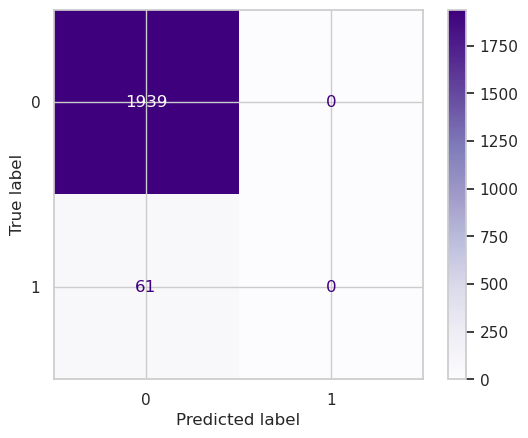

In [225]:
show_confusion_matrix(target_matrices[0])

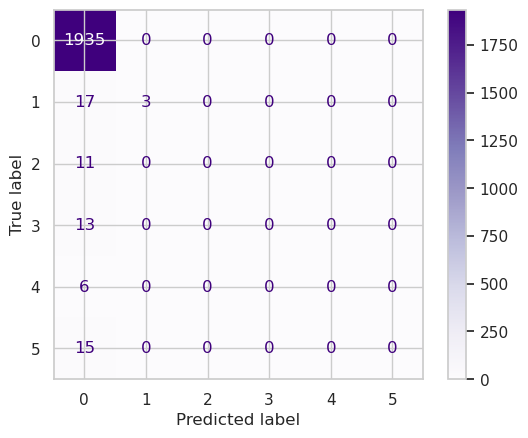

In [226]:
show_confusion_matrix(ftype_matrices[0])

### RandomForestClassifier

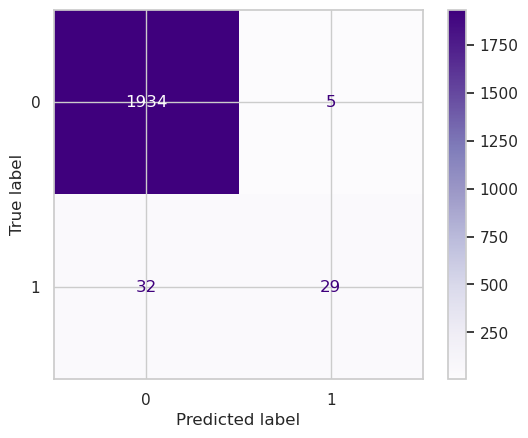

In [227]:
show_confusion_matrix(target_matrices[1])

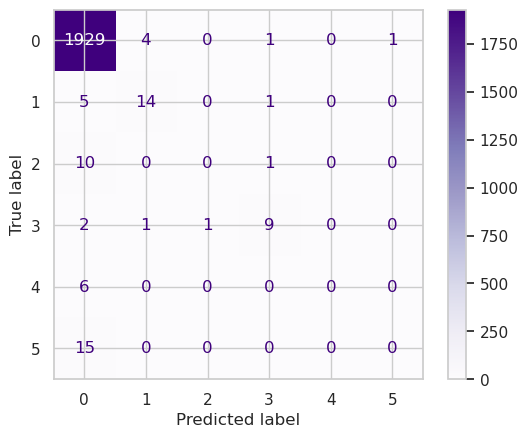

In [228]:
show_confusion_matrix(ftype_matrices[1])

### AdaBoostClassifier

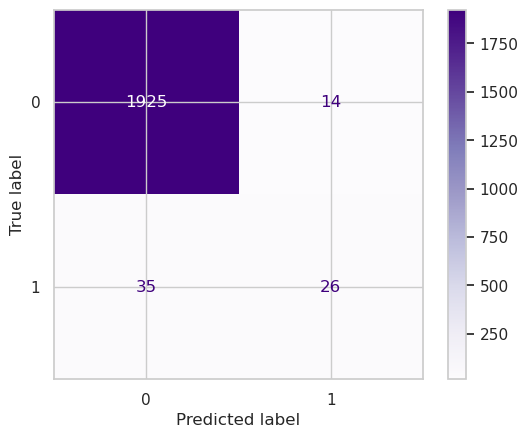

In [229]:
show_confusion_matrix(target_matrices[2])

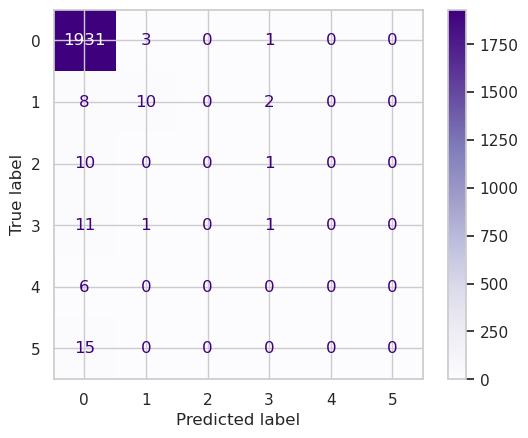

In [230]:
show_confusion_matrix(ftype_matrices[2])

### GradientBoostingClassifier

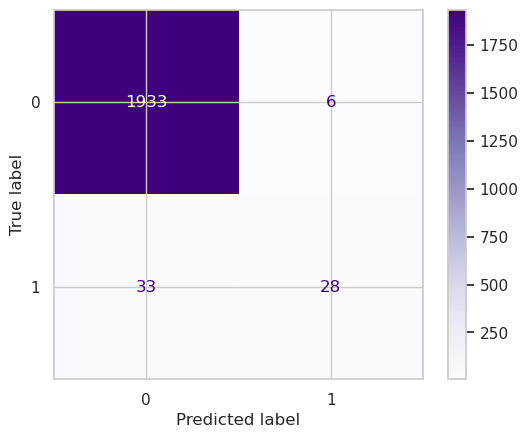

In [231]:
show_confusion_matrix(target_matrices[3])

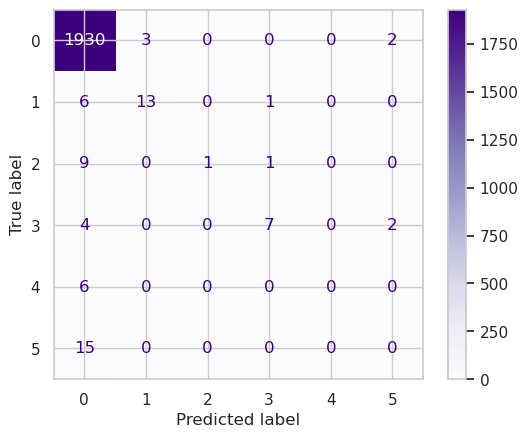

In [232]:
show_confusion_matrix(ftype_matrices[3])

### HistGradientBoostingClassifier

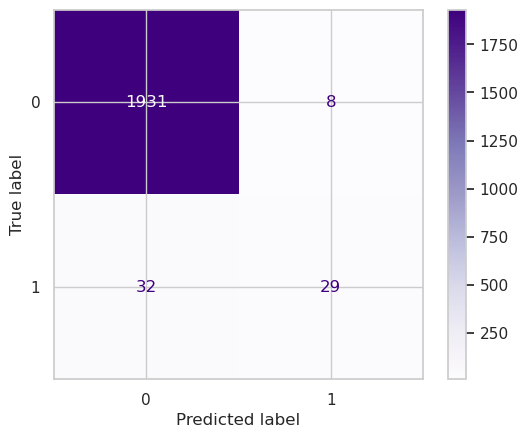

In [233]:
show_confusion_matrix(target_matrices[4])

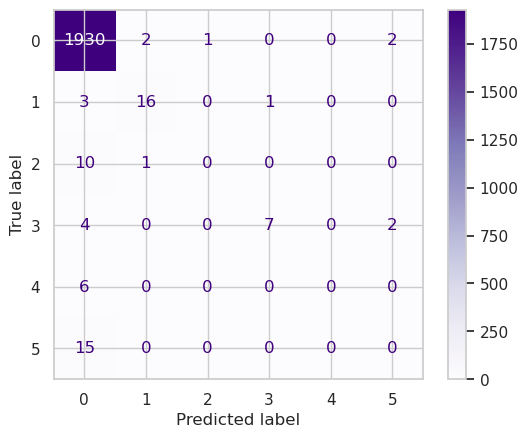

In [234]:
show_confusion_matrix(ftype_matrices[4])

### XGBClassifier

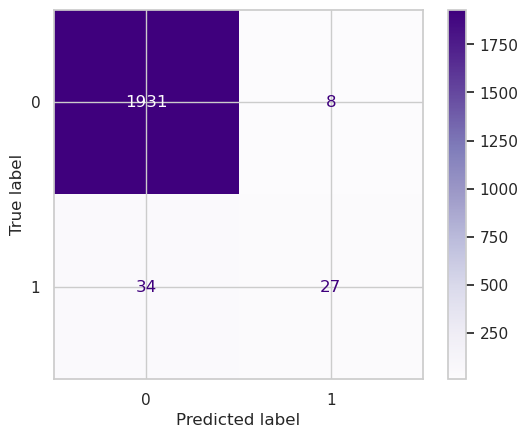

In [235]:
show_confusion_matrix(target_matrices[5])

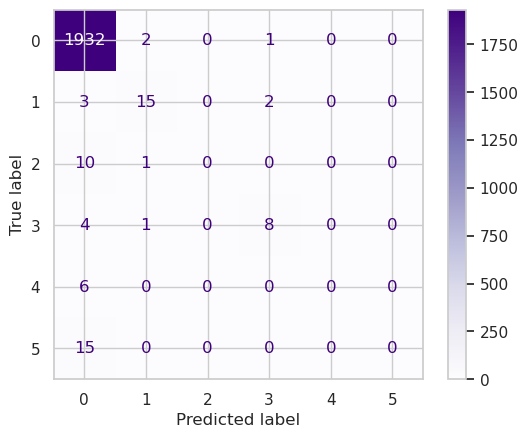

In [236]:
show_confusion_matrix(ftype_matrices[5])

### LGBMClassifier

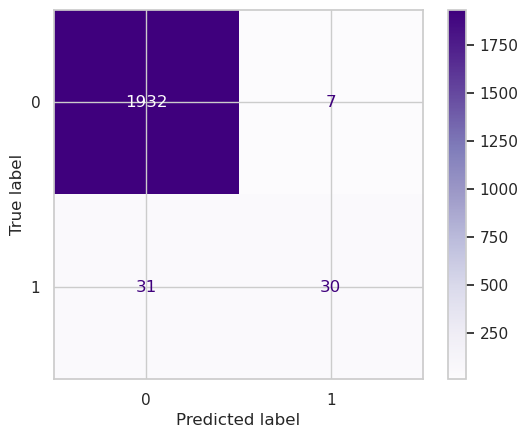

In [237]:
show_confusion_matrix(target_matrices[6])

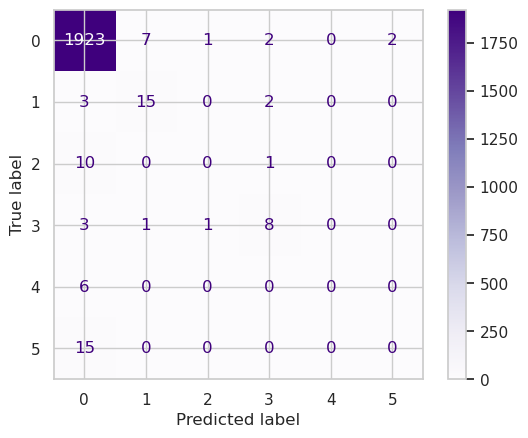

In [238]:
show_confusion_matrix(ftype_matrices[6])

### CatBoostClassifier

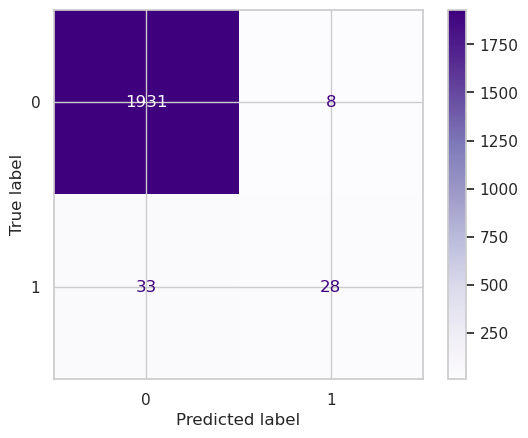

In [239]:
show_confusion_matrix(target_matrices[7])

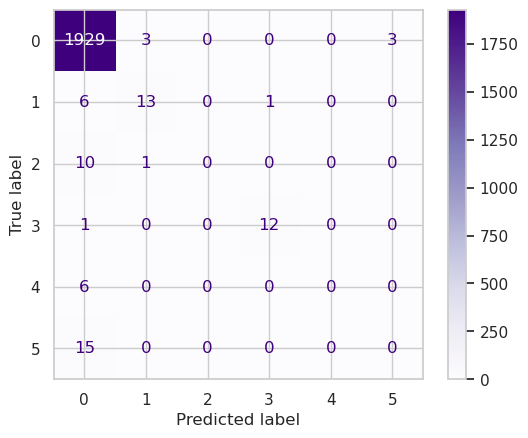

In [240]:
show_confusion_matrix(ftype_matrices[7])

### BaggingClassifier

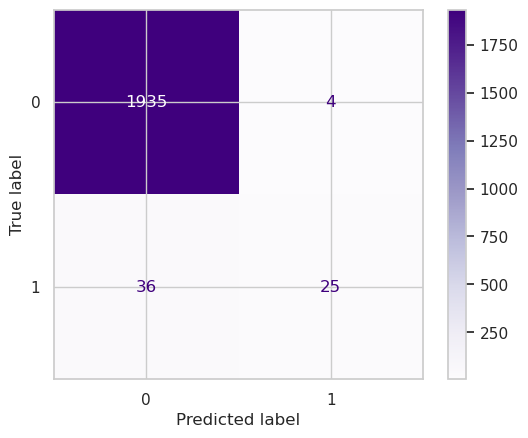

In [241]:
show_confusion_matrix(target_matrices[8])

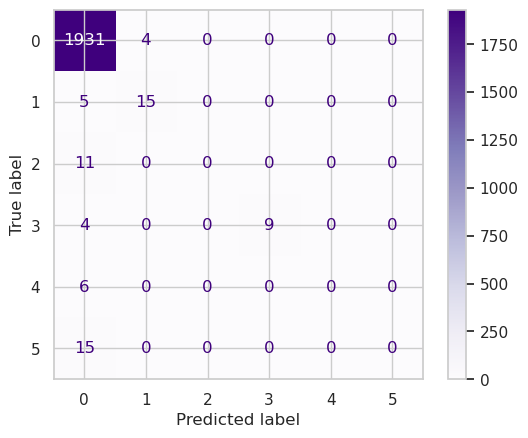

In [242]:
show_confusion_matrix(ftype_matrices[8])

### AdaBoosting

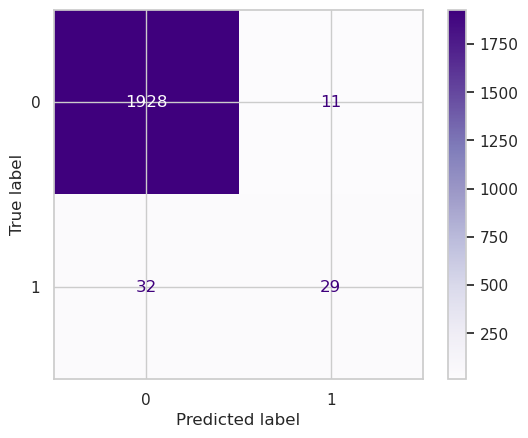

In [243]:
show_confusion_matrix(target_matrices[9])

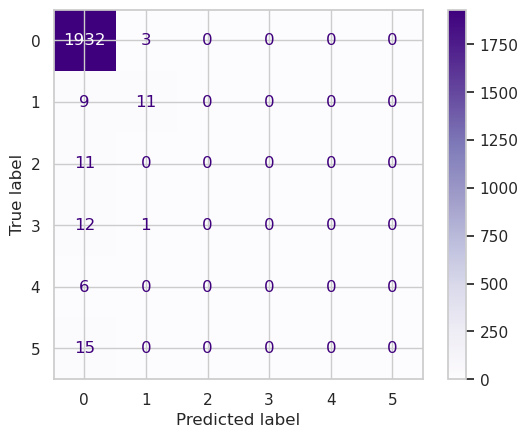

In [244]:
show_confusion_matrix(ftype_matrices[9])

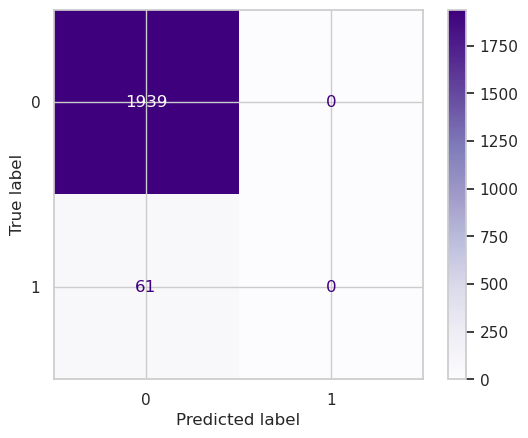

In [245]:
show_confusion_matrix(target_matrices[0])

## Метрики

In [246]:
target_results

,model,fit_time,accuracy,f1,recall
0,BaggingClassifier,0.034435,0.9695,0.954486,0.9695
1,RandomForestClassifier,0.497845,0.9815,0.978935,0.9815
2,AdaBoostClassifier,0.106030,0.9755,0.973019,0.9755
3,GradientBoostingClassifier,0.211871,0.9805,0.977796,0.9805
4,HistGradientBoostingClassifier,0.048045,0.9800,0.977613,0.9800
5,XGBClassifier,0.017184,0.9790,0.976226,0.9790
6,LGBMClassifier,0.010840,0.9810,0.978732,0.9810
7,CatBoostClassifier,0.076230,0.9795,0.976924,0.9795
8,CustomBaggingClassifier,0.038802,0.9800,0.976526,0.9800
9,CustomAdaBoosting,0.112631,0.9785,0.976323,0.9785


In [247]:
ftype_results

,model,fit_time,accuracy,f1,recall
0,BaggingClassifier,0.070505,0.9690,0.954853,0.9690
1,RandomForestClassifier,0.183274,0.9760,0.968450,0.9760
2,AdaBoostClassifier,0.017946,0.9710,0.960763,0.9710
3,GradientBoostingClassifier,0.468283,0.9755,0.968626,0.9755
4,HistGradientBoostingClassifier,0.051709,0.9765,0.969379,0.9765
5,XGBClassifier,0.014305,0.9775,0.969368,0.9775
6,LGBMClassifier,0.036402,0.9730,0.966305,0.9730
7,CatBoostClassifier,0.244254,0.9770,0.969617,0.9770
8,CustomBaggingClassifier,0.759101,0.9775,0.969367,0.9775
9,CustomAdaBoosting,0.024832,0.9715,0.959964,0.9715


Выводы:
- Лучший результат показывают `RandomForestClassifier`, `HistGradientBoostingClassifier` и `LGBMClassifier`
- На задаче бинарной классификации дольше всего обучался `GradientBoostingClassifier`, а на задаче классификации с большим количеством классов: `CustomBaggingClassifier`